# On-sky stability covariance analysis

This notebook analyzes LSSTCam corner Zernike coefficients to build measured covariance/correlation matrices, remap the covariance to Z4–Z28, and compare measured vs simulated results. It also computes OFC/StateEstimator DOF states with and without an explicit measurement noise covariance and summarizes the results with diagnostic plots.

Missing Zernikes in remaps are treated as unmeasured modes (off-diagonal set to 0, diagonal set to 1).

In [2]:
from lsst.rubintv.production.aosUtils import makeDataframeFromZernikes
from lsst.summit.utils import (
    ConsDbClient, 
    getBandpassSeeingCorrection, 
    getAirmassSeeingCorrection,
    makeDefaultButler
)
from lsst.ts.aos.analysis import ofcUtils

from lsst_efd_client import EfdClient
import galsim

import re
import json
import scipy.io
import argparse
import textwrap
import ruamel.yaml
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import traceback
from tqdm import tqdm
from lsst.summit.utils import ConsDbClient, makeDefaultButler
from lsst.ts.ofc import OFCData, StateEstimator

from tqdm import tqdm as tqdm
from pathlib import Path

%load_ext autoreload
%autoreload 2


## Process Variability Test Data

### Helper Methods

In [3]:
def process_day(seq_list, day):
    zernikes_array = []
    seqs_kept = []

    for seq in tqdm(seq_list):
        visitId = int(f"{day}{seq:05d}")
        (expRecord,) = butler.registry.queryDimensionRecords("exposure", dataId={"visit": visitId})
        zernikeTable = butler.get("aggregateZernikesAvg", visit=visitId)
        results, rotMat = makeDataframeFromZernikes(zernikeTable, expRecord.physical_filter)

        z = np.vstack(results['zernikesOCS'].values)    # shape (N_det, N_zern)

        z_flat = z.ravel()
        if z_flat.shape[0] != 92:
            continue
        zernikes_array.append(z_flat)
        seqs_kept.append(int(seq))
    
    if len(zernikes_array) == 0:
        return None, []
    
    arr = np.vstack(zernikes_array)    # shape (N_seq, N_coeff)
    return arr, seqs_kept

def detrend_block(arr):
    N_seq, N_zern = arr.shape
    x = np.arange(N_seq)
    detrended = np.zeros_like(arr)

    for i in range(N_zern):
        y = arr[:, i]
        a, b = np.polyfit(x, y, 1)
        detrended[:, i] = y - (a * x + b)

    return detrended

butler = makeDefaultButler('LSSTCam')

### Querying all days to inspect physical parameters

Query ConsDB across the selected days and assemble a single table used later for environment-binned plots and downstream filtering.

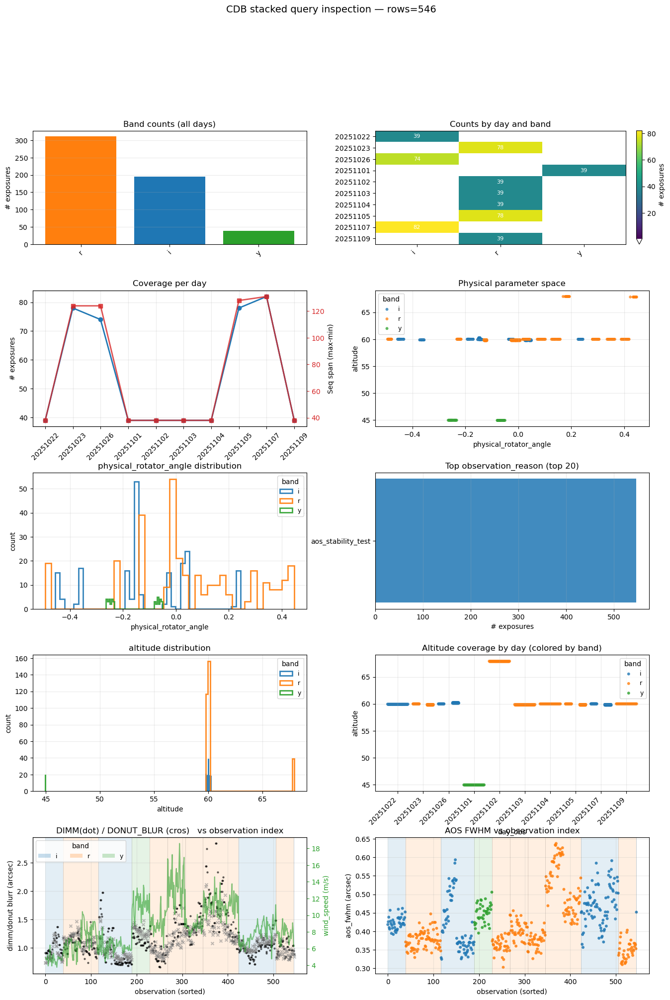

In [4]:
# Build a single CDB table for *all* stability nights/ranges
# using a dictionary {day_obs: [(seq_min, seq_max), ...]}.

# If you already defined this dictionary elsewhere, this cell will reuse it.
if "day_seq_ranges" not in globals():
    day_seq_ranges = {
        20251026: [(378, 412), (464, 502)],
        20251022: [(206, 244)],
        20251023: [(242, 280), (156, 194)],
        20251101: [(308, 346)],
        20251102: [(166, 204)],
        20251103: [(382, 420)],
        20251104: [(225, 263)],
        20251105: [(222, 260), (132, 170)],
        20251107: [(66, 104), (155, 197)],
        20251109: [(144, 182)],
    }

if "cdb_client" not in globals():
    cdb_client = ConsDbClient('http://consdb-pq.consdb:8080/consdb')

def _build_cdb_query(day_obs: int, seq_min: int, seq_max: int) -> str:
    return f'''
    SELECT
    e.seq_num AS seq,
    e.band,
    e.day_obs,
    q.physical_rotator_angle,
    e.altitude,
    e.obs_end,
    e.obs_start,
    e.science_program,
    e.dimm_seeing,
    e.observation_reason,
    e.wind_speed,
    q.aos_fwhm,
    q.donut_blur_fwhm
    FROM
    cdb_lsstcam.visit1_quicklook AS q,
    cdb_lsstcam.exposure AS e
    WHERE
    q.visit_id = e.exposure_id
    AND (e.img_type = 'science' or e.img_type = 'acq' or e.img_type = 'engtest')
    AND e.day_obs = {int(day_obs)}
    AND (e.seq_num BETWEEN {int(seq_min)} and {int(seq_max)})
    '''

# Query each (day, seq-range) and stack
frames = []
for day_obs, ranges in day_seq_ranges.items():
    for seq_min, seq_max in ranges:
        q = _build_cdb_query(day_obs, seq_min, seq_max)
        df = cdb_client.query(q).to_pandas()
        df["seq_min"] = seq_min
        df["seq_max"] = seq_max
        frames.append(df)

cdb_table_all_days = (
    pd.concat(frames, ignore_index=True)
    .drop_duplicates(subset=["day_obs", "seq"], keep="first")
    .sort_values(["day_obs", "seq"])
    .reset_index(drop=True)
    if len(frames) else pd.DataFrame()
)

# IMPORTANT: do NOT overwrite `cdb_table_all` here.
# Use this stacked table explicitly when you want all days.
cdb_table_all_stacked = cdb_table_all_days

# ----------------------------
# Visualization (instead of tables)
# ----------------------------
if len(cdb_table_all_days) == 0:
    raise RuntimeError("No rows returned from ConsDB queries; check day/seq ranges or connectivity.")

# Normalize band labels for plotting
cdb_table_all_days["band"] = cdb_table_all_days["band"].astype(str)
cdb_table_all_days.loc[cdb_table_all_days["band"].isin(["None", "nan", "NaN"]), "band"] = np.nan

bands = [b for b in sorted(cdb_table_all_days["band"].dropna().unique())]
days_sorted = sorted(cdb_table_all_days["day_obs"].dropna().unique())

band_counts = cdb_table_all_days["band"].value_counts(dropna=False)
day_band = pd.crosstab(cdb_table_all_days["day_obs"], cdb_table_all_days["band"], dropna=False).reindex(index=days_sorted)

# Coverage by day: number of rows and seq span
coverage = (
    cdb_table_all_days.groupby("day_obs")["seq"]
    .agg(n="count", seq_min="min", seq_max="max")
    .reindex(days_sorted)
)

# Prepare colors for bands
palette = plt.get_cmap("tab10")
band_to_color = {b: palette(i % 10) for i, b in enumerate(bands)}

fig = plt.figure(figsize=(16, 22))
gs = fig.add_gridspec(nrows=5, ncols=2, height_ratios=[1.0, 1.2, 1.2, 1.2, 1.2], hspace=0.35, wspace=0.25)

# (1) Band counts
ax1 = fig.add_subplot(gs[0, 0])
x_labels = [str(k) for k in band_counts.index]
x_colors = [band_to_color.get(k, "gray") if pd.notna(k) else "lightgray" for k in band_counts.index]
ax1.bar(x_labels, band_counts.values, color=x_colors)
ax1.set_title("Band counts (all days)")
ax1.set_ylabel("# exposures")
ax1.tick_params(axis="x", rotation=45)
ax1.grid(alpha=0.25, axis="y")

# (2) Day x Band heatmap (show zeros as white)
ax2 = fig.add_subplot(gs[0, 1])
heat = day_band.to_numpy()
masked_heat = np.ma.masked_where(heat == 0, heat)
cmap = plt.get_cmap("viridis").copy()
cmap.set_bad("white")
cmap.set_under("white")
ax2.set_facecolor("white")
im = ax2.imshow(masked_heat, aspect="auto", interpolation="nearest", cmap=cmap, vmin=0.5)
ax2.set_title("Counts by day and band")
ax2.set_yticks(np.arange(day_band.shape[0]))
ax2.set_yticklabels(day_band.index.astype(str))
ax2.set_xticks(np.arange(day_band.shape[1]))
ax2.set_xticklabels([str(c) for c in day_band.columns], rotation=45, ha="right")
cbar = fig.colorbar(im, ax=ax2, fraction=0.046, pad=0.04, extend="min")
cbar.set_label("# exposures")
# annotate non-zero entries
for i in range(day_band.shape[0]):
    for j in range(day_band.shape[1]):
        val = heat[i, j]
        if val != 0:
            ax2.text(j, i, str(val), ha="center", va="center", color="white", fontsize=8)

# (3) Coverage by day (rows + seq span)
ax3 = fig.add_subplot(gs[1, 0])
ax3.plot(coverage.index.astype(str), coverage["n"], "-o", lw=2)
ax3.set_title("Coverage per day")
ax3.set_ylabel("# exposures")
ax3.tick_params(axis="x", rotation=45)
ax3.grid(alpha=0.25)

ax3b = ax3.twinx()
ax3b.plot(coverage.index.astype(str), coverage["seq_max"] - coverage["seq_min"], "-s", lw=2, color="tab:red", alpha=0.8)
ax3b.set_ylabel("Seq span (max-min)")
ax3b.tick_params(axis="y", colors="tab:red")

# (4) Physical parameter scatter: rotator angle vs altitude, colored by band
ax4 = fig.add_subplot(gs[1, 1])
for b in bands:
    sub = cdb_table_all_days[cdb_table_all_days["band"] == b]
    ax4.scatter(
        sub["physical_rotator_angle"],
        sub["altitude"],
        s=18,
        alpha=0.75,
        label=str(b),
        color=band_to_color.get(b, None),
        edgecolors="none",
    )
ax4.set_title("Physical parameter space")
ax4.set_xlabel("physical_rotator_angle")
ax4.set_ylabel("altitude")
ax4.grid(alpha=0.25)
if len(bands) <= 10:
    ax4.legend(title="band", loc="best", fontsize=9)

# (5) Rotator angle distribution by band (hist outlines)
ax5 = fig.add_subplot(gs[2, 0])
bins_rot = 40
for b in bands:
    sub = cdb_table_all_days[cdb_table_all_days["band"] == b]
    vals = sub["physical_rotator_angle"].dropna().to_numpy()
    if len(vals) == 0:
        continue
    ax5.hist(vals, bins=bins_rot, histtype="step", lw=2, alpha=0.9, label=str(b), color=band_to_color.get(b, None))
ax5.set_title("physical_rotator_angle distribution")
ax5.set_xlabel("physical_rotator_angle")
ax5.set_ylabel("count")
ax5.grid(alpha=0.25)
if len(bands) <= 10:
    ax5.legend(title="band", fontsize=9)

# (6) Top observation reasons
ax6 = fig.add_subplot(gs[2, 1])
top_reasons = cdb_table_all_days["observation_reason"].astype(str).value_counts(dropna=False).head(20)
ax6.barh(top_reasons.index[::-1], top_reasons.values[::-1], color="tab:blue", alpha=0.85)
ax6.set_title("Top observation_reason (top 20)")
ax6.set_xlabel("# exposures")
ax6.grid(alpha=0.25, axis="x")

# (7) Altitude distribution by band
ax7 = fig.add_subplot(gs[3, 0])
bins_alt = 40
for b in bands:
    sub = cdb_table_all_days[cdb_table_all_days["band"] == b]
    vals = sub["altitude"].dropna().to_numpy()
    if len(vals) == 0:
        continue
    ax7.hist(vals, bins=bins_alt, histtype="step", lw=2, alpha=0.9, label=str(b), color=band_to_color.get(b, None))
ax7.set_title("altitude distribution")
ax7.set_xlabel("altitude")
ax7.set_ylabel("count")
ax7.grid(alpha=0.25)
if len(bands) <= 10:
    ax7.legend(title="band", fontsize=9)

# (8) Altitude by day (jittered by seq), colored by band
ax8 = fig.add_subplot(gs[3, 1])
if len(days_sorted) > 0:
    for i, day in enumerate(days_sorted):
        day_df = cdb_table_all_days[cdb_table_all_days["day_obs"] == day].copy()
        if len(day_df) == 0:
            continue
        seq_min = day_df["seq"].min()
        seq_max = day_df["seq"].max()
        denom = (seq_max - seq_min) if seq_max != seq_min else 1
        for b in bands:
            sub = day_df[day_df["band"] == b]
            if len(sub) == 0:
                continue
            sub_x = i + (sub["seq"] - seq_min) / denom * 0.8 - 0.4
            ax8.scatter(sub_x, sub["altitude"], s=18, alpha=0.8, color=band_to_color.get(b, None), edgecolors="none", label=str(b))

# Deduplicate legend entries
handles, labels = ax8.get_legend_handles_labels()
dedup = {}
for h, l in zip(handles, labels):
    dedup.setdefault(l, h)
if len(dedup) and len(dedup) <= 10:
    ax8.legend(dedup.values(), dedup.keys(), title="band", loc="best", fontsize=9)
ax8.set_xticks(range(len(days_sorted)))
ax8.set_xticklabels([str(d) for d in days_sorted], rotation=45, ha="right")
ax8.set_xlabel("day_obs")
ax8.set_ylabel("altitude")
ax8.set_title("Altitude coverage by day (colored by band)")
ax8.grid(alpha=0.25)

# (9-10) Seeing / AOS FWHM vs observation index, with filter "bands" in the background
def _add_filter_bands(ax, band_labels, color_map, alpha=0.12):
    b = band_labels.to_numpy()
    if len(b) == 0:
        return
    start = 0
    for i in range(1, len(b) + 1):
        if i == len(b) or b[i] != b[i - 1]:
            band_val = b[i - 1]
            color = color_map.get(band_val, "gray")
            ax.axvspan(start - 0.5, i - 0.5, color=color, alpha=alpha, lw=0)
            start = i

df_sorted = cdb_table_all_days.copy()
if "obs_start" in df_sorted.columns:
    df_sorted["obs_start_dt"] = pd.to_datetime(df_sorted["obs_start"], errors="coerce")
    if df_sorted["obs_start_dt"].notna().any():
        df_sorted = df_sorted.sort_values(["obs_start_dt", "day_obs", "seq"])
    else:
        df_sorted = df_sorted.sort_values(["day_obs", "seq"])
else:
    df_sorted = df_sorted.sort_values(["day_obs", "seq"])

for col in ["dimm_seeing", "aos_fwhm", "donut_blur_fwhm", "wind_speed"]:
    if col in df_sorted.columns:
        df_sorted[col] = pd.to_numeric(df_sorted[col], errors="coerce")

x = np.arange(len(df_sorted))
band_labels = df_sorted["band"].astype(str)
color_map_for_bands = {str(b): band_to_color.get(b, "gray") for b in bands}

# Mark day boundaries on the x-axis
day_vals = df_sorted["day_obs"].to_numpy()
day_change_idx = np.where(day_vals[1:] != day_vals[:-1])[0] + 1

from matplotlib.patches import Patch
legend_patches = [Patch(facecolor=band_to_color.get(b, "gray"), edgecolor="none", alpha=0.25, label=str(b)) for b in bands]

ax9 = fig.add_subplot(gs[4, 0])
_add_filter_bands(ax9, band_labels, color_map_for_bands, alpha=0.12)
ax9.scatter(x, df_sorted["dimm_seeing"], marker='.', s=18, alpha=0.5, c="black", label="dimm_seeing")#, edgecolors="none")
ax9.scatter(x, df_sorted["donut_blur_fwhm"], marker='x', s=18, alpha=0.5, c="gray", label="donut_blur") #, edgecolors="none")
# Wind speed on right axis (m/s)
if "wind_speed" in df_sorted.columns:
    ax9b = ax9.twinx()
    wind_vals = pd.to_numeric(df_sorted["wind_speed"], errors="coerce")
    if wind_vals.notna().any():
        ax9b.plot(x, wind_vals.to_numpy(), color="tab:green", lw=1.5, alpha=0.6)
        ax9b.set_ylabel("wind_speed (m/s)", color="tab:green")
        ax9b.tick_params(axis="y", colors="tab:green")
for idx in day_change_idx:
    ax9.axvline(idx - 0.5, color="k", lw=0.5, alpha=0.2)
ax9.set_title("DIMM(dot) / DONUT_BLUR (cros)   vs observation index")
ax9.set_xlabel("observation (sorted)")
ax9.set_ylabel("dimm/donut blurr (arcsec)")
ax9.grid(alpha=0.25)
ax9.legend(handles=legend_patches, title="band", loc="best", fontsize=9, ncols=min(4, max(1, len(bands))))

ax10 = fig.add_subplot(gs[4, 1], sharex=ax9)
_add_filter_bands(ax10, band_labels, color_map_for_bands, alpha=0.12)
ax10.scatter(x, df_sorted["aos_fwhm"], s=18, alpha=0.85, c=band_labels.map(lambda v: color_map_for_bands.get(v, "gray")), edgecolors="none")
for idx in day_change_idx:
    ax10.axvline(idx - 0.5, color="k", lw=0.5, alpha=0.2)
ax10.set_title("AOS FWHM vs observation index")
ax10.set_xlabel("observation (sorted)")
ax10.set_ylabel("aos_fwhm (arcsec)")
ax10.grid(alpha=0.25)

fig.suptitle(f"CDB stacked query inspection — rows={len(cdb_table_all_days)}", y=0.995, fontsize=14)

plt.show()

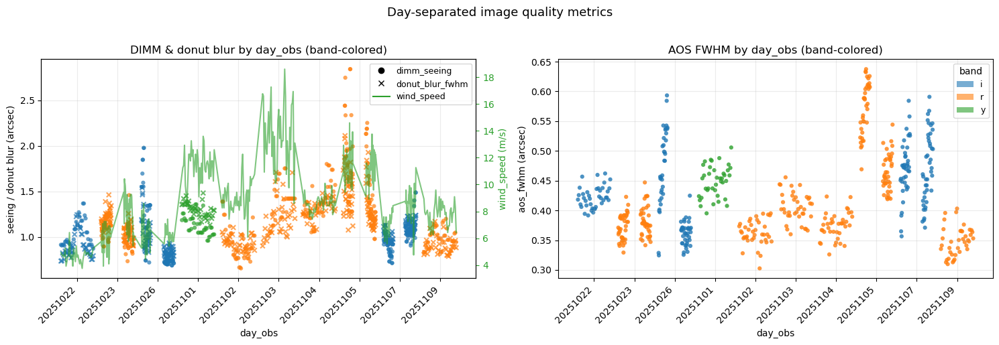

In [5]:
# --- Day-separated seeing / AOS metrics (band-colored, date-filterable) ---
# Configure which days to include (None = all). Example: selected_day_obs = [20251026, 20251101]
selected_day_obs = None  # or list of day_obs ints
x_span = 0.8  # horizontal span used per day for within-day sequencing
if "cdb_table_all_days" not in globals():
    raise NameError("cdb_table_all_days is missing. Run the ConsDB query cell above first.")
df = cdb_table_all_days.copy()
if selected_day_obs is not None:
    keep = set(int(d) for d in selected_day_obs)
    df = df[df["day_obs"].astype(int).isin(keep)].copy()
if len(df) == 0:
    raise RuntimeError("No rows after day_obs filtering; adjust selected_day_obs.")

# Normalize band labels
df["band"] = df["band"].astype(str)
df.loc[df["band"].isin(["None", "nan", "NaN"]), "band"] = np.nan

# Ensure numeric columns
for col in ["dimm_seeing", "aos_fwhm", "donut_blur_fwhm", "wind_speed", "seq"]:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

# Sort by day_obs then seq
df = df.sort_values(["day_obs", "seq"]).reset_index(drop=True)
days_sorted = sorted(df["day_obs"].dropna().unique())

# Band colors
bands = [b for b in sorted(df["band"].dropna().unique())]
palette = plt.get_cmap("tab10")
band_to_color = {b: palette(i % 10) for i, b in enumerate(bands)}
point_colors = df["band"].map(lambda v: band_to_color.get(v, "gray")).to_numpy()

# Build x positions separated by day_obs
x = np.full(len(df), np.nan, dtype=float)
for i, day in enumerate(days_sorted):
    sub = df[df["day_obs"] == day]
    if len(sub) == 0:
        continue
    seq_min = sub["seq"].min()
    seq_max = sub["seq"].max()
    denom = (seq_max - seq_min) if seq_max != seq_min else 1.0
    x_sub = i + (sub["seq"] - seq_min) / denom * x_span - x_span / 2.0
    x[sub.index.values] = x_sub

# Plot: DIMM + donut blur + wind speed (left) and AOS FWHM (right)
fig, (ax9, ax10) = plt.subplots(1, 2, figsize=(15, 5), sharex=True)

# Left panel: DIMM + donut blur, colored by band
ax9.scatter(x, df["dimm_seeing"], marker="o", s=20, alpha=0.7, c=point_colors, edgecolors="none", label="dimm_seeing")
ax9.scatter(x, df["donut_blur_fwhm"], marker="x", s=24, alpha=0.7, c=point_colors, label="donut_blur_fwhm")
ax9.set_ylabel("seeing / donut blur (arcsec)")
ax9.set_title("DIMM & donut blur by day_obs (band-colored)")
ax9.grid(alpha=0.25)

# Wind speed on right axis
ax9b = ax9.twinx()
wind_vals = pd.to_numeric(df["wind_speed"], errors="coerce")
if wind_vals.notna().any():
    ax9b.plot(x, wind_vals.to_numpy(), color="tab:green", lw=1.5, alpha=0.6)
    ax9b.set_ylabel("wind_speed (m/s)", color="tab:green")
    ax9b.tick_params(axis="y", colors="tab:green")

# Right panel: AOS FWHM, colored by band
ax10.scatter(x, df["aos_fwhm"], s=20, alpha=0.8, c=point_colors, edgecolors="none")
ax10.set_ylabel("aos_fwhm (arcsec)")
ax10.set_title("AOS FWHM by day_obs (band-colored)")
ax10.grid(alpha=0.25)

# X-axis ticks = day_obs
ax9.set_xticks(range(len(days_sorted)))
ax9.set_xticklabels([str(d) for d in days_sorted], rotation=45, ha="right")
ax9.set_xlabel("day_obs")
ax10.set_xticks(range(len(days_sorted)))
ax10.set_xticklabels([str(d) for d in days_sorted], rotation=45, ha="right")
ax10.set_xlabel("day_obs")

# Legends: band colors + marker types
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
band_handles = [Patch(facecolor=band_to_color.get(b, "gray"), edgecolor="none", alpha=0.6, label=str(b)) for b in bands]
marker_handles = [
    Line2D([], [], marker="o", color="black", linestyle="None", markersize=6, label="dimm_seeing"),
    Line2D([], [], marker="x", color="black", linestyle="None", markersize=6, label="donut_blur_fwhm"),
    Line2D([], [], color="tab:green", lw=1.5, label="wind_speed"),
 ]
if len(band_handles) > 0:
    ax10.legend(handles=band_handles, title="band", loc="best", fontsize=9)
ax9.legend(handles=marker_handles, loc="best", fontsize=9)

title_suffix = "" if selected_day_obs is None else f" (days={sorted(set(selected_day_obs))})"
fig.suptitle("Day-separated image quality metrics" + title_suffix, y=1.02, fontsize=13)
plt.tight_layout()
plt.show()

In [203]:
# cdb_table_all_days.head(25)

### Processing Data

This cell should be run once to obtain the data from the butler and process them. 

It will query relevant data and detrend them. 

In [6]:
days = {
    20251026: [
        np.arange(378, 413),
        np.arange(464, 503),
    ],
    20251022: [
        np.arange(206, 245),
    ],
    20251023: [
        np.arange(242, 281),
        np.arange(156, 195),
    ],
    20251101: [
        np.arange(308, 347),
    ],
    20251102: [
        np.arange(166, 205),
    ],
    20251103: [
        np.arange(382, 421),
    ],
    20251104: [
        np.arange(225, 264),
    ],
    20251105: [
        np.arange(222, 261),
        np.arange(132, 171),
    ],
    20251107: [
        np.arange(66, 105),
        np.arange(155, 198),
    ],
    20251109: [
        np.arange(144, 183),
    ]
}

detrended_days = []
trended_days = []
sequences_by_block = []

covariances = {}

j = 0
for i, (day, seq_lists) in enumerate(days.items()):
    for seq_list in seq_lists:
        arr_day, seqs_kept = process_day(seq_list, day)
        trended_days.append(arr_day)
        sequences_by_block.append(seqs_kept)
        if arr_day is None:
            continue
        
        detrended_day = detrend_block(arr_day)
        detrended_days.append(detrended_day)
        
        combined = np.vstack(detrended_days)
        cov_matrix = np.cov(combined, rowvar=False)
        
        covariances[j] = cov_matrix
        j += 1
        print(f"{day}: combined samples = {combined.shape[0]}, covariance shape = {cov_matrix.shape}")


100%|██████████| 35/35 [02:42<00:00,  4.66s/it]


20251026: combined samples = 33, covariance shape = (92, 92)


100%|██████████| 39/39 [03:01<00:00,  4.64s/it]


20251026: combined samples = 72, covariance shape = (92, 92)


100%|██████████| 39/39 [03:00<00:00,  4.64s/it]


20251022: combined samples = 111, covariance shape = (92, 92)


100%|██████████| 39/39 [03:00<00:00,  4.64s/it]


20251023: combined samples = 150, covariance shape = (92, 92)


100%|██████████| 39/39 [03:01<00:00,  4.66s/it]


20251023: combined samples = 189, covariance shape = (92, 92)


100%|██████████| 39/39 [03:00<00:00,  4.62s/it]


20251101: combined samples = 228, covariance shape = (92, 92)


100%|██████████| 39/39 [03:00<00:00,  4.63s/it]


20251102: combined samples = 265, covariance shape = (92, 92)


100%|██████████| 39/39 [03:00<00:00,  4.63s/it]


20251103: combined samples = 304, covariance shape = (92, 92)


100%|██████████| 39/39 [03:00<00:00,  4.62s/it]


20251104: combined samples = 343, covariance shape = (92, 92)


100%|██████████| 39/39 [03:00<00:00,  4.63s/it]


20251105: combined samples = 380, covariance shape = (92, 92)


100%|██████████| 39/39 [03:00<00:00,  4.62s/it]


20251105: combined samples = 419, covariance shape = (92, 92)


100%|██████████| 39/39 [03:00<00:00,  4.64s/it]


20251107: combined samples = 458, covariance shape = (92, 92)


100%|██████████| 43/43 [03:18<00:00,  4.62s/it]


20251107: combined samples = 501, covariance shape = (92, 92)


100%|██████████| 39/39 [02:59<00:00,  4.61s/it]

20251109: combined samples = 540, covariance shape = (92, 92)


### Store processed into zernike_cache

This should be run once, after processing the data.

In [11]:
# Persist trended/detrended blocks and covariances to disk for reuse
from pathlib import Path
import json
import numpy as np
import time


def persist_cache(
    days,
    trended_days,
    detrended_days,
    covariances,
    sequences_by_block,
    cache_dir: Path | str = Path("./zernike_cache"),
    detector_names=None,
    force: bool = False,
):
    """Write cached Zernike blocks plus manifest once; returns manifest dict.

    Safety: refuses to write an empty manifest unless force=True.
    This prevents accidental cache clobbering after kernel restarts.
    """
    cache_dir = Path(cache_dir).resolve()
    cache_dir.mkdir(parents=True, exist_ok=True)

    # Flatten days info to keep filenames informative
    block_meta = []
    for day, seq_lists in days.items():
        for seq_list in seq_lists:
            block_meta.append(
                {
                    "day": int(day),
                    "seq_min": int(np.min(seq_list)),
                    "seq_max": int(np.max(seq_list)),
                }
            )

    manifest = {
        "created_unix": int(time.time()),
        "cache_dir": str(cache_dir),
        "trended_blocks": [],
        "detrended_blocks": [],
        "covariances": [],
        "combined": {},
        "column_names": None,
    }

    def _build_column_names(n_coeffs: int, detector_names=None):
        meta_cols = ["day_obs", "seq_num", "visit_id"]
        default_zerns = list(range(4, 27))  # aligns with later plotting (Z4–Z26)
        default_detectors = detector_names or ["R00", "R40", "R04", "R44"]

        data_cols: list[str] = []
        if n_coeffs % len(default_zerns) == 0:
            n_det = n_coeffs // len(default_zerns)
            dets = (
                default_detectors[:n_det]
                if len(default_detectors) >= n_det
                else [f"det{i}" for i in range(n_det)]
            )
            for d in dets:
                for z in default_zerns:
                    if len(data_cols) < n_coeffs:
                        data_cols.append(f"{d}_Z{z}")
        else:
            data_cols = [f"c{i}" for i in range(n_coeffs)]

        return meta_cols + data_cols

    def _with_metadata(arr: np.ndarray, meta: dict, seqs_kept: list[int]):
        if len(seqs_kept) != arr.shape[0]:
            seqs_kept = list(range(meta["seq_min"], meta["seq_min"] + arr.shape[0]))
        visit_ids = [int(f"{meta['day']}{int(s):05d}") for s in seqs_kept]
        meta_cols = np.column_stack(
            (
                np.full(arr.shape[0], meta["day"], dtype=int),
                np.array(seqs_kept, dtype=int),
                np.array(visit_ids, dtype=int),
            )
        )
        return np.hstack((meta_cols, arr))

    # Save per-block arrays with day/seq in filenames
    column_names_reference = None
    for idx, arr in enumerate(trended_days):
        meta = block_meta[idx]
        seqs_kept = sequences_by_block[idx] if idx < len(sequences_by_block) else []
        fname = f"trended_{meta['day']}_{meta['seq_min']}-{meta['seq_max']}.csv"
        if arr is None:
            manifest["trended_blocks"].append(
                {
                    "id": idx,
                    "day": meta["day"],
                    "seq_min": meta["seq_min"],
                    "seq_max": meta["seq_max"],
                    "file": None,
                    "shape": None,
                }
            )
            continue
        column_names = _build_column_names(arr.shape[1], detector_names)
        column_names_reference = column_names
        payload = _with_metadata(arr, meta, seqs_kept)
        path = cache_dir / fname
        np.savetxt(path, payload, delimiter=",", header=",".join(column_names), comments="")
        manifest["trended_blocks"].append(
            {
                "id": idx,
                "day": meta["day"],
                "seq_min": meta["seq_min"],
                "seq_max": meta["seq_max"],
                "file": path.name,
                "shape": list(arr.shape),
            }
        )

    for idx, arr in enumerate(detrended_days):
        meta = block_meta[idx]
        seqs_kept = sequences_by_block[idx] if idx < len(sequences_by_block) else []
        fname = f"detrended_{meta['day']}_{meta['seq_min']}-{meta['seq_max']}.csv"
        column_names = column_names_reference or _build_column_names(arr.shape[1], detector_names)
        payload = _with_metadata(arr, meta, seqs_kept)
        path = cache_dir / fname
        np.savetxt(path, payload, delimiter=",", header=",".join(column_names), comments="")
        manifest["detrended_blocks"].append(
            {
                "id": idx,
                "day": meta["day"],
                "seq_min": meta["seq_min"],
                "seq_max": meta["seq_max"],
                "file": path.name,
                "shape": list(arr.shape),
            }
        )

    manifest["column_names"] = column_names_reference

    # Save covariance snapshots (aligned with block order)
    for cov_id, cov in covariances.items():
        meta = block_meta[cov_id]
        fname = f"covariance_{meta['day']}_{meta['seq_min']}-{meta['seq_max']}.csv"
        path = cache_dir / fname
        np.savetxt(
            path,
            cov,
            delimiter=",",
            header=",".join([f"c{i}" for i in range(cov.shape[1])]),
            comments="",
        )
        manifest["covariances"].append(
            {
                "id": int(cov_id),
                "day": meta["day"],
                "seq_min": meta["seq_min"],
                "seq_max": meta["seq_max"],
                "file": path.name,
                "shape": list(cov.shape),
            }
        )

    # Optional combined stacks
    if detrended_days and column_names_reference is not None:
        combined_rows = []
        for idx, arr in enumerate(detrended_days):
            meta = block_meta[idx]
            seqs_kept = sequences_by_block[idx] if idx < len(sequences_by_block) else []
            payload = _with_metadata(arr, meta, seqs_kept)
            combined_rows.append(payload)
        combined_det = np.vstack(combined_rows)
        path = cache_dir / "detrended_all.csv"
        np.savetxt(path, combined_det, delimiter=",", header=",".join(column_names_reference), comments="")
        manifest["combined"]["detrended_all"] = {
            "file": path.name,
            "shape": list(combined_det.shape),
        }

    valid_trended = [a for a in trended_days if a is not None]
    if valid_trended and column_names_reference is not None:
        combined_rows = []
        for idx, arr in enumerate(trended_days):
            if arr is None:
                continue
            meta = block_meta[idx]
            seqs_kept = sequences_by_block[idx] if idx < len(sequences_by_block) else []
            payload = _with_metadata(arr, meta, seqs_kept)
            combined_rows.append(payload)
        combined_tr = np.vstack(combined_rows)
        path = cache_dir / "trended_all.csv"
        np.savetxt(path, combined_tr, delimiter=",", header=",".join(column_names_reference), comments="")
        manifest["combined"]["trended_all"] = {
            "file": path.name,
            "shape": list(combined_tr.shape),
        }

    manifest_path = cache_dir / "manifest.json"
    is_empty = (
        len(manifest["trended_blocks"]) == 0
        and len(manifest["detrended_blocks"]) == 0
        and len(manifest["covariances"]) == 0
        and not manifest.get("combined")
    )

    if is_empty and not force:
        print(f"[cache] Not writing empty manifest to {manifest_path}.")
        print("[cache] Run process_day/build arrays first, or use force=True if you really want an empty cache.")
        return manifest

    with open(manifest_path, "w", encoding="utf-8") as fp:
        json.dump(manifest, fp, indent=2)

    print(f"Cache written to {cache_dir}")
    return manifest


# Toggle this call on when you need to refresh the cache
#persist_cache(days, trended_days, detrended_days, covariances, sequences_by_block)


### Load stored data

This will look into the cache folder (`.zernike_cache`). 

In [6]:
def _manifest_summary(manifest: dict) -> dict:
    return {
        "trended_blocks": len(manifest.get("trended_blocks", [])),
        "detrended_blocks": len(manifest.get("detrended_blocks", [])),
        "covariances": len(manifest.get("covariances", [])),
        "combined": list((manifest.get("combined") or {}).keys()),
    }


def _load_cache(cache_dir: Path):
    cache_dir = Path(cache_dir).resolve()
    manifest_path = cache_dir / "manifest.json"

    print(f"[cache] Using cache_dir = {cache_dir}")
    if not manifest_path.exists():
        raise FileNotFoundError(f"Missing cache manifest at {manifest_path}")

    with open(manifest_path, "r", encoding="utf-8") as fp:
        manifest = json.load(fp)

    print("[cache] manifest entries:", _manifest_summary(manifest))

    trended_days = []
    detrended_days = []
    covariances = {}

    def _load_csv(path: Path, shape_hint, drop_meta: bool = True):
        raw = np.loadtxt(path, delimiter=",", skiprows=1)
        raw = np.atleast_2d(raw)
        if drop_meta:
            raw = raw[:, 3:]  # drop day_obs, seq_num, visit_id
        if shape_hint:
            raw = raw.reshape(tuple(shape_hint))
        return raw

    for entry in manifest.get("trended_blocks", []):
        file_name = entry.get("file")
        if not file_name:
            trended_days.append(None)
            continue
        arr = _load_csv(cache_dir / file_name, entry.get("shape"), drop_meta=True)
        trended_days.append(arr)

    for entry in manifest.get("detrended_blocks", []):
        file_name = entry.get("file")
        if not file_name:
            continue
        arr = _load_csv(cache_dir / file_name, entry.get("shape"), drop_meta=True)
        detrended_days.append(arr)

    for entry in manifest.get("covariances", []):
        file_name = entry.get("file")
        if not file_name:
            continue
        cov = _load_csv(cache_dir / file_name, entry.get("shape"), drop_meta=False)
        covariances[int(entry["id"])] = cov

    print(
        f"Loaded {sum(a is not None for a in trended_days)} trended blocks, "
        f"{len(detrended_days)} detrended blocks, {len(covariances)} covariance snapshots "
        f"from {cache_dir}"
    )

    return manifest, trended_days, detrended_days, covariances


def _find_nonempty_manifests(search_roots: list[Path], max_hits: int = 20):
    hits = []
    for root in search_roots:
        root = Path(root).resolve()
        if not root.exists():
            continue
        for mp in root.rglob("manifest.json"):
            try:
                with open(mp, "r", encoding="utf-8") as fp:
                    m = json.load(fp)
                summary = _manifest_summary(m)
                nonempty = any(
                    [summary["trended_blocks"], summary["detrended_blocks"], summary["covariances"], summary["combined"]]
                )
                if nonempty:
                    hits.append((mp, summary, mp.stat().st_mtime))
            except Exception:
                continue
    hits.sort(key=lambda t: t[2], reverse=True)
    return hits[:max_hits]


# Default location (relative to CWD). If empty, auto-discover another cache.
cache_dir = Path("./zernike_cache")

manifest, trended_days, detrended_days, covariances = _load_cache(cache_dir)

summary = _manifest_summary(manifest)
if summary["trended_blocks"] == 0 and summary["detrended_blocks"] == 0 and summary["covariances"] == 0 and len(summary["combined"]) == 0:
    print("[cache] NOTE: manifest is present but empty.")
    print("[cache] Attempting to locate a non-empty manifest.json...")

    search_roots = [Path.cwd(), Path.cwd().parent, Path.home() / "notebooks"]
    hits = _find_nonempty_manifests(search_roots)

    if hits:
        print("[cache] Found non-empty cache candidates (most recent first):")
        for mp, s, _ in hits[:10]:
            print(f"  - {mp.parent} -> {s}")
        # Auto-select the most recent candidate
        best_manifest_path, best_summary, _ = hits[0]
        print(f"[cache] Auto-selecting: {best_manifest_path.parent}")
        manifest, trended_days, detrended_days, covariances = _load_cache(best_manifest_path.parent)
    else:
        print("[cache] No non-empty manifest.json found under:")
        for r in search_roots:
            print(f"  - {r.resolve()}")
        print("[cache] If you already wrote the cache elsewhere, set cache_dir to that folder.")


[cache] Using cache_dir = /home/dsanmartim/notebooks/aos_notebooks/zernike_cache
[cache] manifest entries: {'trended_blocks': 14, 'detrended_blocks': 14, 'covariances': 14, 'combined': ['detrended_all', 'trended_all']}
Loaded 14 trended blocks, 14 detrended blocks, 14 covariance snapshots from /home/dsanmartim/notebooks/aos_notebooks/zernike_cache


### Plotting Trended vs Detrended

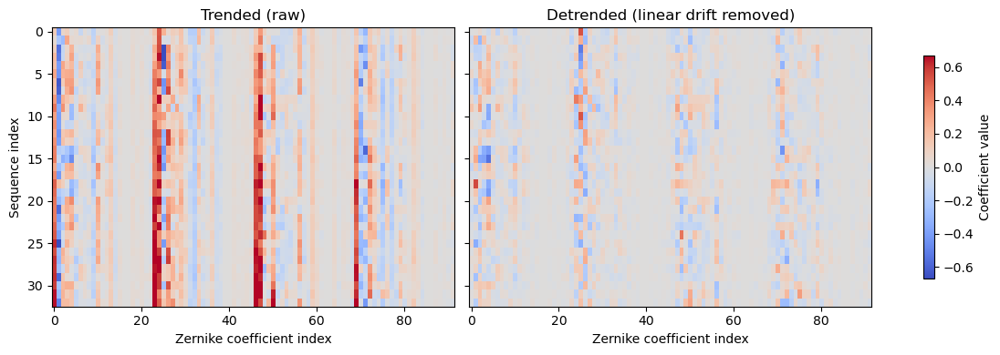

In [7]:
# Compare one block before/after detrending
valid_trended = [a for a in trended_days if a is not None]
if len(valid_trended) == 0:
    print("No trended data available to plot.")
else:
    arr = valid_trended[0]
    arr_det = detrend_block(arr)

    vlim = np.nanpercentile(np.abs(arr), 99)

    fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
    im0 = axes[0].imshow(arr, aspect="auto", cmap="coolwarm", vmin=-vlim, vmax=vlim)
    axes[0].set_title("Trended (raw)")
    axes[0].set_ylabel("Sequence index")
    axes[0].set_xlabel("Zernike coefficient index")

    im1 = axes[1].imshow(arr_det, aspect="auto", cmap="coolwarm", vmin=-vlim, vmax=vlim)
    axes[1].set_title("Detrended (linear drift removed)")
    axes[1].set_xlabel("Zernike coefficient index")

    plt.tight_layout()
    fig.colorbar(im0, ax=axes.ravel().tolist(), shrink=0.8, label="Coefficient value")



### Detrending diagnostics (extra plots)

Generate additional plots comparing trended vs detrended Zernike coefficients to verify the detrending choices.

We can see that the raw data is missing Z20 and Z21. Later we will remap them.

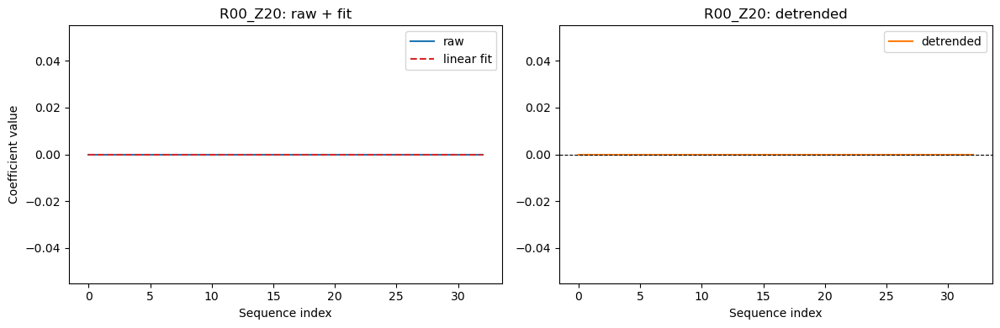

In [8]:
# Plot a single coefficient before/after detrending
from typing import Optional


def plot_single_coeff(
    block_idx: int = 2,
    detector: str = "R00",
    zernike: int = 4,
    column_name: Optional[str] = None,
):
    """Plot one coefficient's raw series with linear fit and its detrended residual."""
    if block_idx >= len(trended_days) or trended_days[block_idx] is None:
        print(f"No trended data at block {block_idx}.")
        return

    arr = trended_days[block_idx]

    if manifest.get("column_names"):
        base_cols = manifest["column_names"][3:]  # drop meta columns
    else:
        base_cols = [f"c{i}" for i in range(arr.shape[1])]

    target = column_name or f"{detector}_Z{zernike}"
    if target not in base_cols:
        print(f"Column '{target}' not found. Available: {base_cols[:]}")
        return

    col_idx = base_cols.index(target)
    y = arr[:, col_idx]
    x = np.arange(len(y))

    a, b = np.polyfit(x, y, 1)
    y_fit = a * x + b
    y_det = y - y_fit

    fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharex=True)
    axes[0].plot(x, y, label="raw", color="C0")
    axes[0].plot(x, y_fit, label="linear fit", color="C3", linestyle="--")
    axes[0].set_title(f"{target}: raw + fit")
    axes[0].set_xlabel("Sequence index")
    axes[0].set_ylabel("Coefficient value")
    axes[0].legend()

    axes[1].plot(x, y_det, label="detrended", color="C1")
    axes[1].axhline(0, color="k", lw=0.8, linestyle="--")
    axes[1].set_title(f"{target}: detrended")
    axes[1].set_xlabel("Sequence index")
    axes[1].legend()

    plt.tight_layout()


# Toggle on when needed
plot_single_coeff(block_idx=0, detector="R00", zernike=20)

### Detrending diagnostics (summary)

Plot summary diagnostics for detrended vs trended data to confirm stability and remove residual trends.

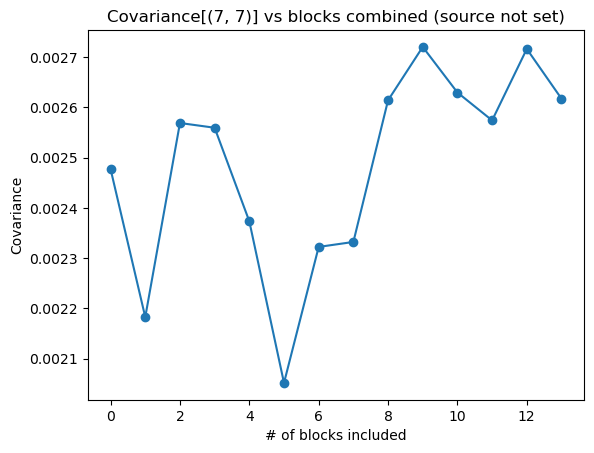

In [9]:
# Track a single covariance element as we add blocks (uses the same source as the C_new covariance)
pair = (7, 7)

cov_src = covariances_for_plots if "covariances_for_plots" in globals() else covariances

if len(cov_src) == 0:
    raise ValueError("No covariance snapshots available.")

evolution = [cov[pair] for _, cov in sorted(cov_src.items(), key=lambda kv: kv[0])]

label = COV_SOURCE if "COV_SOURCE" in globals() else "(source not set)"
plt.plot(evolution, "-o")
plt.title(f"Covariance[{pair}] vs blocks combined {label}")
plt.xlabel("# of blocks included")
plt.ylabel("Covariance")
plt.show()


### Covariance element stability

Track a selected covariance element across cumulative blocks to see convergence and temporal stability.

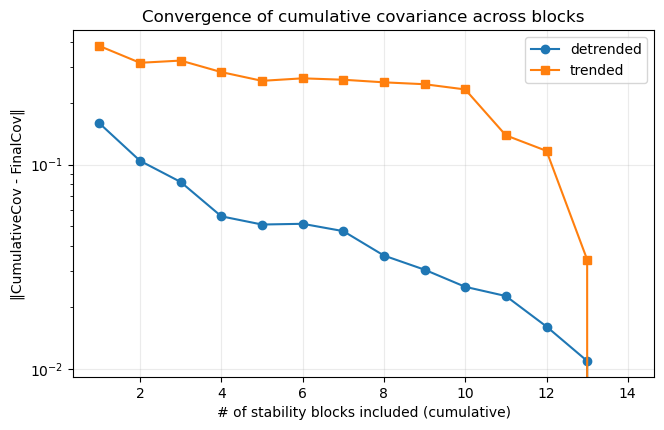

[cov] COV_SOURCE=detrended, final_key=13, combined_all samples=540
[cov] ||final - recomputed||_F = 0.000e+00


In [10]:
# Choose which data to use when building the covariance used for C_new
# Default: detrended (recommended for stability covariance)
COV_SOURCE = "detrended"   # "detrended" | "trended"

if COV_SOURCE not in ("detrended", "trended"):
    raise ValueError("COV_SOURCE must be 'detrended' or 'trended'")

def build_cumulative_covariances(blocks):
    covs = {}
    stacked = []
    for j, block in enumerate(blocks):
        stacked.append(block)
        covs[j] = np.cov(np.vstack(stacked), rowvar=False)
    return covs

# Build cumulative covariance sequences for BOTH sources (for comparison plots)
blocks_detrended = detrended_days
blocks_trended = [a for a in trended_days if a is not None]

if len(blocks_detrended) == 0:
    raise ValueError("No detrended blocks available. Run the processing cell first.")
if len(blocks_trended) == 0:
    raise ValueError("No trended blocks available. Run the processing cell first.")

cov_det = build_cumulative_covariances(blocks_detrended)
cov_tr  = build_cumulative_covariances(blocks_trended)

final_det = cov_det[max(cov_det.keys())]
final_tr  = cov_tr[max(cov_tr.keys())]

fro_det = [np.linalg.norm(c - final_det) for _, c in sorted(cov_det.items(), key=lambda kv: kv[0])]
fro_tr  = [np.linalg.norm(c - final_tr)  for _, c in sorted(cov_tr.items(),  key=lambda kv: kv[0])]

# Plot convergence curves for BOTH detrended and trended on the same axes
plt.figure(figsize=(7.5, 4.5))
plt.semilogy(range(1, len(fro_det) + 1), fro_det, "-o", label="detrended")
plt.semilogy(range(1, len(fro_tr) + 1),  fro_tr,  "-s", label="trended")
plt.xlabel("# of stability blocks included (cumulative)")
plt.ylabel("‖CumulativeCov - FinalCov‖")
plt.title("Convergence of cumulative covariance across blocks")
#plt.ylim(1e-4, 1e0)
plt.grid(alpha=0.25)
plt.legend()
plt.show()

# Select which covariance is used downstream for `final` / C_new remapping
if COV_SOURCE == "detrended":
    covariances_for_plots = cov_det
    blocks_for_cov = blocks_detrended
else:
    covariances_for_plots = cov_tr
    blocks_for_cov = blocks_trended

final_key = max(covariances_for_plots.keys())
final = covariances_for_plots[final_key]

# Sanity check: recompute directly from all chosen samples
combined_all = np.vstack(blocks_for_cov)
final_recomputed = np.cov(combined_all, rowvar=False)
print(f"[cov] COV_SOURCE={COV_SOURCE}, final_key={final_key}, combined_all samples={combined_all.shape[0]}")
print(f"[cov] ||final - recomputed||_F = {np.linalg.norm(final - final_recomputed):.3e}")

### Plot Cov Matrix of Detrended Zernikes

Saved covariance_matrix_detrended.png


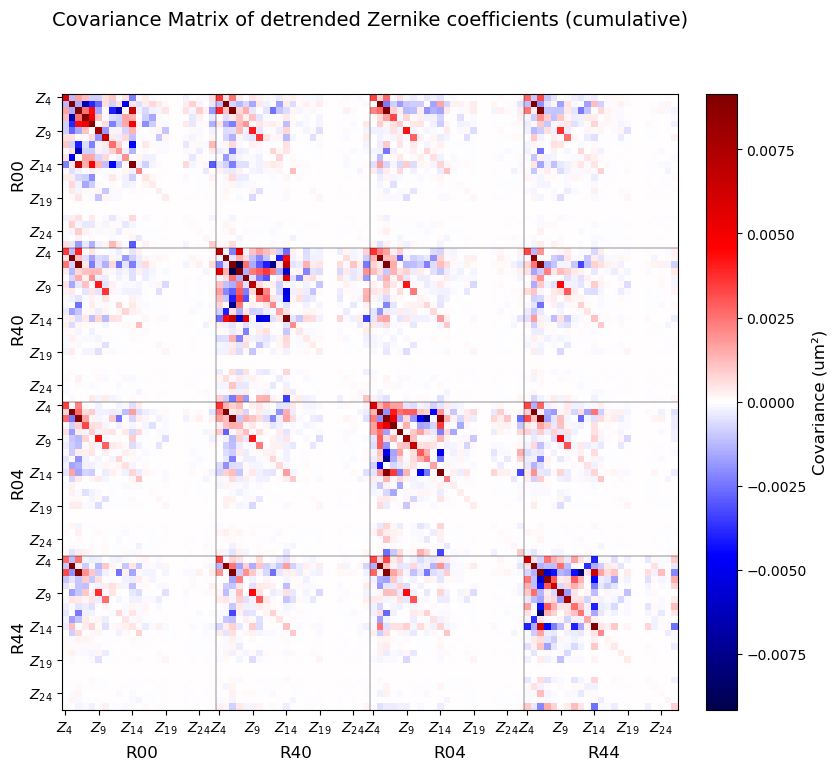

In [11]:
# Use the cumulative covariance after all blocks (same as the "final" above).
# NOTE: this is not “last day only”; it is “last cumulative snapshot”.

# Covariance matrix used for remapping -> C_new
# `final` is defined in the convergence cell above, and respects COV_SOURCE.

vals = final
detectors = ["R00", "R40", "R04", "R44"]
zern_indices = np.arange(4, 27)

zernikes = [fr"$Z_{i}$" for i in zern_indices]   # Z_4 → Z_26
n_zern, n_det = len(zernikes), len(detectors)
N = n_zern * n_det

fig, ax = plt.subplots(figsize=(9, 8))
vmax = np.percentile(np.abs(vals), 99.5)
im = ax.imshow(vals, cmap="seismic", vmin=-vmax, vmax=vmax)

# --- Tick positions every ~5 Zernikes only ---
step = 5
tick_pos = np.arange(0, len(zern_indices), step)
tick_labels = [rf"$Z_{{{zern_indices[i]}}}$" for i in tick_pos]

# --- Add detector block separators ---
for i in range(1, n_det):
    ax.axhline(i * n_zern - 0.5, color="k", lw=0.3)
    ax.axvline(i * n_zern - 0.5, color="k", lw=0.3)

# --- Repeat these within each detector block ---
xticks, yticks, xlabels, ylabels = [], [], [], []
for d in range(n_det):
    offset = d * n_zern
    xticks.extend(offset + tick_pos)
    yticks.extend(offset + tick_pos)
    xlabels.extend(tick_labels)
    ylabels.extend(tick_labels)

ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.set_xticklabels(xlabels, fontsize=10)
ax.set_yticklabels(ylabels, fontsize=10)
ax.grid(False)

# --- Add detector labels centered over their block ---
for i, det in enumerate(detectors):
    mid = (i + 0.5) * n_zern
    ax.text(mid, 99, det, ha="center", va="bottom", fontsize=12)
    ax.text(-6, mid, det, ha="right", va="center", fontsize=12, rotation=90)

# --- Axis titles ---
ax.set_title("Covariance Matrix of detrended Zernike coefficients (cumulative)", fontsize=14, pad=50)

# --- Colorbar, properly sized ---
cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("Covariance (um²)", fontsize=12)
cbar.ax.tick_params(labelsize=10)

# Avoid overwriting when switching between detrended/trended
out_png = f"covariance_matrix_{COV_SOURCE}.png"
plt.savefig(out_png, dpi=600)
print(f"Saved {out_png}")

### Remap Cov Matrix

In [12]:
C = vals  # rename for clarity

current_indices = list(range(4, 27))
target_indices  = list(range(4, 29))   # 4 through 28 inclusive

# Zernikes that are present in the raw index range but effectively missing in the data
# (e.g., all-zero raw coefficients). Treat them like missing: diag=1, offdiag=0.
zero_raw_zernikes = [20, 21]

# How many detectors?
print(C.shape[0])
n_det = C.shape[0] // len(current_indices)
print(n_det)
assert C.shape[0] == n_det * len(current_indices)

# Build new empty (filled with 0)
C_new = np.zeros((n_det * len(target_indices), n_det * len(target_indices)))

# Mapping from old → new indices
for d in range(n_det):
    for i_old, zk in enumerate(current_indices):
        i_new = target_indices.index(zk)
        C_new[d*len(target_indices)+i_new, d*len(target_indices)+i_new] = C[d*len(current_indices)+i_old,
                                                                          d*len(current_indices)+i_old]

# Now insert full covariance for the known ones
for d1 in range(n_det):
    for d2 in range(n_det):
        for i_old, zk1 in enumerate(current_indices):
            for j_old, zk2 in enumerate(current_indices):
                i_new = target_indices.index(zk1)
                j_new = target_indices.index(zk2)
                C_new[d1*len(target_indices)+i_new, d2*len(target_indices)+j_new] = \
                    C[d1*len(current_indices)+i_old, d2*len(current_indices)+j_old]

# For missing indices (nonexistent Zernikes):
# explicitly enforce diag=1 and offdiag=0 (no eps*I; no regularization).
for zk in target_indices:
    if zk not in current_indices:
        i_new = target_indices.index(zk)
        for d in range(n_det):
            idx = d*len(target_indices)+i_new
            C_new[idx, :] = 0.0
            C_new[:, idx] = 0.0
            C_new[idx, idx] = 1.0

# For raw-zero Zernikes (e.g., Z20/Z21), apply the same missing-mode treatment.
for zk in zero_raw_zernikes:
    if zk in target_indices:
        i_new = target_indices.index(zk)
        for d in range(n_det):
            idx = d*len(target_indices)+i_new
            C_new[idx, :] = 0.0
            C_new[:, idx] = 0.0
            C_new[idx, idx] = 1.0


92
4


### Plot Remapped Cov. Matrix

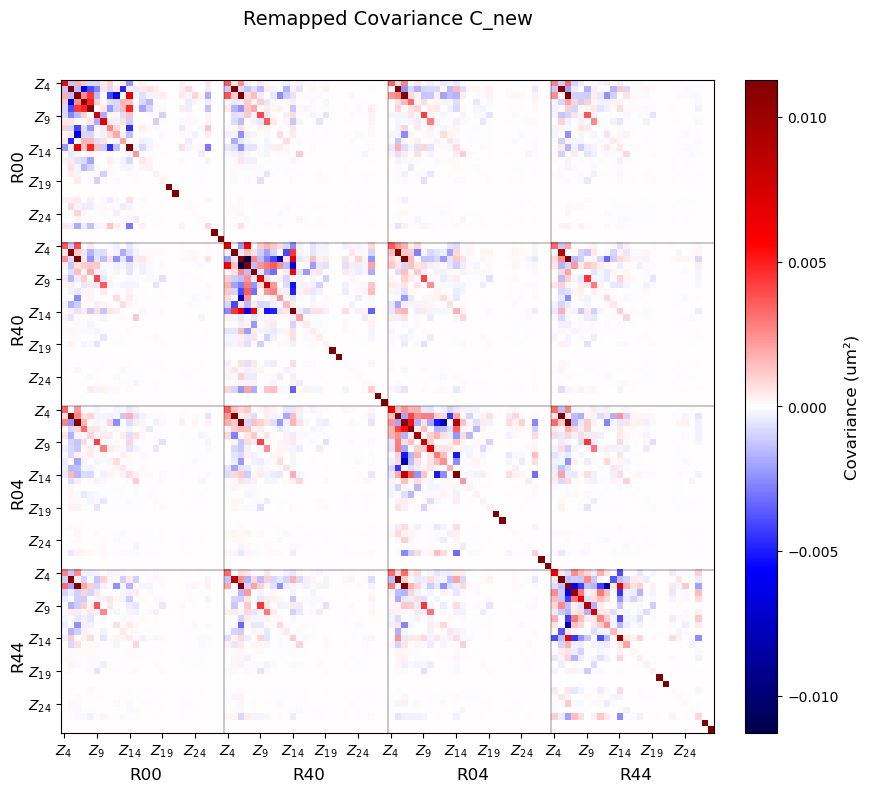

In [13]:
# Plot remapped covariance (C_new) with detector/Zernike blocks
vals_plot = C_new
zern_indices_plot = target_indices if 'target_indices' in locals() else list(range(4, 29))

detectors_plot = ["R00", "R40", "R04", "R44"]
n_zern_plot = len(zern_indices_plot)
n_det_plot = vals_plot.shape[0] // n_zern_plot
assert vals_plot.shape[0] == n_det_plot * n_zern_plot, "C_new shape mismatch with detector/Zernike grid"

fig, ax = plt.subplots(figsize=(9, 8))
vmax = np.percentile(np.abs(vals_plot), 99.5)
im = ax.imshow(vals_plot, cmap="seismic", vmin=-vmax, vmax=vmax)

step = 5
tick_pos = np.arange(0, len(zern_indices_plot), step)
tick_labels = [rf"$Z_{{{zern_indices_plot[i]}}}$" for i in tick_pos]

for i in range(1, n_det_plot):
    ax.axhline(i * n_zern_plot - 0.5, color="k", lw=0.3)
    ax.axvline(i * n_zern_plot - 0.5, color="k", lw=0.3)

xticks, yticks, xlabels, ylabels = [], [], [], []
for d in range(n_det_plot):
    offset = d * n_zern_plot
    xticks.extend(offset + tick_pos)
    yticks.extend(offset + tick_pos)
    xlabels.extend(tick_labels)
    ylabels.extend(tick_labels)

ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.set_xticklabels(xlabels, fontsize=10)
ax.set_yticklabels(ylabels, fontsize=10)
ax.grid(False)

for i, det in enumerate(detectors_plot[:n_det_plot]):
    mid = (i + 0.5) * n_zern_plot
    ax.text(mid, vals_plot.shape[0] - 1 + 8, det, ha="center", va="bottom", fontsize=12)
    ax.text(-6, mid, det, ha="right", va="center", fontsize=12, rotation=90)

ax.set_title("Remapped Covariance C_new", fontsize=14, pad=40)
cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("Covariance (um²)", fontsize=12)
cbar.ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()

### Export remapped covariance

The next cell writes the remapped, non-regularized covariance to a YAML payload for database ingestion.

### Write Cov (not regularized) to database

In [14]:
with open(
    "/home/dsanmartim/notebooks/aos_notebooks/covariance_state_estimation/onsky_stability_covariance_.yaml",
    "w",
) as yaml_file:
    yaml_file.write(
        "--- \n "
        "\n # Measurement noise covariance matrix. "
        "\n # Dimensions: (25*4,25*4). From j_min = 4 to j_max = 28. "
        "\n # These values were generated from on-sky stability tests. "
        "\n # In particular the following data was used: "
        "\n # Night → Sequence ranges: "
        "\n # "
        "\n # 2025-10-26 : 378–412, 464–502 "
        "\n # 2025-10-22 : 206–244 "
        "\n # 2025-10-23 : 242–280, 156–194 "
        "\n # 2025-11-01 : 308–346 "
        "\n # 2025-11-02 : 166–204 "
        "\n # 2025-11-03 : 382–420 "
        "\n # 2025-11-04 : 225–263 "
        "\n # 2025-11-05 : 221–260, 132–170 "
        "\n # 2025-11-07 : 66–104, 155–197 "
        "\n # 2025-11-09 : 144–182 "
        "\n # Units: um^2 of Zk "
        "\n \n"
    )

    yaml = ruamel.yaml.YAML()
    yaml.indent(offset=2)
    yaml.width = 80

    for idx, sublist in enumerate(C_new.tolist()):
        prefix = "  " if idx != 0 else ""
        formatted_sublist = textwrap.fill(
            "- [" + ", ".join(map(str, sublist)) + "]",
            width=100,
            subsequent_indent="  ",
        )
        yaml_file.write(prefix + formatted_sublist + "\n")


### Helper Methods to Estimate States


In [15]:
# Canonicalize corner ordering for all downstream OFC calls (ts_ofc order)
#
# After this cell, the notebook should consistently use:
#   CORNERS = ['R00','R04','R40','R44']
#   corner_detnames = ['R00_SW0','R04_SW0','R40_SW0','R44_SW0']
# and covariances must match that same block ordering.

import numpy as np

CORNERS_RAW = ["R00", "R40", "R04", "R44"]  # historical order used when building C_new earlier
CORNERS = ["R00", "R04", "R40", "R44"]
corner_detnames = [f"{c}_SW0" for c in CORNERS]

Z_TARGET = list(range(4, 28 + 1))  # Z4..Z28 inclusive => 25 terms
N_Z_TARGET = len(Z_TARGET)


def permute_cov_by_corner(C: np.ndarray, *, corner_from: list[str], corner_to: list[str], nZ: int) -> np.ndarray:
    """Permute a (nCorners*nZ)x(nCorners*nZ) covariance matrix from one corner order to another."""
    C = np.asarray(C, dtype=float)
    nCorners = len(corner_from)
    if C.shape != (nCorners * nZ, nCorners * nZ):
        raise ValueError(f"Unexpected covariance shape {C.shape} for nZ={nZ} corners={nCorners}")

    perm = [corner_from.index(c) for c in corner_to]
    idx: list[int] = []
    for c_new in perm:
        idx.extend(range(c_new * nZ, (c_new + 1) * nZ))
    idx = np.asarray(idx, dtype=int)
    return C[np.ix_(idx, idx)]


def pad_or_trim_zernikes(zk_ccs: np.ndarray, *, nZ_expected: int) -> np.ndarray:
    """Force zernike array to shape (nSensors, nZ_expected) by padding zeros or trimming."""
    arr = np.asarray(zk_ccs, dtype=float)
    if arr.ndim != 2:
        raise ValueError(f"Expected zk_ccs to be 2D (nSensors,nZ); got shape {arr.shape}")
    nSensors, nZ = arr.shape
    if nZ == nZ_expected:
        return arr
    if nZ > nZ_expected:
        return arr[:, :nZ_expected]
    out = np.zeros((nSensors, nZ_expected), dtype=float)
    out[:, :nZ] = arr
    return out


def reorder_rows_to_detnames(zk_ccs: np.ndarray, *, sensor_names: list[str], detnames: list[str]) -> np.ndarray:
    """Reorder zk rows to match detnames using the sensor_names returned by the fetcher."""
    sensor_names = list(sensor_names)
    detnames = list(detnames)
    pos = {str(name): i for i, name in enumerate(sensor_names)}
    try:
        rows = [pos[str(name)] for name in detnames]
    except KeyError as e:
        raise KeyError(
            f"Missing sensor {e!s} in fetcher sensor_names={sensor_names}; expected detnames={detnames}"
        )
    return np.asarray(zk_ccs, dtype=float)[np.asarray(rows, dtype=int), :]


def align_zernikes_to_corner_detnames(
    zernike_array: np.ndarray,
    *,
    sensor_names: list[str],
    detnames: list[str],
    nZ_expected: int,
) -> np.ndarray:
    """Pad/trim Z terms and reorder rows to match detnames."""
    zernike_array = pad_or_trim_zernikes(zernike_array, nZ_expected=nZ_expected)
    return reorder_rows_to_detnames(zernike_array, sensor_names=sensor_names, detnames=detnames)


# ---- Canonicalize measured covariance (C_new) ----
# Avoid double-permuting on re-runs by always permuting from C_new_raw if present.
if "C_new" in globals() or "C_new_raw" in globals():
    if "C_new_raw" not in globals():
        if "C_new" not in globals():
            raise NameError("Neither C_new_raw nor C_new is available.")
        C_new_raw = np.asarray(C_new, dtype=float).copy()
        _src = "C_new"
    else:
        C_new_raw = np.asarray(C_new_raw, dtype=float).copy()
        _src = "C_new_raw"

    if C_new_raw.ndim != 2 or C_new_raw.shape[0] != C_new_raw.shape[1]:
        raise ValueError(f"C_new_raw must be a square matrix; got shape={C_new_raw.shape}")
    if C_new_raw.shape[0] % len(CORNERS_RAW) != 0:
        raise ValueError(
            f"C_new_raw size {C_new_raw.shape} not divisible by nCorners={len(CORNERS_RAW)}"
        )

    nZ_meas = C_new_raw.shape[0] // len(CORNERS_RAW)
    C_new = permute_cov_by_corner(
        C_new_raw,
        corner_from=CORNERS_RAW,
        corner_to=CORNERS,
        nZ=nZ_meas,
    )
    C_NEW_RAW_CORNER_ORDER = list(CORNERS_RAW)
    C_NEW_CORNER_ORDER = list(CORNERS)
    print(f"[canonical] C_new reordered {CORNERS_RAW} -> {CORNERS} from {_src} (nZ={nZ_meas})")
else:
    print("[canonical] WARNING: C_new not found yet; run the measured covariance build/remap cell first.")


# ---- Helpers for canonical simulated covariance (C_sim) ----
# Build on-demand from mat['covM'] (nm^2) into μm^2, with:
# - corner order canonicalized to CORNERS
# - Z grid mapped to Z_TARGET, with missing/zeroed modes set to diag=1, offdiag=0

def build_sim_covariance_for_target(*, z_target: list[int] = Z_TARGET) -> np.ndarray:
    if "mat" not in globals():
        raise NameError("mat not found. Run the cell that loads the simulated .mat file first.")
    if "covM" not in mat:
        raise KeyError("covM not found in mat")

    corner_order_sim = CORNERS_RAW
    corner_order_target = CORNERS
    corner_perm_sim_for_target = [corner_order_sim.index(lbl) for lbl in corner_order_target]

    # Simulated covM: Z4..Z22, 4 corners
    z_full_sim = list(range(4, 22 + 1))
    nZ_sim = len(z_full_sim)
    nCorners = len(corner_order_sim)
    nVars_sim = nCorners * nZ_sim

    C_sim_raw = np.asarray(mat["covM"], dtype=float)
    if C_sim_raw.shape != (nVars_sim, nVars_sim):
        raise ValueError(f"covM shape {C_sim_raw.shape} does not match expected {(nVars_sim, nVars_sim)}")

    # Convert nm^2 -> μm^2
    C_sim_raw = C_sim_raw / 1e6

    z_target = [int(z) for z in z_target]
    nZ_tgt = len(z_target)
    nVars_tgt = nCorners * nZ_tgt

    z_to_idx_sim = {int(z): (int(z) - 4) for z in z_full_sim}
    sim_idx_for_target = np.full(nVars_tgt, -1, dtype=int)

    for c_tgt in range(nCorners):
        c_sim = corner_perm_sim_for_target[c_tgt]
        for i, z in enumerate(z_target):
            t = c_tgt * nZ_tgt + i
            if z in z_to_idx_sim:
                sim_idx_for_target[t] = c_sim * nZ_sim + z_to_idx_sim[z]

    C_out = np.zeros((nVars_tgt, nVars_tgt), dtype=float)
    present = sim_idx_for_target >= 0
    t_pos = np.where(present)[0]
    s_pos = sim_idx_for_target[present]
    C_out[np.ix_(t_pos, t_pos)] = C_sim_raw[np.ix_(s_pos, s_pos)]

    # Inject missing Zernikes: diagonal=1, off-diagonal=0
    missing = np.where(~present)[0]
    C_out[missing, missing] = 1.0

    # Treat "raw-zeroed" modes like missing if the entire row/col is ~0.
    abs_row_sum = np.sum(np.abs(C_out), axis=1)
    zeroed = np.where(abs_row_sum <= 1e-15)[0]
    if zeroed.size:
        C_out[zeroed, :] = 0.0
        C_out[:, zeroed] = 0.0
        C_out[zeroed, zeroed] = 1.0

    return C_out


[canonical] C_new reordered ['R00', 'R40', 'R04', 'R44'] -> ['R00', 'R04', 'R40', 'R44'] from C_new (nZ=25)


In [16]:
def get_state(zk_ccs, rtp, use_dof, nkeep, band, noise_covariance=None):
    """General state estimation helper.

    - `zk_ccs` is passed through unchanged
    - sensor ordering is fixed to `corner_detnames`
    - no remapping is done here; pass a prebuilt `noise_covariance` when needed
    - if `noise_covariance` is None, ts_ofc defaults are used
    """
    ofc_data = OFCData(
        "lsst",
        config_dir="/home/dsanmartim/notebooks/repos/lsst-ts/ts_config_mttcs/MTAOS/v8/ofc/",
    )
    if isinstance(use_dof, str):
        use_dof = parse_dof_str(use_dof)

    new_comp_dof_idx = dict(
        m2HexPos=np.full(5, False, dtype=bool),
        camHexPos=np.full(5, False, dtype=bool),
        M1M3Bend=np.full(20, False, dtype=bool),
        M2Bend=np.full(20, False, dtype=bool),
    )
    for idof in use_dof:
        if idof < 5:
            new_comp_dof_idx["m2HexPos"][idof] = True
        elif 5 <= idof < 10:
            new_comp_dof_idx["camHexPos"][idof - 5] = True
        elif 10 <= idof < 30:
            new_comp_dof_idx["M1M3Bend"][idof - 10] = True
        elif 30 <= idof < 50:
            new_comp_dof_idx["M2Bend"][idof - 30] = True

    ofc_data.comp_dof_idx = new_comp_dof_idx
    ofc_data.controller["truncation_index"] = nkeep
    state_estimator = StateEstimator(ofc_data)

    if noise_covariance is not None:
        state_estimator.noise_covariance = noise_covariance

    return state_estimator.dof_state(
        band.upper(),
        zk_ccs,
        corner_detnames,
        rtp,
    )

## Obtain DOFs and Compare Results

### Query Consdb

#### Querying a specific data 

In [22]:
seq_min = 144
seq_max = 183 # 183
day = 20251109

#seq_min = 66
#seq_max = 105
#day = 20251107

query = f'''
    SELECT 
    e.seq_num AS seq,
    e.band,
    e.day_obs,
    q.physical_rotator_angle,
    e.altitude,
    e.obs_end,
    e.obs_start,
    e.science_program,
    e.dimm_seeing,
    e.observation_reason,
    q.donut_blur_fwhm,
    q.aos_fwhm
    FROM
    cdb_lsstcam.visit1_quicklook AS q,
    cdb_lsstcam.exposure AS e
    WHERE 
    q.visit_id = e.exposure_id
    AND (e.img_type = 'science' or e.img_type = 'acq' or e.img_type = 'engtest') 
    AND e.day_obs = {day}
    AND (e.seq_num BETWEEN {seq_min} and {seq_max})
'''
cdb_client = ConsDbClient('http://consdb-pq.consdb:8080/consdb')
cdb_table_all = cdb_client.query(query).to_pandas()

Preview the filtered ConsDB table for the chosen day/sequence range to verify inputs for the DOF processing loop.

In [68]:
cdb_table_all

,seq,band,day_obs,physical_rotator_angle,altitude,obs_end,obs_start,science_program,dimm_seeing,observation_reason,aos_fwhm
0,146,r,20251109,-0.216493,59.998618,2025-11-10T02:35:15.226000,2025-11-10T02:34:44.297000,BLOCK-T614,0.906513,aos_stability_test,0.353033
1,147,r,20251109,-0.478836,59.999991,2025-11-10T02:35:51.547000,2025-11-10T02:35:20.616000,BLOCK-T614,0.877506,aos_stability_test,0.368480
2,148,r,20251109,-0.216866,59.998616,2025-11-10T02:36:41.219000,2025-11-10T02:36:10.290000,BLOCK-T614,0.941004,aos_stability_test,0.384792
3,149,r,20251109,-0.479209,59.999989,2025-11-10T02:37:17.558000,2025-11-10T02:36:46.626000,BLOCK-T614,0.941004,aos_stability_test,0.395771
4,144,r,20251109,-0.215634,59.998623,2025-11-10T02:33:49.098000,2025-11-10T02:33:18.166000,BLOCK-T614,0.832753,aos_stability_test,0.335270
5,145,r,20251109,-0.477977,59.999993,2025-11-10T02:34:25.453000,2025-11-10T02:33:54.523000,BLOCK-T614,0.832753,aos_stability_test,0.341133
6,150,r,20251109,-0.218177,59.998618,2025-11-10T02:38:07.299000,2025-11-10T02:37:36.370000,BLOCK-T614,0.868601,aos_stability_test,0.312903
7,155,r,20251109,-0.481750,59.999988,2025-11-10T02:41:35.620000,2025-11-10T02:41:04.692000,BLOCK-T614,1.048637,aos_stability_test,0.329804
8,151,r,20251109,-0.480160,59.999991,2025-11-10T02:38:43.635000,2025-11-10T02:38:12.701000,BLOCK-T614,1.022289,aos_stability_test,0.316794
9,152,r,20251109,-0.219049,59.998620,2025-11-10T02:39:33.313000,2025-11-10T02:39:02.384000,BLOCK-T614,1.022289,aos_stability_test,0.309822


### Helper Method

In [24]:
def parse_dof_str(dof_str):
    """Turn '0-4,10-14' into [0,1,2,3,4,10,11,12,13,14] for example..."""
    dof_str = dof_str.strip()
    use_dof = []
    for part in dof_str.split(","):
        if "-" in part:
            start, end = [int(p) for p in part.split("-")]
            use_dof.extend(range(start, end + 1))
        else:
            use_dof.append(int(part))
    use_dof = np.sort(use_dof)
    return use_dof


use_dof = "0-9,10-16,30-34"
use_dof = parse_dof_str(use_dof)

butler = makeDefaultButler("LSSTCam")
efd_client = EfdClient("summit_efd")
nkeep = 12
fetcher = ofcUtils.AOSFetcher(
    butler,
    efd_client,
    config_dir="/home/dsanmartim/notebooks/repos/lsst-ts/ts_config_mttcs/MTAOS/v8/ofc/",
)

# Canonical corner ordering is defined in the canonicalization cell after the "Helper Methods" header.
_expected_corner_detnames = ["R00_SW0", "R04_SW0", "R40_SW0", "R44_SW0"]
if "corner_detnames" not in globals():
    corner_detnames = _expected_corner_detnames
elif list(corner_detnames) != _expected_corner_detnames:
    raise ValueError(
        f"corner_detnames mismatch: got {corner_detnames}, expected {_expected_corner_detnames}. "
        "Run the canonicalization cell (after 'Helper Methods to Estimate States') before continuing."
    )


### Processing States: DOFs

In [25]:
from lsst_efd_client import EfdClient
from lsst.ts.aos.analysis import ofcUtils
from lsst.ts.ofc import OFC, OFCData, StateEstimator

from tqdm import tqdm

results_by_day = {}

# ---- Canonical corner order guard ----
_expected_corner_detnames = ["R00_SW0", "R04_SW0", "R40_SW0", "R44_SW0"]
if "corner_detnames" not in globals():
    corner_detnames = _expected_corner_detnames
elif list(corner_detnames) != _expected_corner_detnames:
    raise ValueError(
        f"corner_detnames mismatch: got {corner_detnames}, expected {_expected_corner_detnames}. "
        "Run the canonicalization cell (after 'Helper Methods to Estimate States') before continuing."
    )

# ---- Measured covariance (already canonicalized by the canonicalization cell) ----
if "C_new" not in globals():
    raise NameError("C_new not found. Run the measured covariance build/remap cell first.")

C_meas_use = np.asarray(C_new, dtype=float)
if C_meas_use.ndim != 2 or C_meas_use.shape[0] != C_meas_use.shape[1]:
    raise ValueError(f"C_new must be square; got shape={C_meas_use.shape}")

nCorners = len(corner_detnames)
if C_meas_use.shape[0] % nCorners != 0:
    raise ValueError(f"C_new size {C_meas_use.shape} not divisible by nCorners={nCorners}")

nZ_expected = C_meas_use.shape[0] // nCorners
print(f"[meas] Using canonical C_new with corner_detnames={corner_detnames} (nZ={nZ_expected})")

if "align_zernikes_to_corner_detnames" not in globals():
    raise NameError(
        "align_zernikes_to_corner_detnames not found. Run the canonicalization cell (after 'Helper Methods to Estimate States') first."
    )

cdb_day = cdb_table_all[cdb_table_all["day_obs"] == day].sort_values("seq")
seqs_list = cdb_day["seq"].to_numpy()
seq_min, seq_max = seqs_list.min(), seqs_list.max()

states_cov_array = []
states_nocov_array = []
bands_array = []
seqs_array = []
rots_array = []
els_array = []

for seq in tqdm(seqs_list, desc=f"Processing day {day}"):
    cdb_seq = cdb_day[cdb_day["seq"] == seq]
    refs = butler.query_datasets("zernikes", exposure=int(f"{int(day)}{str(seq).zfill(5)}"))

    print(seq)

    zernikes, zernike_array, noll_indices, sensor_names = fetcher.get_zernikes(
        int(f"{int(day)}{str(seq).zfill(5)}")
    )

    # Align to StateEstimator conventions: (rows in corner_detnames order, cols in Z_TARGET length)
    zernike_array = align_zernikes_to_corner_detnames(
        zernike_array,
        sensor_names=sensor_names,
        detnames=corner_detnames,
        nZ_expected=nZ_expected,
    )

    print("Getting state using covariance matrix...")
    state_cov = get_state(
        zernike_array,
        rtp=cdb_seq["physical_rotator_angle"].iloc[0],
        use_dof=use_dof,
        nkeep=nkeep,
        band=cdb_seq["band"].iloc[0],
        noise_covariance=C_meas_use,
    )

    print("Getting state without the covariance matrix...")
    state_nocov = get_state(
        zernike_array,
        rtp=cdb_seq["physical_rotator_angle"].iloc[0],
        use_dof=use_dof,
        nkeep=nkeep,
        band=cdb_seq["band"].iloc[0],
        noise_covariance=None,
    )

    states_cov_array.append(-state_cov)
    states_nocov_array.append(-state_nocov)
    bands_array.append(cdb_seq["band"].iloc[0])
    rots_array.append(cdb_seq["physical_rotator_angle"].iloc[0])
    seqs_array.append(seq)
    els_array.append(cdb_seq["altitude"].iloc[0])


[meas] Using canonical C_new with corner_detnames=['R00_SW0', 'R04_SW0', 'R40_SW0', 'R44_SW0'] (nZ=25)


Processing day 20251109:   0%|          | 0/40 [00:00<?, ?it/s]

144
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:   2%|▎         | 1/40 [00:10<07:02, 10.84s/it]

145
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:   5%|▌         | 2/40 [00:20<06:31, 10.31s/it]

146
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:   8%|▊         | 3/40 [00:30<06:15, 10.14s/it]

147
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  10%|█         | 4/40 [00:40<06:03, 10.09s/it]

148
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  12%|█▎        | 5/40 [00:50<05:50, 10.02s/it]

149
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  15%|█▌        | 6/40 [01:00<05:40, 10.01s/it]

150
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  18%|█▊        | 7/40 [01:11<05:37, 10.21s/it]

151
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  20%|██        | 8/40 [01:21<05:24, 10.13s/it]

152
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  22%|██▎       | 9/40 [01:31<05:12, 10.09s/it]

153
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  25%|██▌       | 10/40 [01:41<05:01, 10.04s/it]

154
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  28%|██▊       | 11/40 [01:50<04:49,  9.98s/it]

155
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  30%|███       | 12/40 [02:00<04:38,  9.96s/it]

156
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  32%|███▎      | 13/40 [02:11<04:33, 10.14s/it]

157
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  35%|███▌      | 14/40 [02:21<04:22, 10.09s/it]

158
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  38%|███▊      | 15/40 [02:31<04:11, 10.06s/it]

159
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  40%|████      | 16/40 [02:41<04:00, 10.02s/it]

160
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  42%|████▎     | 17/40 [02:51<03:53, 10.15s/it]

161
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  45%|████▌     | 18/40 [03:01<03:41, 10.07s/it]

162
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  48%|████▊     | 19/40 [03:11<03:29, 10.00s/it]

163
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  50%|█████     | 20/40 [03:21<03:19,  9.96s/it]

164
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  52%|█████▎    | 21/40 [03:31<03:08,  9.95s/it]

165
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  55%|█████▌    | 22/40 [03:41<03:02, 10.12s/it]

166
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  57%|█████▊    | 23/40 [03:51<02:50, 10.06s/it]

167
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  60%|██████    | 24/40 [04:01<02:39,  9.99s/it]

168
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  62%|██████▎   | 25/40 [04:11<02:29,  9.98s/it]

169
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  65%|██████▌   | 26/40 [04:21<02:19,  9.96s/it]

170
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  68%|██████▊   | 27/40 [04:31<02:09,  9.97s/it]

171
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  70%|███████   | 28/40 [04:41<02:01, 10.14s/it]

172
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  72%|███████▎  | 29/40 [04:51<01:51, 10.10s/it]

173
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  75%|███████▌  | 30/40 [05:01<01:40, 10.03s/it]

174
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  78%|███████▊  | 31/40 [05:11<01:29,  9.97s/it]

175
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  80%|████████  | 32/40 [05:21<01:19,  9.94s/it]

176
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  82%|████████▎ | 33/40 [05:32<01:10, 10.10s/it]

177
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  85%|████████▌ | 34/40 [05:41<01:00, 10.05s/it]

178
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  88%|████████▊ | 35/40 [05:51<00:50, 10.00s/it]

179
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  90%|█████████ | 36/40 [06:01<00:40, 10.02s/it]

180
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  92%|█████████▎| 37/40 [06:11<00:29,  9.98s/it]

181
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  95%|█████████▌| 38/40 [06:22<00:20, 10.12s/it]

182
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109:  98%|█████████▊| 39/40 [06:32<00:10, 10.07s/it]

183
Getting state using covariance matrix...
Getting state without the covariance matrix...


Processing day 20251109: 100%|██████████| 40/40 [06:42<00:00, 10.06s/it]


In [26]:
#states_cov_array

In [27]:
#states_cov_array = np.array(states_cov_array)

### Plotting DOFs: DOF distribution comparison

Compute and/or plot DOF state distributions comparing measured covariance vs Cov=False.

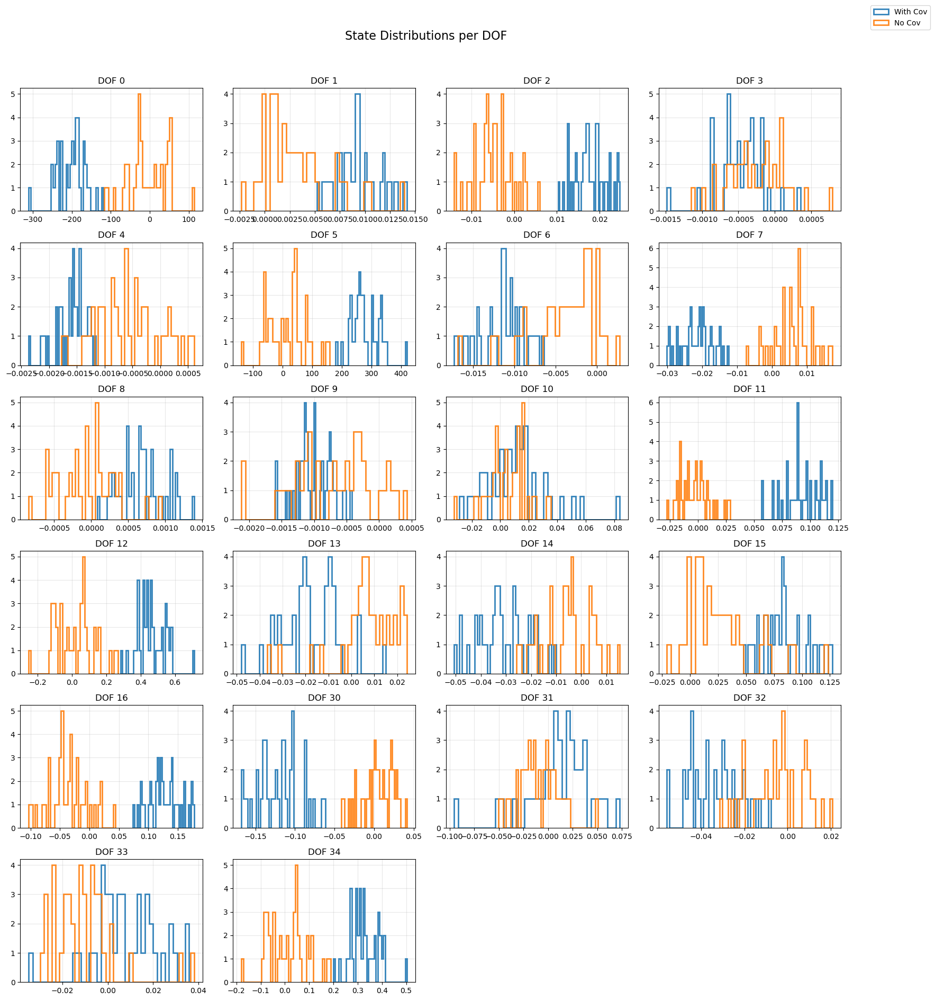

In [28]:
# Ensure arrays are NumPy before slicing
states_cov_array = np.asarray(states_cov_array)
states_nocov_array = np.asarray(states_nocov_array)


if states_cov_array.ndim != 2 or states_nocov_array.ndim != 2:
    raise ValueError(
        f"Expected 2D arrays (n_samples, n_dof). Got shapes: "
        f"cov={states_cov_array.shape}, nocov={states_nocov_array.shape}"
    )

n_dof = len(use_dof)
ncols = 4
nrows = int(np.ceil(n_dof / ncols))
bins = 40

fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3 * nrows), sharex=False, sharey=False)
axes = axes.ravel()  # flatten to index easily

for idx, dof_id in enumerate(use_dof):
    ax = axes[idx]

    ax.hist(
        states_cov_array[:, idx],
        bins=bins,
        histtype="step",
        linewidth=2,
        label="With Cov" if idx == 0 else None,
        alpha=0.9,
    )

    ax.hist(
        states_nocov_array[:, idx],
        bins=bins,
        histtype="step",
        linewidth=2,
        label="No Cov" if idx == 0 else None,
        alpha=0.9,
    )

    ax.set_title(f"DOF {dof_id}")
    ax.grid(alpha=0.3)

# Turn off unused axes if DOFs < grid slots
for ax in axes[n_dof:]:
    ax.axis("off")

fig.suptitle("State Distributions per DOF", fontsize=16, y=1.02)
fig.tight_layout()
fig.legend(loc="upper right", bbox_to_anchor=(1.1, 1.05))
plt.show()


# Corner Zernike analysis (pre-covariance)

The suggestion “look at the leading Zernike terms and the corner coefficients with these terms” is (as I understand it) asking:
- before building any covariance matrix, inspect the *raw/detrended Zernike coefficient time series* in each corner sensor
- focus on a subset of “leading” modes (e.g. Z4–Z14)
- quantify **how correlated the same Zernike mode is between corners** (e.g. does Z7 in R00 track Z7 in R44?), and whether corners move together (global/common-mode) vs independently (local effects / noise)

This section builds those metrics directly from the cached Zernike coefficient table, so you can run it without computing `C_new`.

**What this section does (high level)**
We analyze *per-corner* Zernike coefficient time series directly (no OFC, no DOFs, no covariance matrix required).
The goal is to quantify how strongly the same Zernike mode (e.g. Z7) is shared across the four corners (R00, R40, R04, R44).

**Run order:** config → load table → compute metrics → plots.

## Configuration
This section is designed so you can quickly toggle between:
- analyzing a **single day** vs **all days** (`ts_corner_day_mode`)
- using a Zernike **range** (`ts_corner_z_min/max`) vs an explicit **subset list** (`ts_corner_zernikes`)

Notes:
- We do **not** split/filter by band here anymore.
- If a `band` column exists (or is fetched via ConsDB), scatter plots can still color points by band.

Edit the CONFIG code cell to set:
- `ts_corner_day_mode = 'single'` and `ts_corner_day_value = ...` (or `ts_corner_day_mode = 'all'`)
- either `ts_corner_z_min/max` or `ts_corner_zernikes = [...]`

Nothing is computed yet; it just sets variables used by the next cells.

In [29]:
# Corner Zernike analysis: CONFIG (edit here)

# =========================
# USER OPTIONS (MAIN KNOBS)
# =========================

# Which cached signal to analyze
ts_corner_source = 'detrended'   # 'detrended' | 'trended'

# Zernikes to compare
# - If ts_corner_zernikes is a non-empty list: use that explicit subset
# - Else: use inclusive range [ts_corner_z_min, ts_corner_z_max]
ts_corner_z_min = 4
ts_corner_z_max = 28
ts_corner_zernikes = [4, 5, 6, 7, 8, 9, 10, 11, 22]   # e.g. [4, 7, 11, 14]

# Use ts_ofc definition
ts_corner_detectors = ['R00', 'R04', 'R40', 'R44']

# Day selection
# - 'single': analyze one day only (ts_corner_day_value)
# - 'all': analyze all available days in the loaded table
ts_corner_day_mode = 'all'    # 'single' | 'all'
ts_corner_day_value = int(day) if 'day' in globals() else None   # <<< PICK DAY HERE when day_mode='single'

# We do not split/filter by band in this section.
# If a 'band' column exists (or is fetched via ConsDB), scatter plots can color points by band.
ts_corner_scatter_color_by_band = True

# Optional limits (speed)
ts_corner_max_rows = None        # e.g. 5000 for quick iteration; None = all available

# If the cache contains combined CSV (with day/seq metadata), prefer it
ts_corner_prefer_combined_csv = True

# Cache directory (reuses earlier `cache_dir` if set)
ts_corner_cache_dir = Path(globals().get('cache_dir', Path('./zernike_cache'))).resolve()

# =========================
# USER OPTIONS (METADATA)
# =========================
# If your current cached table is missing columns like band/rtp/observation_reason, this can rebuild/merge them.
ts_corner_enable_consdb_metadata = True
ts_corner_consdb_url = 'http://consdb-pq.consdb:8080/consdb'

# Include extra metadata columns if they exist in your ConsDB schema (optional).
# For quicklook (q.*) you might try: ['psf_fwhm'] or similar, depending on your deployment.
ts_corner_consdb_extra_quicklook_cols = []
ts_corner_consdb_extra_exposure_cols = []

# =========================
# USER OPTIONS (QUICK SCATTER PREVIEW)
# =========================
# The scatter preview is meant to be a quick sanity check before the Pearson heatmaps.
ts_corner_preview_enable = True
ts_corner_preview_zernikes = [4, 5, 6, 7, 8, 9, 10, 11, 22]  # explicit list to display; if None, defaults to ts_corner_z_list
ts_corner_preview_max_points = None  # downsample for speed/plot readability (None = no downsample)

# Scatter layout is FIXED as: columns=[R00,R40,R04,R44], and rows run in detector order
# for each selected Z. So for each Zk you get 4 rows (R00 vs others, then R40 vs others, etc.).

# =========================
# DERIVED (do not edit)
# =========================
if ts_corner_day_mode not in ('single', 'all'):
    raise ValueError("ts_corner_day_mode must be 'single' or 'all'")
ts_corner_day = int(ts_corner_day_value) if (ts_corner_day_mode == 'single' and ts_corner_day_value is not None) else None

# Resolve the Zernike selection once, so downstream cells can use a single variable
_z_list = []
if ts_corner_zernikes is not None and len(ts_corner_zernikes) > 0:
    _z_list = sorted({int(z) for z in ts_corner_zernikes})
else:
    _z_list = list(range(int(ts_corner_z_min), int(ts_corner_z_max) + 1))
if len(_z_list) == 0:
    raise ValueError('[corner] Empty Zernike selection: set ts_corner_zernikes or ts_corner_z_min/max')
ts_corner_z_list = _z_list

# Resolve scatter Zs: explicit list wins; else defaults to the main selection
if ts_corner_preview_zernikes is None:
    ts_corner_preview_z_list = list(ts_corner_z_list)
else:
    ts_corner_preview_z_list = sorted({int(z) for z in ts_corner_preview_zernikes})

print('[corner] CONFIG')
print(f"  source={ts_corner_source}")
print(f"  zernikes={ts_corner_z_list}")
print(f"  detectors={ts_corner_detectors}")
print(f"  day_mode={ts_corner_day_mode}  day={ts_corner_day}")
print(f"  scatter_color_by_band={ts_corner_scatter_color_by_band}")
print(f"  scatter_zernikes={ts_corner_preview_z_list}")
print(f"  max_rows={ts_corner_max_rows}")
print(f"  cache_dir={ts_corner_cache_dir}")
print(f"  consdb_metadata={ts_corner_enable_consdb_metadata}  consdb_url={ts_corner_consdb_url}")

[corner] CONFIG
  source=detrended
  zernikes=[4, 5, 6, 7, 8, 9, 10, 11, 22]
  detectors=['R00', 'R04', 'R40', 'R44']
  day_mode=all  day=None
  scatter_color_by_band=True
  scatter_zernikes=[4, 5, 6, 7, 8, 9, 10, 11, 22]
  max_rows=None
  cache_dir=/home/dsanmartim/notebooks/aos_notebooks/zernike_cache
  consdb_metadata=True  consdb_url=http://consdb-pq.consdb:8080/consdb


### Correlation/covariance comparisons

Compare correlation/covariance matrices across selections and display them for visual inspection.

In [30]:
# Corner Zernike analysis: load a table of coefficients (pre-cov)

def _corner_load_combined(cache_dir: Path, kind: str) -> pd.DataFrame | None:
    """Load combined cached CSV (preferred) if present."""
    path = (cache_dir / f"{kind}_all.csv")
    if not path.exists():
        return None
    return pd.read_csv(path)

def _corner_load_from_blocks(kind: str) -> pd.DataFrame:
    """Fallback: stack in-memory blocks if the combined CSV isn't available."""
    blocks = globals().get('detrended_days', None) if kind == 'detrended' else globals().get('trended_days', None)
    if blocks is None:
        raise RuntimeError(f"Expected {kind}_days in globals(); run the cache-load / processing cells first.")
    blocks = [b for b in blocks if b is not None]
    if len(blocks) == 0:
        raise RuntimeError(f"No non-empty blocks found in {kind}_days")
    arr = np.vstack([np.asarray(b) for b in blocks])
    cols = None
    if 'manifest' in globals() and isinstance(globals()['manifest'], dict):
        cols = globals()['manifest'].get('column_names', None)
    data_cols = cols[3:] if (cols is not None and len(cols) >= 4) else [f"c{i}" for i in range(arr.shape[1])]
    df = pd.DataFrame(arr, columns=data_cols)
    # No real day/seq info in this fallback; add placeholders so downstream code still runs.
    df.insert(0, 'visit_id', np.arange(len(df), dtype=int))
    df.insert(0, 'seq_num', np.arange(len(df), dtype=int))
    df.insert(0, 'day_obs', -1)
    return df

def _corner_query_consdb_metadata(
    *,
    day_obs: int,
    seq_min: int,
    seq_max: int,
    url: str,
    extra_quicklook_cols: list[str] | None = None,
    extra_exposure_cols: list[str] | None = None,
) -> pd.DataFrame:
    """Query ConsDB for metadata and return a table with at least: day_obs, seq_num, band, rtp, observation_reason."""
    extra_quicklook_cols = list(extra_quicklook_cols or [])
    extra_exposure_cols = list(extra_exposure_cols or [])

    # Base columns (known-good in this notebook)
    q_cols = [
        "q.physical_rotator_angle AS rtp",
    ]
    e_cols = [
        "e.seq_num AS seq_num",
        "e.band AS band",
        "e.day_obs AS day_obs",
        "e.altitude AS altitude",
        "e.obs_end AS obs_end",
        "e.obs_start AS obs_start",
        "e.observation_reason AS observation_reason",
        "e.img_type AS img_type",
    ]

    # Optional extras (may fail if schema differs; we retry without them)
    for c in extra_quicklook_cols:
        q_cols.append(f"q.{c} AS {c}")
    for c in extra_exposure_cols:
        e_cols.append(f"e.{c} AS {c}")

    select_list = ",\n    ".join(e_cols + q_cols)
    query = f'''
        SELECT
        {select_list}
        FROM
        cdb_lsstcam.visit1_quicklook AS q,
        cdb_lsstcam.exposure AS e
        WHERE
        q.visit_id = e.exposure_id
        AND (e.img_type = 'science' or e.img_type = 'acq' or e.img_type = 'engtest')
        AND e.day_obs = {int(day_obs)}
        AND (e.seq_num BETWEEN {int(seq_min)} and {int(seq_max)})
    '''

    try:
        from lsst.summit.utils.consdb import ConsDbClient
    except Exception:
        ConsDbClient = globals().get('ConsDbClient', None)
    if ConsDbClient is None:
        raise RuntimeError("ConsDbClient not available in this kernel; run the earlier ConsDB setup cell or import it.")
    cdb_client = ConsDbClient(url)
    try:
        return cdb_client.query(query).to_pandas()
    except Exception as e:
        if (extra_quicklook_cols or extra_exposure_cols):
            print(f"[corner] ConsDB query failed with extras; retrying without extras. Error: {e!r}")
            return _corner_query_consdb_metadata(
                day_obs=day_obs,
                seq_min=seq_min,
                seq_max=seq_max,
                url=url,
                extra_quicklook_cols=[],
                extra_exposure_cols=[],
            )
        raise

kind = ts_corner_source.strip().lower()
if kind not in ('detrended', 'trended'):
    raise ValueError("ts_corner_source must be 'detrended' or 'trended'")

df_corner = None
if ts_corner_prefer_combined_csv:
    df_corner = _corner_load_combined(ts_corner_cache_dir, kind)
if df_corner is None:
    print(f"[corner] combined CSV not found; falling back to stacking {kind}_days blocks")
    df_corner = _corner_load_from_blocks(kind)

# Day filtering: optional, controlled by ts_corner_day_mode
if ts_corner_day_mode == 'single' and ts_corner_day is not None and 'day_obs' in df_corner.columns:
    if (df_corner['day_obs'] >= 0).any():
        before = len(df_corner)
        df_corner = df_corner[df_corner['day_obs'] == int(ts_corner_day)].copy()
        print(f"[corner] day filter ({ts_corner_day}): {before} -> {len(df_corner)} rows")
    else:
        print('[corner] day filter skipped (no valid day_obs in loaded table)')
else:
    if ts_corner_day_mode == 'all':
        print('[corner] day_mode=all (no day filtering)')

# (Re)build metadata from ConsDB if requested and if we have day/seq keys available.
# Useful when the cached table lacks 'band' or 'rtp'.
if ts_corner_enable_consdb_metadata and ('day_obs' in df_corner.columns) and ('seq_num' in df_corner.columns):
    need_band = (('band' not in df_corner.columns) or (df_corner['band'].isna().all() if 'band' in df_corner.columns else True))
    need_rtp = ('rtp' not in df_corner.columns)
    want_any = (need_band or need_rtp)
    if want_any:
        if (df_corner['day_obs'] >= 0).any():
            days_needed = sorted(df_corner.loc[df_corner['day_obs'] >= 0, 'day_obs'].dropna().unique().astype(int).tolist())
        else:
            days_needed = []
        if len(days_needed) == 0:
            print('[corner] Cannot fetch ConsDB metadata: df_corner has no valid day_obs values')
        else:
            meta_frames = []
            for d0 in days_needed:
                dsub = df_corner[df_corner['day_obs'] == d0]
                if len(dsub) == 0:
                    continue
                seqs = dsub['seq_num'].dropna().astype(int).to_numpy()
                if seqs.size == 0:
                    continue
                smin, smax = int(np.min(seqs)), int(np.max(seqs))
                try:
                    md = _corner_query_consdb_metadata(
                        day_obs=d0,
                        seq_min=smin,
                        seq_max=smax,
                        url=str(ts_corner_consdb_url),
                        extra_quicklook_cols=list(ts_corner_consdb_extra_quicklook_cols),
                        extra_exposure_cols=list(ts_corner_consdb_extra_exposure_cols),
                    )
                    meta_frames.append(md)
                except Exception as e:
                    print(f"[corner] ConsDB metadata fetch failed for day={d0}, seq={smin}-{smax}: {e!r}")
            if meta_frames:
                meta_all = pd.concat(meta_frames, ignore_index=True)
                if 'seq' in meta_all.columns and 'seq_num' not in meta_all.columns:
                    meta_all = meta_all.rename(columns={'seq': 'seq_num'})
                key_cols = ['day_obs', 'seq_num']
                keep_cols = [c for c in meta_all.columns if c not in key_cols]
                meta_all = meta_all[key_cols + keep_cols].drop_duplicates()
                before_cols = set(df_corner.columns)
                df_corner = df_corner.merge(meta_all, on=key_cols, how='left', suffixes=('', '_meta'))
                after_cols = set(df_corner.columns)
                added = sorted(list(after_cols - before_cols))
                print(f"[corner] ConsDB metadata merged. Added columns: {added[:12]}{'...' if len(added) > 12 else ''}")
            else:
                print('[corner] No ConsDB metadata frames collected; continuing without band/rtp metadata')

# Optional row limit for faster iteration
if ts_corner_max_rows is not None:
    df_corner = df_corner.iloc[: int(ts_corner_max_rows)].copy()

print('[corner] TABLE READY')
print('  rows:', len(df_corner))
print('  cols:', len(df_corner.columns))
print('  has band?', 'band' in df_corner.columns, 'has rtp?', 'rtp' in df_corner.columns)
print('  head columns:', list(df_corner.columns[:12]))

[corner] day_mode=all (no day filtering)
[corner] ConsDB metadata merged. Added columns: ['altitude', 'band', 'img_type', 'obs_end', 'obs_start', 'observation_reason', 'rtp']
[corner] TABLE READY
  rows: 540
  cols: 102
  has band? True has rtp? True
  head columns: ['day_obs', 'seq_num', 'visit_id', 'R00_Z4', 'R00_Z5', 'R00_Z6', 'R00_Z7', 'R00_Z8', 'R00_Z9', 'R00_Z10', 'R00_Z11', 'R00_Z12']


## Load coefficient table (pre-covariance)
This cell loads a tabular dataset of Zernike coefficients with columns like `R00_Z4`, `R40_Z4`, …
It prefers the cached combined CSV (`detrended_all.csv` / `trended_all.csv`) so that `day_obs` / `seq_num` metadata is preserved when available.

If the combined file is not present, it falls back to stacking the in-memory blocks (`detrended_days` / `trended_days`).
Optionally, it can also join `band` and `rtp` metadata from ConsDB (when available) so scatter plots can color points by band.

## Compute cross-corner metrics
This cell computes *pairwise* metrics for each selected Zernike term across all corner pairs (6 pairs for 4 corners):
- **Pearson correlation** $r$ for each Zk between two corners (tracks “do they move together?”).
- **RMS difference** for each Zk between two corners (tracks “how far apart are they in amplitude?”).

It then plots:
- a heatmap of $r$ vs (Zk, corner-pair)
- (optionally) a full correlation matrix across all selected variables (all corners × all selected Z terms).

**Interpretation:**
- High $r$ for the same Zk across corners suggests strong common-mode behavior (global aberrations).
- Low $r$ suggests the corners are behaving differently for that mode (local effects, sensor noise, or alignment/field-dependent behavior).

[corner] Using N=540 samples, nZ=9, nCorners=4

[corner] Per-term cross-corner correlation summary (Pearson r)
  Z4: best R00↔R04 r=+0.597 | worst R00↔R44 r=+0.447
  Z5: best R00↔R40 r=+0.427 | worst R40↔R44 r=+0.285
  Z6: best R40↔R44 r=+0.469 | worst R04↔R40 r=+0.363
  Z7: best R00↔R04 r=+0.312 | worst R00↔R40 r=+0.082
  Z8: best R00↔R40 r=+0.165 | worst R00↔R44 r=-0.016
  Z9: best R04↔R40 r=+0.566 | worst R00↔R44 r=+0.452
  Z10: best R00↔R40 r=+0.496 | worst R04↔R40 r=+0.335
  Z11: best R04↔R40 r=+0.087 | worst R04↔R44 r=-0.031
  Z22: best R40↔R44 r=+0.100 | worst R04↔R44 r=-0.060


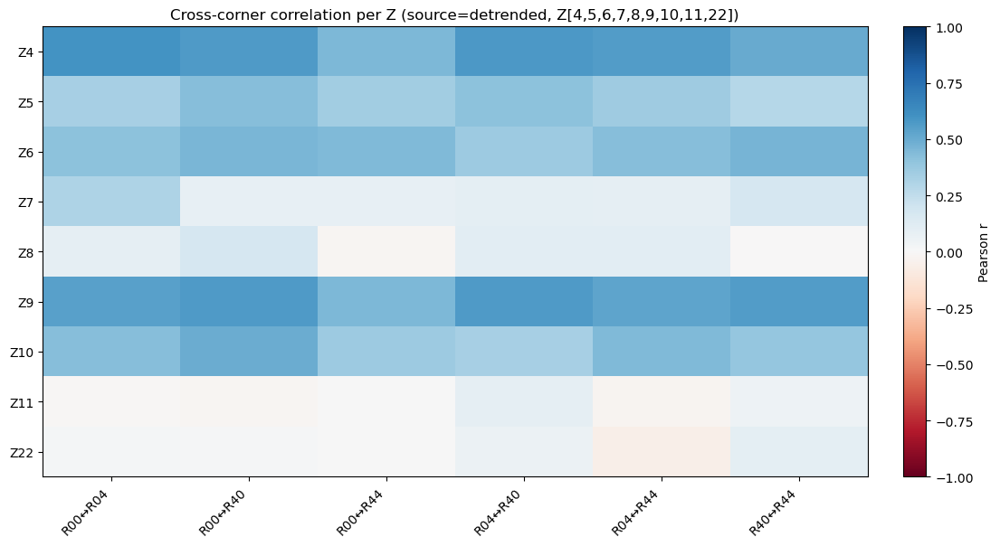

In [31]:
# Corner Zernike analysis: compute cross-corner correlation metrics
from itertools import combinations

def _pearsonr_safe(x: np.ndarray, y: np.ndarray) -> float:
    x = np.asarray(x, dtype=float).ravel()
    y = np.asarray(y, dtype=float).ravel()
    m = np.isfinite(x) & np.isfinite(y)
    if np.sum(m) < 3:
        return np.nan
    x = x[m]
    y = y[m]
    sx = float(np.std(x))
    sy = float(np.std(y))
    if sx == 0.0 or sy == 0.0:
        return np.nan
    return float(np.corrcoef(x, y)[0, 1])

zerns = list(globals().get('ts_corner_z_list', []))
if not zerns:
    zerns = list(range(int(ts_corner_z_min), int(ts_corner_z_max) + 1))
dets = list(ts_corner_detectors)

# Pretty label for titles
_is_contig = (len(zerns) >= 2) and (zerns == list(range(int(zerns[0]), int(zerns[-1]) + 1)))
z_desc = f"Z{zerns[0]}..Z{zerns[-1]}" if _is_contig else "Z[" + ",".join(str(int(z)) for z in zerns) + "]"

# Validate required columns exist
required_cols = [f"{d}_Z{z}" for d in dets for z in zerns]
missing_cols = [c for c in required_cols if c not in df_corner.columns]
if missing_cols:
    print('[corner] Missing expected columns. First few missing:')
    print(' ', missing_cols[:15])
    print('[corner] Available example columns:')
    print(' ', list(df_corner.columns[:30]))
    raise RuntimeError('[corner] Column mismatch: check detector names and Zernike naming in cache.')

# Build per-corner matrices: shape (N, nZ)
X = {d: df_corner[[f"{d}_Z{z}" for z in zerns]].to_numpy(dtype=float) for d in dets}
N = next(iter(X.values())).shape[0]
print(f"[corner] Using N={N} samples, nZ={len(zerns)}, nCorners={len(dets)}")

# Pairwise per-term Pearson correlations + RMS differences
pairs = list(combinations(dets, 2))
pair_labels = [f"{a}↔{b}" for a, b in pairs]
R = np.full((len(zerns), len(pairs)), np.nan, dtype=float)
D_rms = np.full((len(zerns), len(pairs)), np.nan, dtype=float)

for pj, (a, b) in enumerate(pairs):
    Xa = X[a]
    Xb = X[b]
    for zi, z in enumerate(zerns):
        xa = Xa[:, zi]
        xb = Xb[:, zi]
        R[zi, pj] = _pearsonr_safe(xa, xb)
        m = np.isfinite(xa) & np.isfinite(xb)
        if np.sum(m) >= 1:
            D_rms[zi, pj] = float(np.sqrt(np.mean((xa[m] - xb[m]) ** 2)))

# Print a compact summary table
print('\n[corner] Per-term cross-corner correlation summary (Pearson r)')
for zi, z in enumerate(zerns):
    row = R[zi, :]
    if np.all(~np.isfinite(row)):
        print(f"  Z{z}: (all NaN)")
        continue
    best = int(np.nanargmax(row))
    worst = int(np.nanargmin(row))
    print(f"  Z{z}: best {pair_labels[best]} r={row[best]:+.3f} | worst {pair_labels[worst]} r={row[worst]:+.3f}")

# Heatmap: correlation per Z and per corner-pair
fig, ax = plt.subplots(1, 1, figsize=(1.2 * len(pairs) + 4, 0.35 * len(zerns) + 3))
im = ax.imshow(R, aspect='auto', cmap='RdBu', vmin=-1, vmax=1)
ax.set_title(f"Cross-corner correlation per Z (source={ts_corner_source}, {z_desc})")
ax.set_xticks(np.arange(len(pairs)))
ax.set_xticklabels(pair_labels, rotation=45, ha='right')
ax.set_yticks(np.arange(len(zerns)))
ax.set_yticklabels([f"Z{z}" for z in zerns])
ax.grid(False)
cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Pearson r')
plt.tight_layout()
plt.show()


### Environment-binned matrices (setup)

Bin the dataset by environment metrics and recompute matrices per bin to compare structure.

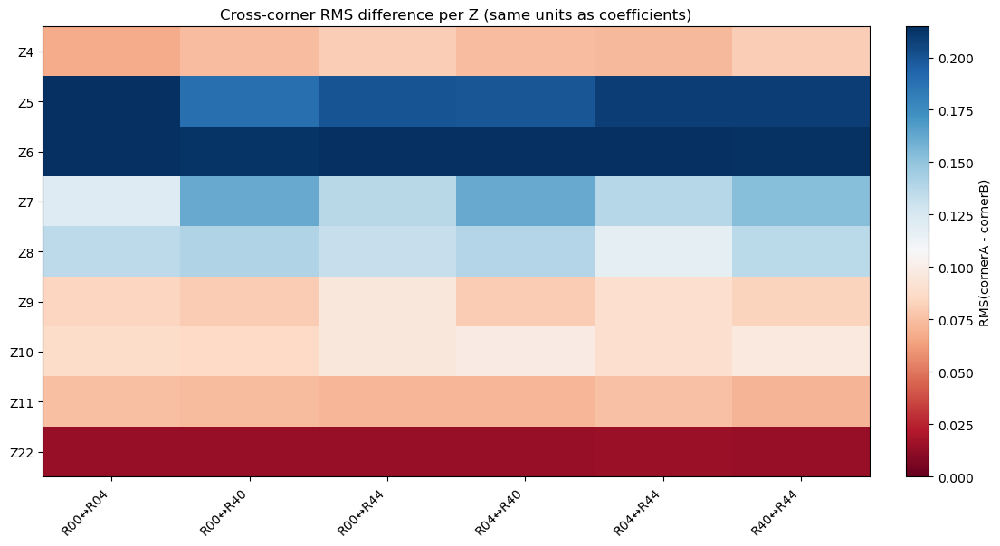

In [32]:
# Heatmap: RMS difference per Z and per corner-pair
fig, ax = plt.subplots(1, 1, figsize=(1.2 * len(pairs) + 4, 0.35 * len(zerns) + 3))
vmax = np.nanpercentile(D_rms, 95) if np.isfinite(D_rms).any() else 1.0
im = ax.imshow(D_rms, aspect='auto', cmap='RdBu', vmin=0, vmax=vmax)
ax.set_title('Cross-corner RMS difference per Z (same units as coefficients)')
ax.set_xticks(np.arange(len(pairs)))
ax.set_xticklabels(pair_labels, rotation=45, ha='right')
ax.set_yticks(np.arange(len(zerns)))
ax.set_yticklabels([f"Z{z}" for z in zerns])
cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('RMS(cornerA - cornerB)')
plt.tight_layout()
plt.show()



### Environment-binned matrices (comparison)

Continue bin-level matrix comparisons and summarize differences across conditions.

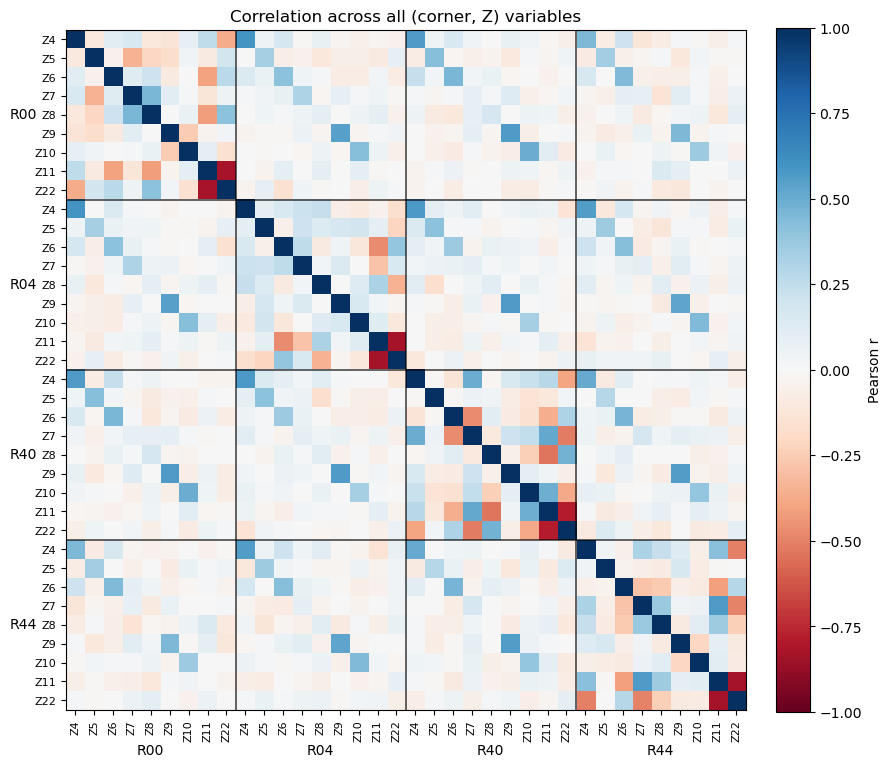

In [33]:
# Optional: full correlation matrix across all selected (corner, Z) columns
# Layout matches the reconstructed-matrix plot style:
# - axis tick labels are Zernikes (repeated within each corner block)
# - corner labels are written outside the axes
# - separator lines mark corner blocks
nZ = len(zerns)
nCorners = len(dets)
cols_all = [f"{d}_Z{z}" for d in dets for z in zerns]
M = df_corner[cols_all].to_numpy(dtype=float)
m = np.isfinite(M).all(axis=1)
M = M[m]
if M.shape[0] >= 3:
    Ccorr = np.corrcoef(M, rowvar=False)
    nVars = Ccorr.shape[0]
    fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    im = ax.imshow(Ccorr, cmap='RdBu', vmin=-1, vmax=1)
    ax.set_title('Correlation across all (corner, Z) variables')

    # Ticks: annotate EACH variable with its Zernike label (not necessarily sequential)
    z_tick_labels = [f"Z{int(z)}" for _d in dets for z in zerns]
    ax.set_xticks(np.arange(nVars))
    ax.set_yticks(np.arange(nVars))
    ax.set_xticklabels(z_tick_labels, rotation=90, fontsize=8)
    ax.set_yticklabels(z_tick_labels, fontsize=8)
    ax.grid(False)

    # Corner-block separators
    for k in range(1, nCorners):
        cut = k * nZ - 0.5
        ax.axhline(cut, color='k', lw=1.2, alpha=0.7)
        ax.axvline(cut, color='k', lw=1.2, alpha=0.7)

    # Corner labels (outside axes, centered on each corner block)
    block_centers = [k * nZ + (nZ - 1) / 2 for k in range(nCorners)]
    for center, d in zip(block_centers, dets):
        ax.text(center, nVars + 2, d, ha='center', va='bottom', fontsize=10, clip_on=False)
        ax.text(-2, center, d, ha='right', va='center', fontsize=10, clip_on=False)

    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='Pearson r')
    plt.subplots_adjust(bottom=0.28, left=0.28)
    plt.show()
else:
    print('[corner] Not enough finite rows for full correlation matrix plot')

### Transition to scatter previews

After the full correlation matrix, the next section provides quick scatter previews before the heatmaps.

## Quick scatter preview (recommended before heatmaps)
This plots a grid with **4 columns** (R00/R40/R04/R44).
For each selected Zk, we append a block of **4 rows** in detector order:
- Row 1: R00 vs (R00,R40,R04,R44)
- Row 2: R40 vs (R00,R40,R04,R44)
- Row 3: R04 vs (R00,R40,R04,R44)
- Row 4: R44 vs (R00,R40,R04,R44)

So a preview with (say) 3 Z terms produces a grid with $3\times 4=12$ rows and 4 columns.
Each populated panel plots `(ref_Zk)` vs `(target_Zk)` with an identity line $y=x$ and the Pearson $r$ in the title.

**How to read it:**
- Tight diagonal cloud → strong coupling (high correlation)
- Wide cloud or no diagonal structure → weak coupling / noise / local behavior
- Diagonal but offset/slope≠1 → coupled but different gain/offset between corners

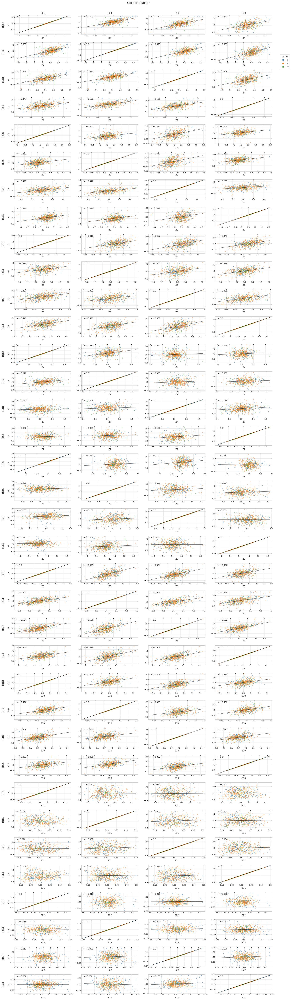

In [34]:
# Optional: Scatter preview across corners (quick sanity check)


# Prefer seaborn styling for prettier plots, but keep a matplotlib fallback
try:
    import seaborn as sns
    sns.set_theme(style='whitegrid', context='notebook')
    _has_sns = True
except Exception:
    sns = None
    _has_sns = False

if not ts_corner_preview_enable:
    print('[corner] Scatter preview disabled (ts_corner_preview_enable=False)')
else:
    # Choose which Zs to show in the preview
    z_list = list(ts_corner_preview_z_list) if 'ts_corner_preview_z_list' in globals() else []
    if len(z_list) == 0:
        z_list = list(ts_corner_z_list) if 'ts_corner_z_list' in globals() else []
    if len(z_list) == 0:
        raise ValueError('[corner] No Zs configured for scatter preview')

    dets = list(ts_corner_detectors)
    if len(dets) != 4:
        raise ValueError('[corner] Scatter preview expects exactly 4 corners in ts_corner_detectors')

    if 'df_corner' not in globals():
        raise NameError('[corner] df_corner not found. Run the table-load cell first.')
    dfp = df_corner.copy()

    # Filter rows (match load cell: day column is usually 'day_obs')
    if ts_corner_day is not None:
        if 'day_obs' in dfp.columns:
            dfp = dfp[dfp['day_obs'] == ts_corner_day]
        elif 'day' in dfp.columns:
            dfp = dfp[dfp['day'] == ts_corner_day]

    if ts_corner_max_rows is not None and len(dfp) > ts_corner_max_rows:
        dfp = dfp.sample(n=int(ts_corner_max_rows), random_state=0)

    if ts_corner_preview_max_points is not None and len(dfp) > ts_corner_preview_max_points:
        dfp = dfp.sample(n=int(ts_corner_preview_max_points), random_state=1)

    # Band coloring (optional)
    color_by_band = bool(ts_corner_scatter_color_by_band and ('band' in dfp.columns))
    if color_by_band:
        bands = sorted([b for b in dfp['band'].dropna().unique()])
        if _has_sns:
            palette = sns.color_palette('tab10', n_colors=max(1, len(bands)))
            band_to_color = {b: palette[i % len(palette)] for i, b in enumerate(bands)}
        else:
            cmap = plt.get_cmap('tab10')
            band_to_color = {b: cmap(i % 10) for i, b in enumerate(bands)}
    else:
        bands = None
        band_to_color = None

    def _pearsonr_safe(x: np.ndarray, y: np.ndarray) -> float:
        x = np.asarray(x, dtype=float).ravel()
        y = np.asarray(y, dtype=float).ravel()
        m = np.isfinite(x) & np.isfinite(y)
        if int(np.sum(m)) < 3:
            return np.nan
        x = x[m]
        y = y[m]
        sx = float(np.std(x))
        sy = float(np.std(y))
        if sx == 0.0 or sy == 0.0:
            return np.nan
        return float(np.corrcoef(x, y)[0, 1])

    # Resolve coefficient column names robustly (some caches use 'R00_Z4', others use 'detrended_R00_Z04', etc.)
    df_cols = set(dfp.columns)

    def _candidates(det: str, z: int):
        z = int(z)
        ztags = [f'Z{z:02d}', f'Z{z}']
        prefixes = [str(ts_corner_source).strip().lower(), None]
        for pref in prefixes:
            for zt in ztags:
                if pref:
                    yield f'{pref}_{det}_{zt}'
                yield f'{det}_{zt}'

    def _resolve_col(det: str, z: int) -> str | None:
        for c in _candidates(det, z):
            if c in df_cols:
                return c
        z = int(z)
        pat = re.compile(rf'(^|_)({re.escape(det)})(_.*)?_Z0*{z}($|_)')
        matches = [c for c in dfp.columns if pat.search(str(c))]
        if len(matches) == 1:
            return matches[0]
        if len(matches) > 1:
            return sorted(matches, key=lambda s: (len(str(s)), str(s)))[0]
        return None

    col_map = {}  # (det, z) -> column name
    missing = []
    for det in dets:
        for z in z_list:
            col = _resolve_col(det, int(z))
            if col is None:
                missing.append(f'{det}_Z{int(z)}')
            else:
                col_map[(det, int(z))] = col

    if missing:
        example_cols = []
        for det in dets:
            example_cols.extend([c for c in dfp.columns if str(c).startswith(f'{det}_Z')][:4])
        example_cols = example_cols[:12]
        raise KeyError(
            '[corner] Missing required columns for scatter preview (first few): ' + ', '.join(missing[:10]) +
            ('\n[corner] Example available cols: ' + ', '.join(example_cols) if example_cols else '')
        )

    # Label styling
    corner_fs = 14  # corner label part (bigger)
    z_fs = 10       # Z label part (same in x and y)
    ann_fs = 9      # r/diagonal annotation
    grid_color = '#e6e6e6'
    grid_lw = 0.6
    spine_lw = 1.4

    # Layout: each Z contributes 4 rows (base corner vs other corners), with 4 columns for the 4 corners
    n_rows = len(z_list) * 4
    n_cols = 4

    # Make it wide, but keep subplot height ~40% of subplot width
    fig_w = 18
    per_subplot_w = fig_w / n_cols
    per_subplot_h = 0.40 * per_subplot_w
    fig_h = max(4.0, per_subplot_h * n_rows)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_w, fig_h), sharex='row', sharey=False)
    axes = np.asarray(axes)
    if n_rows == 1:
        axes = axes.reshape(1, -1)

    # Setup spaces between subplots axes
    fig.subplots_adjust(hspace=0.02, wspace=0.06)

    # Styling: show full frame (top/right spines) and ticks on all sides
    def _full_frame(ax):
        for side in ('top', 'right', 'bottom', 'left'):
            ax.spines[side].set_visible(True)
            ax.spines[side].set_linewidth(spine_lw)
            ax.spines[side].set_alpha(0.95)
        ax.tick_params(
            axis='both', which='both',
            top=True, right=True, bottom=True, left=True,
            direction='in', width=1.0, length=3.0,
            labelsize=8, pad=1,
        )
        ax.set_axisbelow(True)
        ax.grid(True, color=grid_color, linewidth=grid_lw, alpha=1.0)

    row_idx = 0
    for z in z_list:
        z_int = int(z)
        z_txt = f'Z{z_int}'
        for base in dets:
            x_col = col_map[(base, z_int)]
            for j, other in enumerate(dets):
                ax = axes[row_idx, j]
                y_col = col_map[(other, z_int)]

                x_all = dfp[x_col].to_numpy(dtype=float)
                y_all = dfp[y_col].to_numpy(dtype=float)
                m = np.isfinite(x_all) & np.isfinite(y_all)
                x = x_all[m]
                y = y_all[m]

                # Scatter (use seaborn if available). Use numpy arrays to avoid seaborn auto-labeling with column names.
                if color_by_band:
                    for b in bands:
                        dsub = dfp[dfp['band'] == b]
                        xb = dsub[x_col].to_numpy(dtype=float)
                        yb = dsub[y_col].to_numpy(dtype=float)
                        if _has_sns:
                            sns.scatterplot(x=xb, y=yb, ax=ax, s=10, alpha=0.55, color=band_to_color[b], legend=False, edgecolor=None, linewidth=0)
                        else:
                            ax.scatter(xb, yb, s=10, alpha=0.55, color=band_to_color[b], linewidths=0)
                else:
                    if _has_sns:
                        sns.scatterplot(x=x, y=y, ax=ax, s=10, alpha=0.55, color='tab:blue', legend=False, edgecolor=None, linewidth=0)
                    else:
                        ax.scatter(x, y, s=10, alpha=0.55, linewidths=0)

                # Ensure x/y labels are exactly the compact form you want
                ax.set_xlabel('')
                ax.set_ylabel('')

                # Fit line (no legend/label)
                r = _pearsonr_safe(x, y)
                if x.size >= 2 and float(np.std(x)) > 0.0:
                    try:
                        a, b0 = np.polyfit(x, y, 1)
                        lo = float(np.nanmin(x))
                        hi = float(np.nanmax(x))
                        xs = np.array([lo, hi], dtype=float)
                        ys = a * xs + b0
                        ax.plot(xs, ys, color='black', alpha=0.6, lw=1.2)
                    except Exception:
                        pass

                # Diagonal: y=x reference line for self-self panels (no legend)
                if other == base and x.size >= 1:
                    try:
                        lo = float(np.nanmin([np.nanmin(x), np.nanmin(y)]))
                        hi = float(np.nanmax([np.nanmax(x), np.nanmax(y)]))
                        ax.plot([lo, hi], [lo, hi], color='k', lw=0.9, alpha=0.55)
                    except Exception:
                        pass

                # Panel annotations: diagonal vs r-value
                if other == base:
                    ax.text(0.02, 0.96, 'r = 1.0', transform=ax.transAxes, ha='left', va='top', fontsize=ann_fs)
                else:
                    ax.text(
                        0.02, 0.96,
                        (f"r = {r:+.3f}" if np.isfinite(r) else "r = nan"),
                        transform=ax.transAxes, ha='left', va='top', fontsize=ann_fs,
                    )

                # Column titles (top row only)
                if row_idx == 0:
                    ax.set_title(other, fontsize=11)

                # X axis: show tick labels on ALL subplots (consistent across the grid).
                # Keep the Z label only on the bottom row to avoid clutter, but ticks behave the same everywhere.
                #if row_idx == n_rows - 1:
                ax.set_xlabel(z_txt, fontsize=z_fs)
                ax.tick_params(labelbottom=True)

                # Custom Y label on first column: corner part bigger than Z part, and Z has same size as x label
                if j == 0:
                    ax.text(-0.2, 0.50, f'{base}', transform=ax.transAxes, rotation=90, ha='center', va='center', fontsize=corner_fs)
                    ax.text(-0.1, 0.50, z_txt, transform=ax.transAxes, rotation=90, ha='center', va='center', fontsize=z_fs)

                _full_frame(ax)

            row_idx += 1

    if color_by_band and bands:
        handles = [
            plt.Line2D([0], [0], marker='o', linestyle='', color=band_to_color[b], label=str(b), markersize=6)
            for b in bands
        ]
        fig.legend(handles=handles, title='band', loc='upper right', bbox_to_anchor=(1.05, 0.95))

    fig.suptitle('Corner Scatter', y=1.002)
    fig.tight_layout()
    plt.show()

# Wavefront Covariance Matrix from old LSST Simulations

## Data Loading

Matlab file provided by Bo Xin.  Angular Zerikes in the Noll convention are used, and the units are in nm. Simulation was performed at 770nm 

In [35]:

# load the Covariance Matrix
mat = scipy.io.loadmat('covM86.mat')

#print(mat)
# waves
#for iZ in range(4,22+1):
#    print(iZ,np.sqrt(mat['covM'][iZ-4,iZ-4])/770.)
    
# get the Diagonal elements RMS in units of nm
diag = np.zeros(19*4)

# loop over 4 corners
for i in range(4):
    for iZ in range(4,22+1):
        #print(iZ,np.sqrt(mat['covM'][iZ-4+19*i,iZ-4+19*i]))
        diag[iZ-4+19*i] = np.sqrt(mat['covM'][iZ-4+19*i,iZ-4+19*i])
        
for iZ in range(4,11+1):
    meanaZ = (diag[iZ-4]+diag[iZ-4+19]+diag[iZ-4+19*2]+diag[iZ-4+19*3])/4.
    print("<Z%d> = %6.0f" % (iZ,meanaZ))


<Z4> =     39
<Z5> =     87
<Z6> =    105
<Z7> =     30
<Z8> =     28
<Z9> =     44
<Z10> =     44
<Z11> =      6


In [36]:
# Inspect .mat contents to find simulated (non-covM) data arrays
mat_keys = [k for k in mat.keys() if not k.startswith('__')]
print('MAT keys:', mat_keys)

# Show shapes for all ndarray entries (excluding covM)
for k in mat_keys:
    v = mat[k]
    if isinstance(v, np.ndarray):
        print(f"{k}: shape={v.shape}, dtype={v.dtype}")

MAT keys: ['covM', 'corC']
covM: shape=(76, 76), dtype=float64
corC: shape=(76, 76), dtype=float64


In [37]:
# Diagnostic: do we have corner-label metadata in the .mat file? If not, infer/order-check by brute force.
import itertools
import numpy as np


def _extract_string_arrays(mat_dict):
    """Return (key, arr_as_strings) for any mat entries that look like string arrays."""
    out = []
    for k, v in mat_dict.items():
        if k.startswith("__"):
            continue
        if not isinstance(v, np.ndarray):
            continue
        # MATLAB char arrays often come in as uint16/uint8 or as dtype '<U..' / '|S..'
        if v.dtype.kind in ("U", "S"):
            out.append((k, v.astype(str)))
            continue
        if v.dtype == object:
            try:
                out.append((k, v.astype(str)))
            except Exception:
                pass
    return out


str_arrays = _extract_string_arrays(mat)
if not str_arrays:
    print("[mat order] No obvious string arrays found in .mat (no explicit corner labels detected).")
else:
    print("[mat order] Candidate string arrays in mat:")
    for k, arr in str_arrays:
        flat = [str(x).strip() for x in np.ravel(arr) if str(x).strip()]
        preview = flat[:20]
        print(f"  {k}: shape={arr.shape} preview={preview}")


# If the file doesn’t encode corner order explicitly, we can only determine it by provenance
# (how covM86.mat was generated) or by an empirical fit against measured C_new.

if "covM" not in mat:
    raise KeyError("mat['covM'] not found")

covM_sim = np.asarray(mat["covM"], dtype=float)  # nm^2 (per notebook header)
if covM_sim.shape != (76, 76):
    print(f"[mat order] WARNING: expected covM to be 76x76 (4 corners x 19 Zernikes), got {covM_sim.shape}")

# Establish the Z grid and baseline assumption: covM packs 4 corners, each with Z4..Z22 (19 modes)
z_full_sim = list(range(4, 22 + 1))
nZ_sim = len(z_full_sim)

# Default historical assumption used in this notebook (from older cells / plotting):
# blocks = [R00, R40, R04, R44]
assumed_sim_order = ["R00", "R40", "R04", "R44"]

print(f"[mat order] Assumed sim corner-block order (historical): {assumed_sim_order}")
print("[mat order] If you have provenance (paper/code from Bo Xin), prefer that as ground truth.")

# ------------------ Units clarification ------------------
lambda_nm = 770.0
print("[units] covM is treated as OPD in nm => covM units: nm^2")
print("[units] sqrt(diag(covM)) gives OPD RMS in nm")
print(f"[units] dividing OPD(nm) by {lambda_nm:g} nm converts to waves (dimensionless)")
print(f"[units] converting covM nm^2 -> um^2: divide by 1e6")
print(f"[units] converting covM nm^2 -> waves^2 @ {lambda_nm:g}nm: divide by {lambda_nm**2:g}")

# ------------------ Corner-symmetry check (does order matter?) ------------------
# If covM is nearly invariant under corner permutations, the corner order is fundamentally not inferable
# from the matrix (and using an assumed order won't materially change results).

def _permute_cov_blocks(C: np.ndarray, perm: list[int], *, nZ: int) -> np.ndarray:
    idx = []
    for c in perm:
        idx.extend(range(c * nZ, (c + 1) * nZ))
    idx = np.asarray(idx, dtype=int)
    return C[np.ix_(idx, idx)]


def _rel_fro(a: np.ndarray, b: np.ndarray) -> float:
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    na = float(np.linalg.norm(a))
    nb = float(np.linalg.norm(b))
    den = max(nb, 1e-30)
    return float(np.linalg.norm(a - b) / den)


nCorners = 4
if covM_sim.shape[0] >= nCorners * nZ_sim:
    C0 = covM_sim[: nCorners * nZ_sim, : nCorners * nZ_sim]
    # Compare within-corner blocks (diagonal blocks) across corners
    within_blocks = [C0[i * nZ_sim : (i + 1) * nZ_sim, i * nZ_sim : (i + 1) * nZ_sim] for i in range(nCorners)]
    within_rel = [0.0] + [_rel_fro(within_blocks[i], within_blocks[0]) for i in range(1, nCorners)]
    print(f"[mat order] Within-corner block rel diff vs corner0: {within_rel}")

    # Compare diagonal variances across corners
    diag0 = np.diag(C0)
    var_blocks = [diag0[i * nZ_sim : (i + 1) * nZ_sim] for i in range(nCorners)]
    eps = 1e-30
    for i in range(1, nCorners):
        rel = np.nanmax(np.abs(var_blocks[i] - var_blocks[0]) / np.maximum(np.abs(var_blocks[0]), eps))
        print(f"[mat order] Max rel Δ variance corner{i} vs corner0: {rel:.3e}")

    # Invariance under a few permutations (relative Frobenius norm)
    test_perms = [
        [0, 1, 2, 3],
        [1, 0, 2, 3],
        [0, 2, 1, 3],
        [0, 1, 3, 2],
        [2, 3, 0, 1],
    ]
    diffs = []
    for p in test_perms:
        Cp = _permute_cov_blocks(C0, p, nZ=nZ_sim)
        diffs.append(_rel_fro(Cp, C0))
    print(f"[mat order] rel Fro diffs for test corner perms: {diffs}")
    if max(diffs) < 1e-8:
        print("[mat order] NOTE: covM appears corner-permutation invariant -> corner order is not identifiable from covM.")
else:
    print("[mat order] covM too small for 4-corner x 19-Z block checks")


def _score_perm_against_measured(perm_sim_order, *, C_new_meas_nm2, corners_meas_order):
    """Heuristic score: compare per-corner diagonal variances vs measured over overlapping Zs."""
    # Measured is (4*25)x(4*25) for Z4..Z28; we compare only Z4..Z22 (19)
    nZ_meas = 25
    z_full_meas = list(range(4, 28 + 1))
    z_to_meas_idx = {z: i for i, z in enumerate(z_full_meas)}
    z_idx_meas = [z_to_meas_idx[z] for z in z_full_sim]

    # Measured diag per corner in corners_meas_order
    diag_meas = np.diag(C_new_meas_nm2)
    meas_by_corner = {}
    for i, c in enumerate(corners_meas_order):
        diag_corner_full = diag_meas[i * nZ_meas : (i + 1) * nZ_meas]
        meas_by_corner[c] = diag_corner_full[z_idx_meas]

    # Sim diag per corner in perm_sim_order
    diag_sim = np.diag(covM_sim)
    sim_by_corner = {}
    for i, c in enumerate(perm_sim_order):
        sim_by_corner[c] = diag_sim[i * nZ_sim : (i + 1) * nZ_sim]

    # Score: sum of correlations across corners (higher is better)
    score = 0.0
    per_corner = {}
    for c in corners_meas_order:
        x = np.asarray(sim_by_corner[c], dtype=float)
        y = np.asarray(meas_by_corner[c], dtype=float)
        m = np.isfinite(x) & np.isfinite(y)
        if np.sum(m) < 3 or float(np.std(x[m])) == 0.0 or float(np.std(y[m])) == 0.0:
            r = np.nan
        else:
            r = float(np.corrcoef(x[m], y[m])[0, 1])
        per_corner[c] = r
        score += 0.0 if not np.isfinite(r) else r

    return score, per_corner


if "C_new" in globals() and "CORNERS" in globals():
    # Measured covariance C_new is canonicalized to CORNERS order elsewhere (μm^2); convert to nm^2
    C_new_meas_nm2 = np.asarray(C_new, dtype=float) * 1e6
    corners_meas_order = list(CORNERS)

    print("[mat order] Brute-force check vs measured C_new (using diagonal-variance correlation):")

    perms = list(itertools.permutations(assumed_sim_order, 4))
    scored = []
    for p in perms:
        s, r_by = _score_perm_against_measured(
            list(p), C_new_meas_nm2=C_new_meas_nm2, corners_meas_order=corners_meas_order
        )
        scored.append((float(s), list(p), r_by))
    scored.sort(key=lambda t: t[0], reverse=True)

    top = scored[:5]
    for rank, (s, p, r_by) in enumerate(top, start=1):
        print(f"  #{rank}: score={s:+.3f} order={p} per-corner r={r_by}")

    best = top[0][1]
    if best != assumed_sim_order:
        print(f"[mat order] NOTE: best-fit order differs from historical assumption: {best}")
        print("[mat order] This is only a heuristic; if corners are nearly symmetric, the score may be ambiguous.")
else:
    print("[mat order] C_new and/or CORNERS not available yet; cannot do empirical permutation check.")
    print("[mat order] Once you have C_new (measured) and CORNERS (canonical), rerun this cell.")


[mat order] No obvious string arrays found in .mat (no explicit corner labels detected).
[mat order] Assumed sim corner-block order (historical): ['R00', 'R40', 'R04', 'R44']
[mat order] If you have provenance (paper/code from Bo Xin), prefer that as ground truth.
[units] covM is treated as OPD in nm => covM units: nm^2
[units] sqrt(diag(covM)) gives OPD RMS in nm
[units] dividing OPD(nm) by 770 nm converts to waves (dimensionless)
[units] converting covM nm^2 -> um^2: divide by 1e6
[units] converting covM nm^2 -> waves^2 @ 770nm: divide by 592900
[mat order] Within-corner block rel diff vs corner0: [0.0, 0.18013746576570538, 0.18411137132002123, 0.25776462595766525]
[mat order] Max rel Δ variance corner1 vs corner0: 2.650e-01
[mat order] Max rel Δ variance corner2 vs corner0: 5.283e-01
[mat order] Max rel Δ variance corner3 vs corner0: 3.444e-01
[mat order] rel Fro diffs for test corner perms: [0.0, 0.16699653807255735, 0.13214467064450322, 0.17576188419320274, 0.19239301006977466]
[m

## Analysis & Plots

In [38]:
# Fill the correlation Matrix 
corrMat = np.zeros((76,76))
for i in range(19*4):
    for j in range(19*4):
        corrMat[i,j] = mat['covM'][i,j]/(diag[i]*diag[j])
        
# build correlation Matrix for 4-11 terms and neighbor's 4-11 terms
corrMatLeading = np.zeros((16,16))
corrMatLeading[0:8,0:8] = corrMat[0:8,0:8]
corrMatLeading[0:8,8:16] = corrMat[0:8,0+19:8+19]
corrMatLeading[8:16,0:8] = corrMat[0+19:8+19,0:8]
corrMatLeading[8:16,8:16] = corrMat[0+19:8+19,0+19:8+19]

### Measured vs simulated



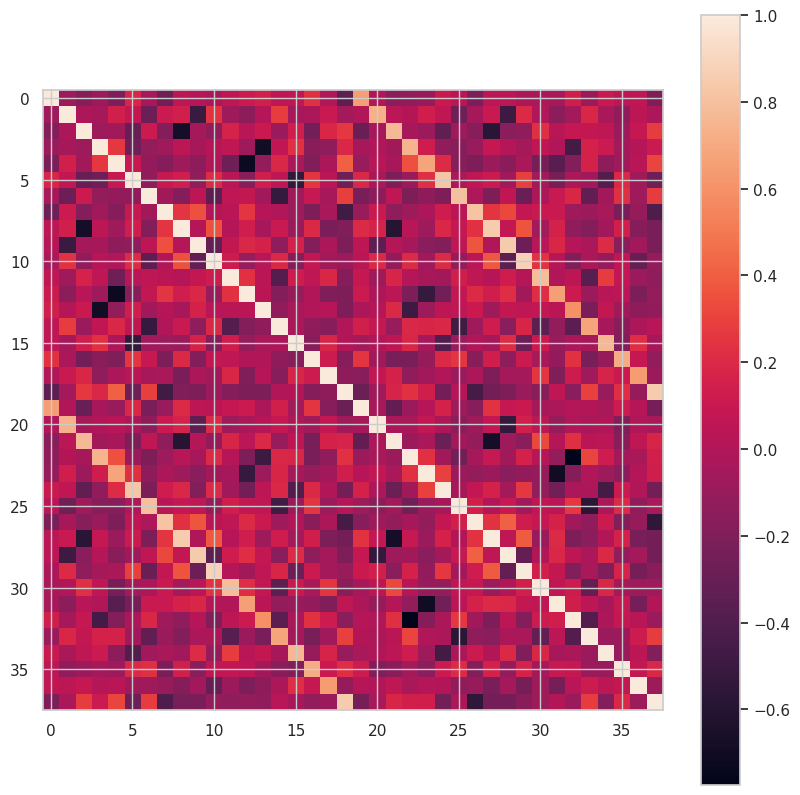

In [39]:
# plot a 2x2 subblock of the correlation matrix
f = plt.figure(figsize=(10,10))
plt.imshow(corrMat[0:19*2,0:19*2], interpolation='None')
plt.colorbar()

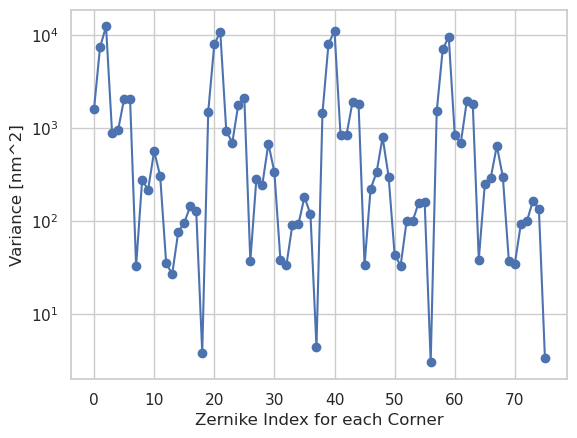

In [40]:
# Reproduce plot in paper
f,ax = plt.subplots(1,1)
_ = ax.plot(diag**2,'b-o')
ax.set_xlabel('Zernike Index for each Corner')
ax.set_ylabel('Variance [nm^2]')
ax.set_yscale('log')

Text(0.5, 1.0, 'Wavefront Correlation Matrix')

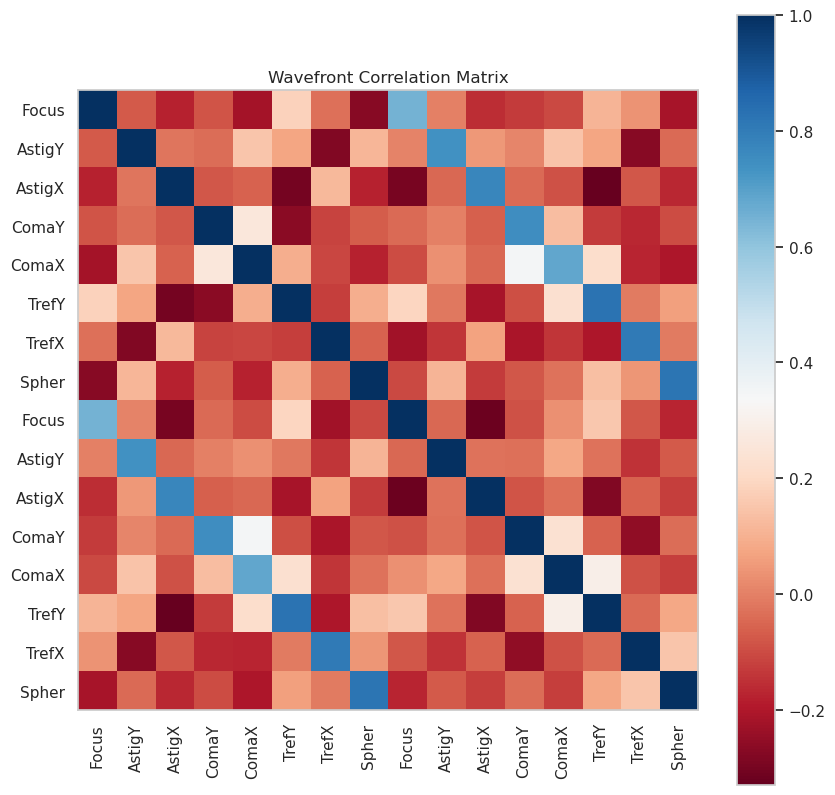

In [41]:
# plot a subset of the correlation MAtrix
f = plt.figure(figsize=(10,10))
x = np.arange(16)
labels = ['Focus', 'AstigY', 'AstigX', 'ComaY','ComaX','TrefY','TrefX','Spher','Focus', 'AstigY', 'AstigX', 'ComaY','ComaX','TrefY','TrefX','Spher']
plt.imshow(corrMatLeading,interpolation='None', cmap= 'RdBu')
plt.xticks(x, labels, rotation='vertical')
plt.yticks(x, labels, rotation='horizontal')
plt.grid(False)
plt.colorbar()

plt.title('Wavefront Correlation Matrix')

## Simulated Zernikes Correlation

[sim] Using data_key='corC' (precomputed correlation)


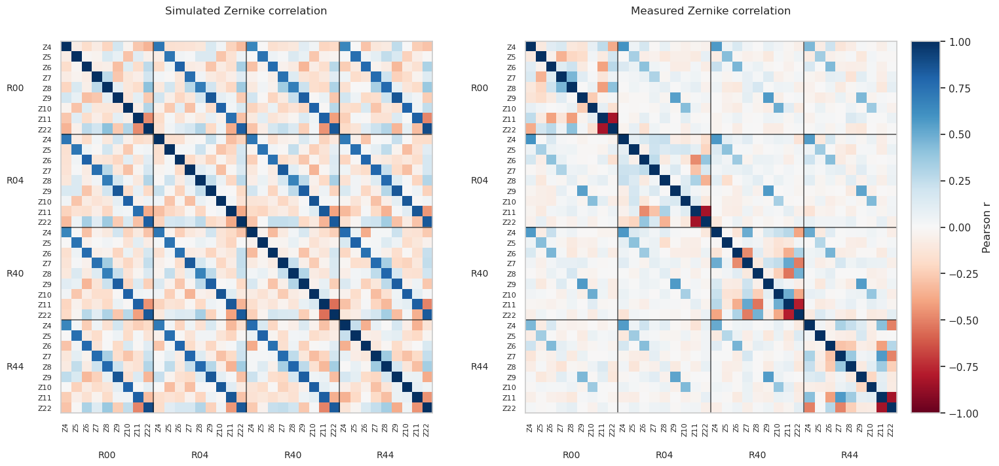

In [42]:
# --- Simulated vs measured Zernike correlation (side-by-side, same layout)

# Simulated correlation comes from the .mat file (NOT the covariance matrix).
# If the auto-detection picks the wrong array, set data_key to the correct variable name.
data_key = None  # e.g., 'corC' if that's the simulated correlation matrix

# Corner order:
# - Simulation arrays in covM86.mat are stored in an *unknown* corner-block order unless documented.
# - Historically in this notebook we assumed sim block order ['R00','R40','R04','R44'].
# - For display and comparison with ts_ofc, we prefer canonical order ['R00','R04','R40','R44'].
corner_order_sim = ["R00", "R40", "R04", "R44"]
if "CORNERS" in globals():
    corner_labels = list(CORNERS)  # canonical display order
else:
    corner_labels = ["R00", "R04", "R40", "R44"]

# Zernikes to display (matching the leading set used elsewhere)
# z_list = list(range(4, 22 + 1))  # full
z_list = list(range(4, 11 + 1)) + [22]  # Z4..Z11 plus Z22


def _find_simulation_candidates(mat_dict, nvars_expected_set):
    candidates = []
    for k, v in mat_dict.items():
        if k.startswith("__") or k == "covM":
            continue
        if not isinstance(v, np.ndarray):
            continue
        if v.ndim != 2:
            continue
        # Require one dimension to match any expected size
        if v.shape[0] in nvars_expected_set or v.shape[1] in nvars_expected_set:
            candidates.append((k, v))
    # Prefer larger arrays (more samples)
    candidates.sort(key=lambda kv: np.prod(kv[1].shape), reverse=True)
    return candidates


def _plot_corr(ax, Ccorr, z_list_local, corner_labels_local, title):
    nZ = len(z_list_local)
    nCorners = len(corner_labels_local)
    nVars = nCorners * nZ
    im = ax.imshow(Ccorr, cmap="RdBu", vmin=-1, vmax=1)
    ax.set_title(title, fontsize=12, pad=30)
    # Ticks: annotate EACH variable with its Zernike label (not necessarily sequential)
    z_tick_labels = [f"Z{int(z)}" for _d in corner_labels_local for z in z_list_local]
    ax.set_xticks(np.arange(nVars))
    ax.set_yticks(np.arange(nVars))
    ax.set_xticklabels(z_tick_labels, rotation=90, fontsize=8)
    ax.set_yticklabels(z_tick_labels, fontsize=8)
    ax.grid(False)

    # Corner-block separators
    for k in range(1, nCorners):
        cut = k * nZ - 0.5
        ax.axhline(cut, color="k", lw=1.2, alpha=0.7)
        ax.axvline(cut, color="k", lw=1.2, alpha=0.7)

    # Corner labels (outside axes, centered on each corner block)
    block_centers = [k * nZ + (nZ - 1) / 2 for k in range(nCorners)]
    for center, d in zip(block_centers, corner_labels_local):
        ax.text(center, nVars + 4, d, ha="center", va="bottom", fontsize=10, clip_on=False)
        ax.text(-4, center, d, ha="right", va="center", fontsize=10, clip_on=False)
    return im


# -------- Simulated correlation --------
nCorners = 4
z_full = list(range(4, 22 + 1))
nZ_full = len(z_full)
nZ = len(z_list)
nVars = nCorners * nZ
nVars_full = nCorners * nZ_full

if data_key is None and "corC" in mat:
    data_key = "corC"
    print("[sim] Using data_key='corC' (precomputed correlation)")

if data_key is not None:
    if data_key not in mat:
        raise KeyError(f"data_key='{data_key}' not found in mat keys: {list(mat.keys())}")
    sim = mat[data_key]
else:
    _cands = _find_simulation_candidates(mat, nvars_expected_set={nVars, nVars_full})
    if len(_cands) == 0:
        raise ValueError(
            "No simulated data array found. Set data_key to a valid 2D array in mat (not covM) with one dimension = 36 or 76."
        )
    data_key, sim = _cands[0]
    print(f"[sim] Using data_key='{data_key}' with shape {sim.shape}")

# Build index list for z_list within each corner block, mapping from displayed corner_labels -> sim block index
corner_to_sim = {c: i for i, c in enumerate(corner_order_sim)}
z_to_idx = {z: (z - 4) for z in z_full}

idx = []
for corner in corner_labels:
    if corner not in corner_to_sim:
        raise ValueError(f"Corner {corner} not in corner_order_sim={corner_order_sim}")
    c_sim = corner_to_sim[corner]
    base = c_sim * nZ_full
    for z in z_list:
        idx.append(base + z_to_idx[int(z)])
idx = np.array(idx, dtype=int)

# Case A: precomputed correlation/covariance matrix (square 76x76)
if sim.shape[0] == nVars_full and sim.shape[1] == nVars_full:
    Ccorr_sim = sim[np.ix_(idx, idx)]
else:
    # Case B: sample matrix with one dimension = 76 or 36
    if sim.shape[1] in (nVars, nVars_full):
        M = sim
    elif sim.shape[0] in (nVars, nVars_full):
        M = sim.T
    else:
        raise ValueError(
            f"Simulated data shape {sim.shape} does not match expected nVars={nVars} or nVars_full={nVars_full}"
        )
    if M.shape[1] == nVars_full:
        M = M[:, idx]
    m = np.isfinite(M).all(axis=1)
    M = M[m]
    if M.shape[0] < 3:
        Ccorr_sim = None
        print(f"[sim] Not enough finite rows to compute correlation (rows={M.shape[0]}).")
    else:
        Ccorr_sim = np.corrcoef(M, rowvar=False)


# -------- Measured correlation (from df_corner) --------
Ccorr_meas = None
if "df_corner" in globals():
    # Prefer to use the same corner_labels order for measured so the panels are directly comparable
    dets_meas = list(corner_labels)
    z_use = [int(z) for z in z_list]
    cols_all = [f"{d}_Z{z}" for d in dets_meas for z in z_use]

    if all(c in df_corner.columns for c in cols_all):
        M_meas = df_corner[cols_all].to_numpy(dtype=float)
        m_meas = np.isfinite(M_meas).all(axis=1)
        M_meas = M_meas[m_meas]
        if M_meas.shape[0] >= 3:
            Ccorr_meas = np.corrcoef(M_meas, rowvar=False)
        else:
            print("[meas] Not enough finite rows to compute measured correlation.")
    else:
        print("[meas] Missing expected columns for selected Zs; cannot build measured correlation.")
        missing = [c for c in cols_all if c not in df_corner.columns]
        print(f"[meas] Missing (first 10): {missing[:10]}")
else:
    print("[meas] df_corner not available; run the measured-correlation cell first.")


# -------- Plot side-by-side --------
if Ccorr_sim is None:
    print("[sim] No simulated correlation available to plot.")
else:
    if Ccorr_meas is None:
        fig, ax = plt.subplots(1, 1, figsize=(12, 12))
        im = _plot_corr(ax, Ccorr_sim, z_list, corner_labels, "Simulated Zernike correlation")
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Pearson r")
        plt.subplots_adjust(bottom=0.28, left=0.28)
        plt.show()
    else:
        fig, axes = plt.subplots(1, 2, figsize=(22, 10))
        im0 = _plot_corr(axes[0], Ccorr_sim, z_list, corner_labels, "Simulated Zernike correlation")
        im1 = _plot_corr(axes[1], Ccorr_meas, z_list, corner_labels, "Measured Zernike correlation")
        # Reserve space on the right for a shared colorbar
        plt.subplots_adjust(bottom=0.28, left=0.28, right=0.86, top=0.88, wspace=0.25)
        # Align colorbar vertically with the subplot extents
        bbox = axes[1].get_position()
        cax = fig.add_axes([bbox.x1 + 0.01, bbox.y0, 0.02, bbox.height])
        cbar = fig.colorbar(im1, cax=cax)
        cbar.set_label("Pearson r")
        plt.show()


## Simulated Cov Matrix vs Measured Cov Matrix (not clipped)

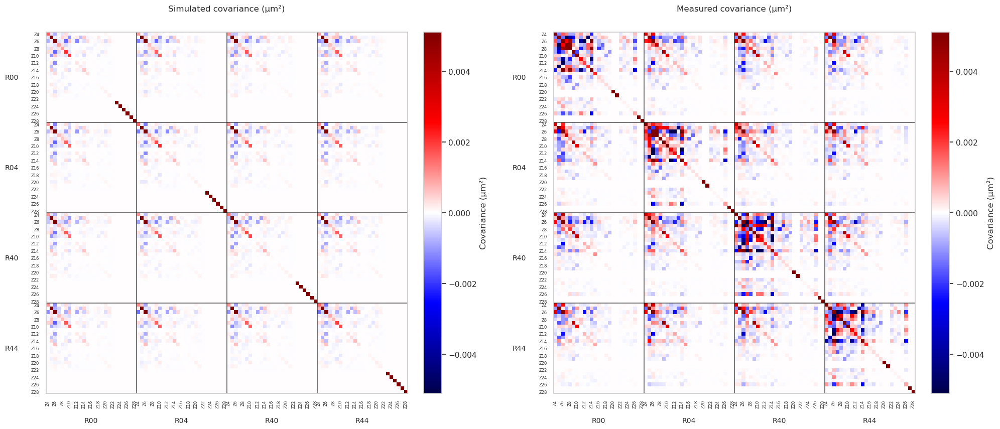

In [43]:
# --- Simulated vs measured covariance matrix (side-by-side, same layout)

# Simulated covariance uses covM from the .mat file; measured uses C_new (remapped).
# Missing Zernikes in the simulated matrix are added with diag=1 and off-diagonal=0.

corner_labels = ['R00', 'R04', 'R40', 'R44']
nCorners = len(corner_labels)

# Target Z list (prefer existing remap indices if available)
if 'zern_indices_plot' in globals():
    z_target = list(zern_indices_plot)
elif 'target_indices' in globals():
    z_target = list(target_indices)
elif 'zerns' in globals():
    z_target = list(zerns)
else:
    z_target = list(range(4, 27))  # default Z4..Z26

# Measured covariance (C_new)
C_meas = None
if 'C_new' in globals():
    C_meas = np.asarray(C_new, dtype=float)
    # Align z_target length to C_new if needed
    if C_meas.shape[0] % nCorners == 0:
        nZ_meas = C_meas.shape[0] // nCorners
        if len(z_target) != nZ_meas:
            z_target = list(range(4, 4 + nZ_meas))
else:
    print("[meas] C_new not found; run the remap/measurement covariance cell first.")

nZ_target = len(z_target)
nVars_target = nCorners * nZ_target

# Simulated covariance (covM)
if 'covM' not in mat:
    raise KeyError("covM not found in mat")
C_sim_raw = np.asarray(mat['covM'], dtype=float)
nZ_sim = len(range(4, 22 + 1))
nVars_sim = nZ_sim * nCorners
if C_sim_raw.shape != (nVars_sim, nVars_sim):
    raise ValueError(f"covM shape {C_sim_raw.shape} does not match expected {(nVars_sim, nVars_sim)}")

# Convert nm^2 -> um^2
C_sim_raw = C_sim_raw / 1e6

# Remap simulated covariance into target Z grid
# IMPORTANT: preserve cross-corner covariances for Zernikes that exist in sim.
z_full_sim = list(range(4, 22 + 1))
z_to_idx_sim = {int(z): (int(z) - 4) for z in z_full_sim}

# For each target variable (corner, z), store the corresponding simulated index or -1 if missing
sim_idx_for_target = np.full(nVars_target, -1, dtype=int)
for c in range(nCorners):
    for i, z in enumerate(z_target):
        z_int = int(z)
        t = c * nZ_target + i
        if z_int in z_to_idx_sim:
            sim_idx_for_target[t] = c * nZ_sim + z_to_idx_sim[z_int]

C_sim = np.zeros((nVars_target, nVars_target), dtype=float)

# Copy all available entries at once (includes cross-corner blocks)
mask_present = sim_idx_for_target >= 0
t_pos = np.where(mask_present)[0]
s_pos = sim_idx_for_target[mask_present]
C_sim[np.ix_(t_pos, t_pos)] = C_sim_raw[np.ix_(s_pos, s_pos)]

# Add missing Zernikes: diagonal=1, off-diagonal=0
missing = np.where(~mask_present)[0]
C_sim[missing, missing] = 1.0

def _plot_cov(ax, Ccov, z_list_local, corner_labels_local, title, vmin, vmax):
    nZ = len(z_list_local)
    nCorners_local = len(corner_labels_local)
    nVars = nZ * nCorners_local
    im = ax.imshow(Ccov, cmap='seismic', vmin=vmin, vmax=vmax)
    ax.set_title(title, fontsize=12, pad=30)
    # Show every 2nd Zernike label based on actual indices
    tick_pos = np.arange(0, nZ, 2)
    tick_labels = [f"Z{int(z_list_local[i])}" for i in tick_pos]
    xticks, yticks, xlabels, ylabels = [], [], [], []
    for d in range(nCorners_local):
        offset = d * nZ
        xticks.extend(offset + tick_pos)
        yticks.extend(offset + tick_pos)
        xlabels.extend(tick_labels)
        ylabels.extend(tick_labels)
    ax.set_xticks(xticks)
    ax.set_yticks(yticks)
    ax.set_xticklabels(xlabels, rotation=90, fontsize=6)
    ax.set_yticklabels(ylabels, fontsize=6)
    ax.grid(False)
    for k in range(1, nCorners_local):
        cut = k * nZ - 0.5
        ax.axhline(cut, color='k', lw=1.2, alpha=0.7)
        ax.axvline(cut, color='k', lw=1.2, alpha=0.7)
    block_centers = [k * nZ + (nZ - 1) / 2 for k in range(nCorners_local)]
    for center, d in zip(block_centers, corner_labels_local):
        ax.text(center, nVars + 8, d, ha='center', va='bottom', fontsize=10, clip_on=False)
        ax.text(-8, center, d, ha='right', va='center', fontsize=10, clip_on=False)
    return im

def _vmax_percentile_masked_diag_abs1(x, percentile=99.5):
    if x is None:
        return 1.0
    x = np.asarray(x, dtype=float)
    if x.ndim != 2 or x.shape[0] != x.shape[1]:
        return float(np.nanmax(np.abs(x))) if np.isfinite(x).any() else 1.0
    mask = np.eye(x.shape[0], dtype=bool) & np.isclose(np.abs(x), 1.0)
    y = x.copy()
    y[mask] = np.nan
    if np.isfinite(y).any():
        vmax = float(np.nanpercentile(np.abs(y), percentile))
        if np.isfinite(vmax) and vmax > 0:
            return vmax
    return float(np.nanmax(np.abs(y))) if np.isfinite(y).any() else 1.0

# -------- Plot side-by-side --------
vmax_sim = _vmax_percentile_masked_diag_abs1(C_sim, percentile=99.1)
vmin_sim = -vmax_sim
if C_meas is None:
    fig, ax = plt.subplots(1, 1, figsize=(14, 12))
    im = _plot_cov(ax, C_sim, z_target, corner_labels, 'Simulated covariance (μm²)', vmin=vmin_meas, vmax=vmax_meas)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='Covariance (μm²)')
    plt.subplots_adjust(bottom=0.28, left=0.28)
    plt.show()
else:
    vmax_meas = _vmax_percentile_masked_diag_abs1(C_meas, percentile=99.1)
    vmin_meas = -vmax_meas
    fig, axes = plt.subplots(1, 2, figsize=(26, 12))
    im0 = _plot_cov(axes[0], C_sim, z_target, corner_labels, 'Simulated covariance (μm²)', vmin=vmin_meas, vmax=vmax_meas)
    im1 = _plot_cov(axes[1], C_meas, z_target, corner_labels, 'Measured covariance (μm²)', vmin=vmin_meas, vmax=vmax_meas)
    fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04, label='Covariance (μm²)')
    fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, label='Covariance (μm²)')
    plt.subplots_adjust(bottom=0.28, left=0.28, right=0.98, top=0.88, wspace=0.25)
    plt.show()

### PSD sanity check (C_sim vs C_new)

Check symmetry and eigenvalues of simulated and measured covariance matrices before state estimation.

In [44]:
# PSD sanity check: simulated vs measured covariance (C_sim vs C_new)

import numpy as np

def _psd_report(name, C):
    C = np.asarray(C, dtype=float)
    if C.ndim != 2 or C.shape[0] != C.shape[1]:
        raise ValueError(f"{name}: expected square 2D matrix; got shape {C.shape}")

    # Report symmetry without modifying the matrix
    asym = float(np.nanmax(np.abs(C - C.T))) if np.isfinite(C).any() else float('nan')
    diag = np.diag(C)
    scale = float(np.nanmax(np.abs(diag))) if np.isfinite(diag).any() else 1.0
    tol = 1e-12 * max(scale, 1.0)

    if asym <= tol:
        eig = np.linalg.eigvalsh(C)
    else:
        # Fall back to general eigenvalues if C is not symmetric
        eig = np.linalg.eigvals(C)
        eig = np.real_if_close(eig, tol=1000)

    n_neg = int(np.sum(np.real(eig) < -tol))
    min_eig = float(np.min(np.real(eig)))
    print(
        f"{name}: shape={C.shape}  max|C-C^T|={asym:.3e}  min_eig={min_eig:.3e}  neg_eigs(<-{tol:.3e})={n_neg}"
    )
    return dict(min_eig=min_eig, tol=tol, n_neg=n_neg, asym=asym)

if 'C_sim' not in globals():
    raise NameError("C_sim not found. Run the 'Simulated Cov Matrix vs Measured Cov Matrix' plot cell first.")

# Prefer the measured matrix built in that plot cell, but fall back to C_new if needed
if 'C_meas' in globals() and C_meas is not None:
    C_meas_use = C_meas
elif 'C_new' in globals():
    C_meas_use = C_new
else:
    C_meas_use = None

_ = _psd_report('C_sim (remapped, μm²)', C_sim)
if C_meas_use is None:
    print('C_meas/C_new not available in globals()')
else:
    _ = _psd_report('C_new (measured, μm²)', C_meas_use)

C_sim (remapped, μm²): shape=(100, 100)  max|C-C^T|=0.000e+00  min_eig=1.310e-08  neg_eigs(<-1.000e-12)=0
C_new (measured, μm²): shape=(100, 100)  max|C-C^T|=0.000e+00  min_eig=7.485e-06  neg_eigs(<-1.000e-12)=0


### State Estimation Comparison: Simulated, Measured vs Cov=False 

Run the three-pass state-estimation loop to compute DOF states with `C_sim`, measured, and with covariance disabled, then collect arrays for comparison.

In [45]:
# Calculate DOFs using Simulated Cov vs Measured Cov vs Cov=False (no plotting here)
##
# Mirrors the earlier "Processing States" style (ConsDB query + tqdm loop).
#
# IMPORTANT: We run in three passes (reuse cached zernikes from PASS1):
#   1) Cov=False for all sequences
#   2) SimCov for the successful Cov=False sequences
#   3) MeasuredCov (C_new) for the successful Cov=False sequences
#
# Also IMPORTANT:
# - `StateEstimator` interprets rows of zk_ccs in the same order as `corner_detnames`.
# - `noise_covariance` must have matching corner-block ordering.
# - We canonicalize all of this (ts_ofc order) via the canonicalization cell after "Helper Methods".

import traceback

# ------------------ user inputs (match earlier style) ------------------
seq_min = 144
seq_max = 183  # 183
day = 20251109

# seq_min = 66
# seq_max = 105
# day = 20251107

# ------------------ ConsDB query (match earlier style) ------------------
query = f"""
    SELECT
    e.seq_num AS seq,
    e.band,
    e.day_obs,
    q.physical_rotator_angle,
    e.altitude,
    e.obs_end,
    e.obs_start,
    e.science_program,
    e.dimm_seeing,
    e.observation_reason,
    q.aos_fwhm
    FROM
    cdb_lsstcam.visit1_quicklook AS q,
    cdb_lsstcam.exposure AS e
    WHERE
    q.visit_id = e.exposure_id
    AND (e.img_type = 'science' or e.img_type = 'acq' or e.img_type = 'engtest')
    AND e.day_obs = {day}
    AND (e.seq_num BETWEEN {seq_min} and {seq_max})
"""
cdb_client = ConsDbClient("http://consdb-pq.consdb:8080/consdb")
cdb_table_all = cdb_client.query(query).to_pandas()

# ------------------ helper + fetcher setup (match earlier style) ------------------
def parse_dof_str(dof_str):
    """Turn '0-4,10-14' into [0,1,2,3,4,10,11,12,13,14] for example..."""
    dof_str = dof_str.strip()
    use_dof_local = []
    for part in dof_str.split(","):
        if "-" in part:
            start, end = [int(p) for p in part.split("-")]
            use_dof_local.extend(range(start, end + 1))
        else:
            use_dof_local.append(int(part))
    use_dof_local = np.sort(use_dof_local)
    return use_dof_local


use_dof = "0-9,10-16,30-34"
use_dof = parse_dof_str(use_dof)

butler = makeDefaultButler("LSSTCam")
efd_client = EfdClient("summit_efd")
nkeep = 12
fetcher = ofcUtils.AOSFetcher(
    butler,
    efd_client,
    config_dir="/home/dsanmartim/notebooks/repos/lsst-ts/ts_config_mttcs/MTAOS/v8/ofc/",
)

# ------------------ Canonical corner order + Zernike grid ------------------
_expected_corner_detnames = ["R00_SW0", "R04_SW0", "R40_SW0", "R44_SW0"]
if "corner_detnames" not in globals():
    corner_detnames = _expected_corner_detnames
elif list(corner_detnames) != _expected_corner_detnames:
    raise ValueError(
        f"corner_detnames mismatch: got {corner_detnames}, expected {_expected_corner_detnames}. "
        "Run the canonicalization cell (after 'Helper Methods to Estimate States') before continuing."
    )

if "Z_TARGET" in globals():
    z_target = list(Z_TARGET)
else:
    z_target = list(range(4, 28 + 1))

nZ_target = len(z_target)
assert nZ_target == 25

if "align_zernikes_to_corner_detnames" not in globals():
    raise NameError(
        "align_zernikes_to_corner_detnames not found. Run the canonicalization cell (after 'Helper Methods to Estimate States') first."
    )

# ------------------ simulated covariance preparation (canonical) ------------------
if "build_sim_covariance_for_target" not in globals():
    raise NameError(
        "build_sim_covariance_for_target not found. Run the canonicalization cell (after 'Helper Methods to Estimate States') first."
    )

C_sim = build_sim_covariance_for_target(z_target=z_target)
print(f"[sim] Using z_target Z{z_target[0]}..Z{z_target[-1]} (nZ={len(z_target)})")
print(f"[sim] C_sim shape: {C_sim.shape}")
print(f"[sim] corner_detnames: {corner_detnames}")

# ------------------ measured covariance preparation (canonical C_new) ------------------
if "C_new" not in globals():
    raise NameError("C_new not found. Run the 'Remap Cov Matrix' cell first.")

C_meas_ordered = np.asarray(C_new, dtype=float)
print(f"[meas] Using canonical C_new shape: {C_meas_ordered.shape}")

# ------------------ processing loop (three-pass, tqdm + minimal verbose prints) ------------------
cdb_day = cdb_table_all[cdb_table_all["day_obs"] == day].sort_values("seq")
seqs_list = cdb_day["seq"].to_numpy()
if seqs_list.size == 0:
    raise RuntimeError(f"No sequences found for day={day} and seq range {seq_min}-{seq_max}")
print(f"Processing day={day} sequences: {seqs_list.min()}..{seqs_list.max()} (n={len(seqs_list)})")

# Cache aligned zernikes per sequence so we don't refetch twice.
zk_by_seq = {}
meta_by_seq = {}
failures = []


def _obs_id_for_seq(day_obs, seq):
    return int(f"{int(day_obs)}{str(int(seq)).zfill(5)}")


# ---- Pass 1: Cov=False ----
states_covfalse_list = []
bands_array = []
seqs_array = []
rots_array = []
els_array = []

print("--- PASS 1/3: Cov=False ---")
for seq in tqdm(seqs_list, desc=f"PASS1 Cov=False day {day}"):
    seq = int(seq)
    cdb_seq = cdb_day[cdb_day["seq"] == seq]
    if cdb_seq.empty:
        continue
    rtp = cdb_seq["physical_rotator_angle"].iloc[0]
    band = cdb_seq["band"].iloc[0]
    el = cdb_seq["altitude"].iloc[0]

    try:
        _ = butler.query_datasets("zernikes", exposure=_obs_id_for_seq(day, seq))
    except Exception:
        pass

    print(seq)
    try:
        zernikes, zernike_array, noll_indices, sensor_names = fetcher.get_zernikes(
            _obs_id_for_seq(day, seq)
        )
        zernike_array = align_zernikes_to_corner_detnames(
            zernike_array,
            sensor_names=sensor_names,
            detnames=corner_detnames,
            nZ_expected=nZ_target,
        )
    except Exception:
        failures.append({"seq": seq, "stage": "fetcher.get_zernikes", "traceback": traceback.format_exc()})
        continue

    try:
        print("Getting state without the covariance matrix...")
        state_nocov = get_state(
            zernike_array,
            rtp=rtp,
            use_dof=use_dof,
            nkeep=nkeep,
            band=band,
            noise_covariance=None,
        )
    except Exception:
        failures.append({"seq": seq, "stage": "Cov=False", "traceback": traceback.format_exc()})
        continue

    zk_by_seq[seq] = zernike_array
    meta_by_seq[seq] = {"rtp": float(rtp), "band": band, "el": float(el)}
    states_covfalse_list.append(-np.asarray(state_nocov, dtype=float))
    bands_array.append(band)
    rots_array.append(float(rtp))
    seqs_array.append(seq)
    els_array.append(float(el))

if not states_covfalse_list:
    raise RuntimeError("No successful Cov=False state estimates; cannot proceed.")

states_covfalse_array = np.vstack(states_covfalse_list)
seqs_good = np.asarray(seqs_array, dtype=int)
print(f"PASS1 done. Successful Cov=False sequences: {len(seqs_good)}")

# ---- Pass 2: SimCov ----
states_simcov_list = []
printed_first_cov_failure = False

print("--- PASS 2/3: SimCov ---")
for seq in tqdm(seqs_good, desc=f"PASS2 SimCov day {day}"):
    seq = int(seq)
    print(seq)
    zernike_array = zk_by_seq[seq]
    meta = meta_by_seq[seq]
    try:
        print("Getting state using simulated covariance matrix...")
        state_cov = get_state(
            zernike_array,
            rtp=meta["rtp"],
            use_dof=use_dof,
            nkeep=nkeep,
            band=meta["band"],
            noise_covariance=C_sim,
        )
    except Exception:
        tb = traceback.format_exc()
        failures.append({"seq": seq, "stage": "SimCov", "traceback": tb})
        if not printed_first_cov_failure:
            printed_first_cov_failure = True
            print("--- FIRST SimCov FAILURE TRACEBACK ---")
            print(tb)
            print("--- END TRACEBACK ---")
        continue
    states_simcov_list.append(-np.asarray(state_cov, dtype=float))

if not states_simcov_list:
    raise RuntimeError("No successful SimCov state estimates; cannot proceed.")

states_simcov_array = np.vstack(states_simcov_list)
print(f"PASS2 done. Successful SimCov sequences: {states_simcov_array.shape[0]}")
print(f"State vector length: {states_simcov_array.shape[1]}")

# ---- Pass 3: MeasuredCov (C_new) ----
states_meascov_list = []
printed_first_meas_failure = False

print("--- PASS 3/3: MeasuredCov (C_new) ---")
for seq in tqdm(seqs_good, desc=f"PASS3 MeasuredCov day {day}"):
    seq = int(seq)
    print(seq)
    zernike_array = zk_by_seq[seq]
    meta = meta_by_seq[seq]
    try:
        print("Getting state using measured covariance matrix (C_new)...")
        state_cov = get_state(
            zernike_array,
            rtp=meta["rtp"],
            use_dof=use_dof,
            nkeep=nkeep,
            band=meta["band"],
            noise_covariance=C_meas_ordered,
        )
    except Exception:
        tb = traceback.format_exc()
        failures.append({"seq": seq, "stage": "MeasuredCov", "traceback": tb})
        if not printed_first_meas_failure:
            printed_first_meas_failure = True
            print("--- FIRST MeasuredCov FAILURE TRACEBACK ---")
            print(tb)
            print("--- END TRACEBACK ---")
        continue
    states_meascov_list.append(-np.asarray(state_cov, dtype=float))

if not states_meascov_list:
    raise RuntimeError("No successful MeasuredCov state estimates; cannot proceed.")

states_meascov_array = np.vstack(states_meascov_list)
print(f"PASS3 done. Successful MeasuredCov sequences: {states_meascov_array.shape[0]}")
print(f"State vector length: {states_meascov_array.shape[1]}")

if failures:
    print(f"WARNING: {len(failures)} sequences had failures (showing up to 5 summaries)")
    for f in failures[:5]:
        print(f"  seq={f['seq']} stage={f['stage']}: {f['traceback'].splitlines()[-1]}")

# Export arrays with names that won't clobber earlier sections
simcomp_states_covfalse_array = states_covfalse_array
simcomp_states_simcov_array = states_simcov_array
simcomp_states_meascov_array = states_meascov_array
simcomp_use_dof = np.asarray(use_dof, dtype=int)
simcomp_seqs = np.asarray(seqs_good, dtype=int)
simcomp_corner_detnames = list(corner_detnames)

print(
    f"[export] simcomp arrays shapes: covfalse={simcomp_states_covfalse_array.shape}, "
    f"simcov={simcomp_states_simcov_array.shape}, meascov={simcomp_states_meascov_array.shape}"
)


[sim] Using z_target Z4..Z28 (nZ=25)
[sim] C_sim shape: (100, 100)
[sim] corner_detnames: ['R00_SW0', 'R04_SW0', 'R40_SW0', 'R44_SW0']
[meas] Using canonical C_new shape: (100, 100)
Processing day=20251109 sequences: 144..183 (n=40)
--- PASS 1/3: Cov=False ---


PASS1 Cov=False day 20251109:   0%|          | 0/40 [00:00<?, ?it/s]

144
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:   2%|▎         | 1/40 [00:06<03:59,  6.14s/it]

145
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:   5%|▌         | 2/40 [00:11<03:35,  5.68s/it]

146
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:   8%|▊         | 3/40 [00:16<03:14,  5.27s/it]

147
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  10%|█         | 4/40 [00:21<03:10,  5.30s/it]

148
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  12%|█▎        | 5/40 [00:26<02:59,  5.13s/it]

149
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  15%|█▌        | 6/40 [00:31<02:57,  5.22s/it]

150
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  18%|█▊        | 7/40 [00:36<02:48,  5.10s/it]

151
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  20%|██        | 8/40 [00:42<02:46,  5.20s/it]

152
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  22%|██▎       | 9/40 [00:46<02:38,  5.10s/it]

153
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  25%|██▌       | 10/40 [00:52<02:35,  5.19s/it]

154
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  28%|██▊       | 11/40 [00:57<02:32,  5.27s/it]

155
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  30%|███       | 12/40 [01:02<02:23,  5.12s/it]

156
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  32%|███▎      | 13/40 [01:08<02:20,  5.22s/it]

157
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  35%|███▌      | 14/40 [01:12<02:12,  5.09s/it]

158
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  38%|███▊      | 15/40 [01:18<02:09,  5.18s/it]

159
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  40%|████      | 16/40 [01:23<02:02,  5.09s/it]

160
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  42%|████▎     | 17/40 [01:28<01:59,  5.20s/it]

161
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  45%|████▌     | 18/40 [01:33<01:55,  5.27s/it]

162
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  48%|████▊     | 19/40 [01:38<01:47,  5.13s/it]

163
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  50%|█████     | 20/40 [01:44<01:44,  5.22s/it]

164
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  52%|█████▎    | 21/40 [01:49<01:36,  5.10s/it]

165
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  55%|█████▌    | 22/40 [01:54<01:33,  5.19s/it]

166
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  57%|█████▊    | 23/40 [01:59<01:26,  5.12s/it]

167
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  60%|██████    | 24/40 [02:04<01:23,  5.22s/it]

168
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  62%|██████▎   | 25/40 [02:09<01:16,  5.09s/it]

169
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  65%|██████▌   | 26/40 [02:15<01:12,  5.19s/it]

170
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  68%|██████▊   | 27/40 [02:20<01:08,  5.26s/it]

171
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  70%|███████   | 28/40 [02:25<01:01,  5.12s/it]

172
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  72%|███████▎  | 29/40 [02:30<00:57,  5.20s/it]

173
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  75%|███████▌  | 30/40 [02:35<00:50,  5.06s/it]

174
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  78%|███████▊  | 31/40 [02:40<00:46,  5.20s/it]

175
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  80%|████████  | 32/40 [02:46<00:42,  5.26s/it]

176
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  82%|████████▎ | 33/40 [02:51<00:35,  5.10s/it]

177
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  85%|████████▌ | 34/40 [02:56<00:31,  5.19s/it]

178
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  88%|████████▊ | 35/40 [03:01<00:25,  5.05s/it]

179
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  90%|█████████ | 36/40 [03:06<00:20,  5.15s/it]

180
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  92%|█████████▎| 37/40 [03:11<00:15,  5.03s/it]

181
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  95%|█████████▌| 38/40 [03:16<00:10,  5.14s/it]

182
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109:  98%|█████████▊| 39/40 [03:22<00:05,  5.25s/it]

183
Getting state without the covariance matrix...


PASS1 Cov=False day 20251109: 100%|██████████| 40/40 [03:26<00:00,  5.17s/it]


PASS1 done. Successful Cov=False sequences: 40
--- PASS 2/3: SimCov ---


PASS2 SimCov day 20251109:   0%|          | 0/40 [00:00<?, ?it/s]

144
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:   2%|▎         | 1/40 [00:05<03:23,  5.22s/it]

145
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:   5%|▌         | 2/40 [00:09<03:08,  4.95s/it]

146
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:   8%|▊         | 3/40 [00:15<03:07,  5.05s/it]

147
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  10%|█         | 4/40 [00:19<02:55,  4.87s/it]

148
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  12%|█▎        | 5/40 [00:24<02:53,  4.97s/it]

149
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  15%|█▌        | 6/40 [00:30<02:51,  5.04s/it]

150
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  18%|█▊        | 7/40 [00:34<02:40,  4.87s/it]

151
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  20%|██        | 8/40 [00:39<02:39,  4.99s/it]

152
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  22%|██▎       | 9/40 [00:44<02:30,  4.84s/it]

153
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  25%|██▌       | 10/40 [00:49<02:28,  4.94s/it]

154
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  28%|██▊       | 11/40 [00:54<02:19,  4.81s/it]

155
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  30%|███       | 12/40 [00:59<02:17,  4.90s/it]

156
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  32%|███▎      | 13/40 [01:04<02:14,  4.98s/it]

157
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  35%|███▌      | 14/40 [01:08<02:06,  4.86s/it]

158
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  38%|███▊      | 15/40 [01:14<02:04,  4.98s/it]

159
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  40%|████      | 16/40 [01:18<01:56,  4.84s/it]

160
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  42%|████▎     | 17/40 [01:23<01:53,  4.94s/it]

161
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  45%|████▌     | 18/40 [01:28<01:46,  4.83s/it]

162
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  48%|████▊     | 19/40 [01:33<01:43,  4.94s/it]

163
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  50%|█████     | 20/40 [01:38<01:36,  4.83s/it]

164
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  52%|█████▎    | 21/40 [01:43<01:33,  4.93s/it]

165
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  55%|█████▌    | 22/40 [01:47<01:26,  4.80s/it]

166
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  57%|█████▊    | 23/40 [01:53<01:23,  4.93s/it]

167
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  60%|██████    | 24/40 [01:57<01:17,  4.82s/it]

168
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  62%|██████▎   | 25/40 [02:02<01:13,  4.92s/it]

169
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  65%|██████▌   | 26/40 [02:08<01:10,  5.01s/it]

170
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  68%|██████▊   | 27/40 [02:12<01:03,  4.89s/it]

171
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  70%|███████   | 28/40 [02:17<00:59,  4.97s/it]

172
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  72%|███████▎  | 29/40 [02:22<00:53,  4.84s/it]

173
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  75%|███████▌  | 30/40 [02:27<00:49,  4.96s/it]

174
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  78%|███████▊  | 31/40 [02:32<00:43,  4.86s/it]

175
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  80%|████████  | 32/40 [02:37<00:39,  4.94s/it]

176
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  82%|████████▎ | 33/40 [02:42<00:35,  5.02s/it]

177
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  85%|████████▌ | 34/40 [02:47<00:29,  4.89s/it]

178
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  88%|████████▊ | 35/40 [02:52<00:24,  4.96s/it]

179
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  90%|█████████ | 36/40 [02:56<00:19,  4.84s/it]

180
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  92%|█████████▎| 37/40 [03:01<00:14,  4.93s/it]

181
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  95%|█████████▌| 38/40 [03:06<00:09,  4.86s/it]

182
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109:  98%|█████████▊| 39/40 [03:11<00:04,  4.96s/it]

183
Getting state using simulated covariance matrix...


PASS2 SimCov day 20251109: 100%|██████████| 40/40 [03:16<00:00,  4.91s/it]


PASS2 done. Successful SimCov sequences: 40
State vector length: 22
--- PASS 3/3: MeasuredCov (C_new) ---


PASS3 MeasuredCov day 20251109:   0%|          | 0/40 [00:00<?, ?it/s]

144
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:   2%|▎         | 1/40 [00:05<03:22,  5.18s/it]

145
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:   5%|▌         | 2/40 [00:10<03:18,  5.22s/it]

146
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:   8%|▊         | 3/40 [00:14<03:01,  4.91s/it]

147
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  10%|█         | 4/40 [00:20<03:01,  5.03s/it]

148
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  12%|█▎        | 5/40 [00:24<02:49,  4.86s/it]

149
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  15%|█▌        | 6/40 [00:29<02:48,  4.96s/it]

150
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  18%|█▊        | 7/40 [00:34<02:39,  4.83s/it]

151
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  20%|██        | 8/40 [00:39<02:37,  4.92s/it]

152
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  22%|██▎       | 9/40 [00:44<02:35,  5.00s/it]

153
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  25%|██▌       | 10/40 [00:49<02:26,  4.87s/it]

154
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  28%|██▊       | 11/40 [00:54<02:24,  4.97s/it]

155
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  30%|███       | 12/40 [00:59<02:15,  4.83s/it]

156
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  32%|███▎      | 13/40 [01:04<02:12,  4.92s/it]

157
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  35%|███▌      | 14/40 [01:08<02:04,  4.80s/it]

158
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  38%|███▊      | 15/40 [01:13<02:02,  4.91s/it]

159
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  40%|████      | 16/40 [01:19<01:59,  4.99s/it]

160
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  42%|████▎     | 17/40 [01:23<01:51,  4.87s/it]

161
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  45%|████▌     | 18/40 [01:28<01:48,  4.94s/it]

162
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  48%|████▊     | 19/40 [01:33<01:41,  4.83s/it]

163
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  50%|█████     | 20/40 [01:38<01:38,  4.94s/it]

164
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  52%|█████▎    | 21/40 [01:43<01:32,  4.85s/it]

165
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  55%|█████▌    | 22/40 [01:48<01:29,  4.95s/it]

166
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  57%|█████▊    | 23/40 [01:52<01:22,  4.83s/it]

167
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  60%|██████    | 24/40 [01:58<01:18,  4.92s/it]

168
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  62%|██████▎   | 25/40 [02:02<01:12,  4.83s/it]

169
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  65%|██████▌   | 26/40 [02:07<01:09,  4.96s/it]

170
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  68%|██████▊   | 27/40 [02:12<01:02,  4.82s/it]

171
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  70%|███████   | 28/40 [02:17<00:58,  4.91s/it]

172
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  72%|███████▎  | 29/40 [02:22<00:55,  5.02s/it]

173
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  75%|███████▌  | 30/40 [02:27<00:48,  4.87s/it]

174
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  78%|███████▊  | 31/40 [02:32<00:44,  4.96s/it]

175
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  80%|████████  | 32/40 [02:37<00:38,  4.83s/it]

176
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  82%|████████▎ | 33/40 [02:42<00:34,  4.95s/it]

177
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  85%|████████▌ | 34/40 [02:46<00:28,  4.82s/it]

178
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  88%|████████▊ | 35/40 [02:51<00:24,  4.93s/it]

179
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  90%|█████████ | 36/40 [02:57<00:19,  4.99s/it]

180
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  92%|█████████▎| 37/40 [03:01<00:14,  4.86s/it]

181
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  95%|█████████▌| 38/40 [03:06<00:09,  4.96s/it]

182
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109:  98%|█████████▊| 39/40 [03:11<00:04,  4.84s/it]

183
Getting state using measured covariance matrix (C_new)...


PASS3 MeasuredCov day 20251109: 100%|██████████| 40/40 [03:16<00:00,  4.91s/it]

PASS3 done. Successful MeasuredCov sequences: 40
State vector length: 22
[export] simcomp arrays shapes: covfalse=(40, 22), simcov=(40, 22), meascov=(40, 22)


#### Plotting Results

Use the computed state arrays from the three-pass loop to compare per-DOF distributions:
- MeasuredCov (`C_new`)
- SimCov (`C_sim`)
- Cov=False

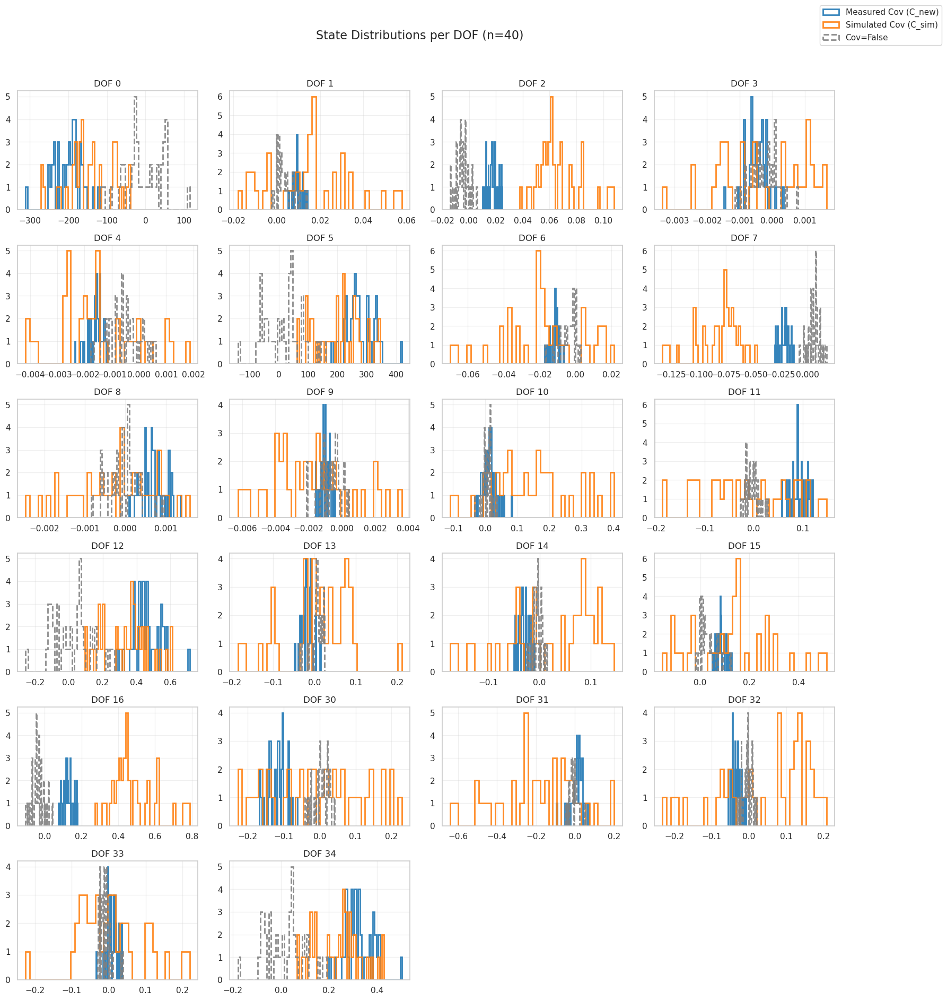

In [46]:
# Plot: per-DOF state distributions (MeasuredCov vs SimCov vs Cov=False)

needed = [
    "simcomp_states_covfalse_array",
    "simcomp_states_simcov_array",
    "simcomp_states_meascov_array",
    "simcomp_use_dof",
]
missing = [k for k in needed if k not in globals()]
if missing:
    raise NameError(f"Run the three-pass compute cell above first. Missing: {missing}")

covfalse = np.asarray(simcomp_states_covfalse_array, dtype=float)
simcov = np.asarray(simcomp_states_simcov_array, dtype=float)
meascov = np.asarray(simcomp_states_meascov_array, dtype=float)
use_dof_list = list(np.asarray(simcomp_use_dof, dtype=int))

# Validate shapes (use common min n_samples if one pass failed some seqs)
n_dof = len(use_dof_list)
for name, arr in [("covfalse", covfalse), ("simcov", simcov), ("meascov", meascov)]:
    if arr.ndim != 2:
        raise ValueError(f"{name}: expected 2D array; got shape={arr.shape}")
    if arr.shape[1] != n_dof:
        raise ValueError(f"{name}: expected n_dof={n_dof}; got {arr.shape[1]}")

n_use = int(min(covfalse.shape[0], simcov.shape[0], meascov.shape[0]))
if n_use < 3:
    raise ValueError(f"Not enough samples to compare distributions: n_use={n_use}")
if covfalse.shape[0] != n_use or simcov.shape[0] != n_use or meascov.shape[0] != n_use:
    print(f"[plot] NOTE: sample counts differ; truncating to n={n_use} for fair comparison")
    covfalse = covfalse[:n_use, :]
    simcov = simcov[:n_use, :]
    meascov = meascov[:n_use, :]

ncols = 4
nrows = int(np.ceil(n_dof / ncols))
bins = 40

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(4 * ncols, 3 * nrows),
    sharex=False, sharey=False,
)
axes = np.asarray(axes).ravel()

def _finite_1d(x: np.ndarray) -> np.ndarray:
    x = np.asarray(x, dtype=float).ravel()
    return x[np.isfinite(x)]

for idx, dof_id in enumerate(use_dof_list):
    ax = axes[idx]

    x_meas = _finite_1d(meascov[:, idx])
    x_sim = _finite_1d(simcov[:, idx])
    x_no = _finite_1d(covfalse[:, idx])

    if x_meas.size:
        ax.hist(
            x_meas,
            bins=bins,
            histtype='step',
            linewidth=2,
            label='Measured Cov (C_new)' if idx == 0 else None,
            alpha=0.9,
            color='tab:blue',
        )
    if x_sim.size:
        ax.hist(
            x_sim,
            bins=bins,
            histtype='step',
            linewidth=2,
            label='Simulated Cov (C_sim)' if idx == 0 else None,
            alpha=0.9,
            color='tab:orange',
        )
    if x_no.size:
        ax.hist(
            x_no,
            bins=bins,
            histtype='step',
            linewidth=2,
            label='Cov=False' if idx == 0 else None,
            linestyle='--',
            alpha=0.9,
            color='gray',
        )

    ax.set_title(f"DOF {dof_id}")
    ax.grid(alpha=0.3)

# Turn off unused axes if DOFs < grid slots
for ax in axes[n_dof:]:
    ax.axis('off')

fig.suptitle(f"State Distributions per DOF (n={n_use})", fontsize=16, y=1.02)
fig.tight_layout()

# Legend: collect handles/labels and keep unique
handles_all, labels_all = [], []
for ax in axes[:n_dof]:
    h, l = ax.get_legend_handles_labels()
    for hh, ll in zip(h, l):
        if ll and (ll not in labels_all):
            handles_all.append(hh)
            labels_all.append(ll)
if handles_all:
    fig.legend(handles_all, labels_all, loc='upper right', bbox_to_anchor=(1.12, 1.05), frameon=True)

plt.show()

## Variance Comparison

Before comparing simulated vs measured variances, a key detail is the note in the simulation section: **"Simulation was performed at 770nm"**.

**Implication (simulation vs measured):**
- The measured ConsDB Zernike coefficients are in **µm**, i.e. a **length** unit (OPD / wavefront error). In that representation they are *not tied to a specific wavelength*; you can convert µm → nm (×1000) and compare variances directly in nm².
- The wavelength matters only if coefficients are expressed in **waves** (dimensionless). Converting waves → OPD uses $\mathrm{OPD}_{nm}=\mathrm{OPD}_{waves}\times \lambda_{nm}$, so variances scale as $\lambda^2$. The **correlation** matrix is unchanged by any constant scaling.
- In the AOS/OFC derivations (see the OFC SITCOMTN-219 note), $\lambda$ appears when mapping wavefront error to **image-quality metrics** like PSSN per-filter; that is separate from storing Zernike coefficients as OPD lengths.

For the plot below we compare **per-corner, per-Zernike variance** (diagonal of the covariance) from:
- the simulated covariance `mat['covM']` (nm²), and
- the measured coefficient table `df_corner` (ConsDB Zernikes in µm, converted to nm).

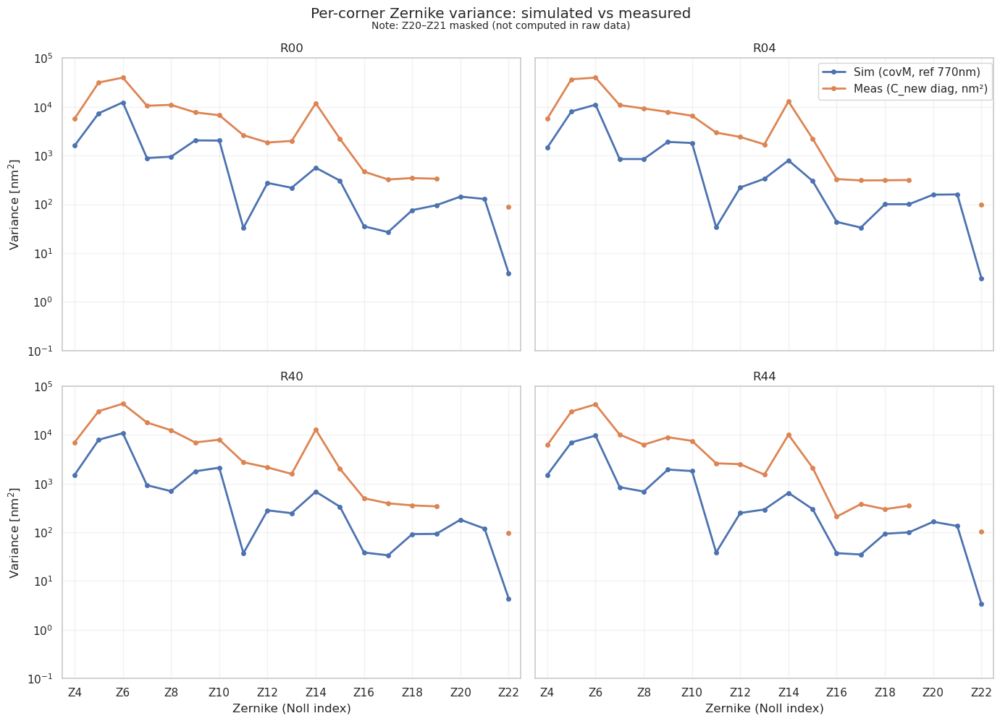

In [47]:
# Plot: per-corner Zernike variance (Simulated covM vs Measured coefficients or C_new)

# ----------------------------
# Settings (edit if needed)
# ----------------------------
# Canonical (ts_ofc) corner order for all downstream comparisons
if "CORNERS" in globals():
    dets = list(CORNERS)
else:
    dets = ["R00", "R04", "R40", "R44"]

# NOTE: the raw simulated covM is stored in CORNERS_RAW order.
corner_order_sim = ["R00", "R40", "R04", "R44"]

z_full = list(range(4, 23))  # matches covM86.mat content (Z4..Z22)
ddof = 0  # ddof=0 matches population variance; ddof=1 for sample variance

# Choose how to get the measured variance:
# - True: use remapped measured covariance C_new (preferred; includes Z20/Z21 handling)
# - False: use variance from measured coefficients df_corner
use_C_new_for_measured = True

# Zernikes that were not computed in the raw data (mask in variance plots)
mask_zernikes = [20, 21]

# Measured coefficient units (from ConsDB): µm OPD
# - If your measured coefficients are OPD length units (µm), convert to nm with ×1000.
# - If instead you ever work in waves, switch meas_units to 'waves' and set lambda_meas_nm.
meas_units = "um"  # 'um' | 'nm' | 'waves'
lambda_meas_nm = 770.0
sim_lambda_nm = 770.0

# X-axis tick labeling
show_every = 2  # show Z4, Z6, Z8, ...

# ----------------------------
# Inputs: simulated covM, measured df_corner / C_new
# ----------------------------
if "mat" not in globals():
    raise NameError("'mat' not found. Run the simulated covariance loading cell (covM86.mat) first.")
if "covM" in mat:
    covM_sim = np.asarray(mat["covM"], dtype=float)
else:
    raise KeyError("'covM' not present in mat; cannot build simulated variances.")

if covM_sim.ndim != 2 or covM_sim.shape[0] != covM_sim.shape[1]:
    raise ValueError(f"Expected square covM. Got shape={covM_sim.shape}")

nCorners = len(dets)
nZ = len(z_full)
nVars_expected = nCorners * nZ
if covM_sim.shape != (nVars_expected, nVars_expected):
    raise ValueError(
        f"Expected covM shape {(nVars_expected, nVars_expected)} for {nCorners} corners x {nZ} Zernikes. Got {covM_sim.shape}"
    )

if "df_corner" not in globals():
    raise NameError("'df_corner' not found. Run the Corner Zernike 'load a table of coefficients' cell first.")
df_meas = df_corner.copy()

# ----------------------------
# Unit conversion for measured coefficients
# ----------------------------
meas_units = str(meas_units).strip().lower()
if meas_units not in ("um", "nm", "waves"):
    raise ValueError("meas_units must be one of: 'um', 'nm', 'waves'")

if meas_units == "um":
    meas_scale = 1000.0  # µm -> nm
    meas_label = "Meas (nm, from µm×1000)"
elif meas_units == "nm":
    meas_scale = 1.0
    meas_label = "Meas (nm)"
else:
    meas_scale = float(lambda_meas_nm)
    meas_label = f"Meas (nm, from waves @ {lambda_meas_nm:g}nm)"

# ----------------------------
# Build per-corner variance arrays
# ----------------------------
# Simulated covM diagonal is in corner_order_sim blocks; remap to canonical dets order.
sim_diag = np.diag(covM_sim).astype(float)  # nm^2 if covM is in nm
sim_var_by_corner: dict[str, np.ndarray] = {}
for det in dets:
    i_sim = corner_order_sim.index(det)
    sim_var_by_corner[det] = sim_diag[i_sim * nZ : (i_sim + 1) * nZ]

meas_var_by_corner: dict[str, np.ndarray] = {}
if use_C_new_for_measured:
    if "C_new" not in globals():
        raise NameError("'C_new' not found. Run the remap cell to build C_new first.")
    C_meas = np.asarray(C_new, dtype=float)
    nZ_full_meas = 25  # Z4..Z28
    if C_meas.shape[0] != nCorners * nZ_full_meas:
        raise ValueError(
            f"C_new shape {C_meas.shape} does not match expected {(nCorners * nZ_full_meas, nCorners * nZ_full_meas)}"
        )
    # C_new is in µm^2; convert to nm^2
    C_meas_nm2 = C_meas * 1e6

    # Map diag for Z4..Z22 into z_full order
    z_full_meas = list(range(4, 29))
    for i, det in enumerate(dets):
        diag_full = np.diag(C_meas_nm2)[i * nZ_full_meas : (i + 1) * nZ_full_meas]
        full_map = {z: diag_full[j] for j, z in enumerate(z_full_meas)}
        meas_var_by_corner[det] = np.array([full_map[z] for z in z_full], dtype=float)
    meas_label = "Meas (C_new diag, nm²)"
else:
    for det in dets:
        cols = [f"{det}_Z{int(z)}" for z in z_full if f"{det}_Z{int(z)}" in df_meas.columns]
        if len(cols) == 0:
            meas_var_by_corner[det] = np.full(nZ, np.nan, dtype=float)
            continue
        X = df_meas[cols].apply(pd.to_numeric, errors="coerce").to_numpy(dtype=float)
        X = X * meas_scale
        # variance per column (ignore NaNs)
        v = np.nanvar(X, axis=0, ddof=int(ddof))
        # map back into full Z list, preserving order and inserting NaN for missing cols
        full_v = np.full(nZ, np.nan, dtype=float)
        col_to_idx = {c: j for j, c in enumerate(cols)}
        for j, z in enumerate(z_full):
            c = f"{det}_Z{int(z)}"
            if c in col_to_idx:
                full_v[j] = float(v[col_to_idx[c]])
        meas_var_by_corner[det] = full_v

# Mask Zernikes that were not computed in the raw data (e.g., Z20/Z21)
if mask_zernikes:
    mask_idx = [z_full.index(z) for z in mask_zernikes if z in z_full]
    for det in dets:
        arr = meas_var_by_corner.get(det)
        if arr is not None:
            arr = np.asarray(arr, dtype=float)
            arr[mask_idx] = np.nan
            meas_var_by_corner[det] = arr

# Export for downstream sanity checks
varcmp_z_full = list(z_full)
varcmp_dets = list(dets)
varcmp_sim_var_by_corner = {k: np.asarray(v, dtype=float) for k, v in sim_var_by_corner.items()}
varcmp_meas_var_by_corner = {k: np.asarray(v, dtype=float) for k, v in meas_var_by_corner.items()}

# ----------------------------
# Plot: 2x2 corners, simulated vs measured
# ----------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axes = np.asarray(axes)
z_arr = np.asarray(z_full, dtype=int)

# ticks: Z4, Z6, Z8, ... (integers)
z_ticks = z_arr[((z_arr - z_arr.min()) % int(show_every)) == 0]
tick_labels = [f"Z{int(z)}" for z in z_ticks]

for ax, det in zip(axes.ravel(), dets):
    ax.plot(
        z_arr,
        sim_var_by_corner[det],
        "-o",
        lw=2,
        ms=4,
        label=f"Sim (covM, ref {sim_lambda_nm:g}nm)",
    )
    ax.plot(z_arr, meas_var_by_corner[det], "-o", lw=2, ms=4, label=meas_label)
    ax.set_title(det)
    ax.set_yscale("log")
    ax.grid(alpha=0.25)
    ax.set_xlim(z_arr.min() - 0.5, z_arr.max() + 0.5)
    ax.set_xticks(z_ticks)
    ax.set_xticklabels(tick_labels)
    ax.set_ylim(0.1e0, 1e5)

for ax in axes[-1, :]:
    ax.set_xlabel("Zernike (Noll index)")
for ax in axes[:, 0]:
    ax.set_ylabel("Variance [nm$^2$]")

# One legend for the whole figure
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right", bbox_to_anchor=(0.99, 0.926))
fig.suptitle("Per-corner Zernike variance: simulated vs measured", y=0.995)

# Note about masked Zernikes
if mask_zernikes:
    note = f"Note: Z{mask_zernikes[0]}" if len(mask_zernikes) == 1 else f"Note: Z{mask_zernikes[0]}–Z{mask_zernikes[-1]}"
    fig.text(0.5, 0.965, f"{note} masked (not computed in raw data)", ha="center", fontsize=10)

fig.tight_layout()
plt.show()


### OFC comparison: additional plots

Continue with additional OFC comparison figures and diagnostics.

[var sanity] Measured variance equality vs R00:
  R04: identical=False  max|Δ|=5.272e+03  max|Δ/Ref|=2.982e-01
  R40: identical=False  max|Δ|=7.370e+03  max|Δ/Ref|=7.004e-01
  R44: identical=False  max|Δ|=4.708e+03  max|Δ/Ref|=5.515e-01


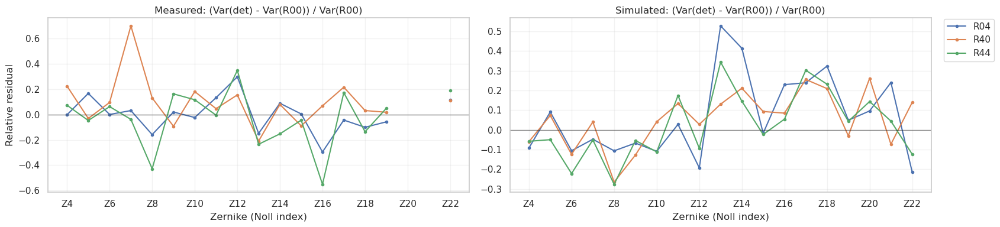

In [48]:
# Sanity check: residuals of variance relative to R00 (measured + simulated)
import numpy as np
import matplotlib.pyplot as plt

if "varcmp_meas_var_by_corner" not in globals() or "varcmp_sim_var_by_corner" not in globals():
    raise NameError("Run the variance comparison plot cell above first (it defines varcmp_* globals).")

z = np.asarray(varcmp_z_full, dtype=int)
dets = list(varcmp_dets)
ref = "R00"
if ref not in dets:
    raise ValueError(f"Reference det {ref} not in dets: {dets}")

meas_ref = np.asarray(varcmp_meas_var_by_corner[ref], dtype=float)
sim_ref = np.asarray(varcmp_sim_var_by_corner[ref], dtype=float)

def _safe_rel(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    m = np.isfinite(a) & np.isfinite(b) & (b != 0)
    out = np.full_like(a, np.nan, dtype=float)
    out[m] = (a[m] - b[m]) / b[m]
    return out

print("[var sanity] Measured variance equality vs R00:")
for det in dets:
    if det == ref:
        continue
    v = np.asarray(varcmp_meas_var_by_corner[det], dtype=float)
    same = np.allclose(v, meas_ref, rtol=0, atol=0, equal_nan=True)
    max_abs = np.nanmax(np.abs(v - meas_ref))
    max_rel = np.nanmax(np.abs(_safe_rel(v, meas_ref)))
    print(f"  {det}: identical={same}  max|Δ|={max_abs:.3e}  max|Δ/Ref|={max_rel:.3e}")

# Plot residuals (relative) so scale is interpretable across Z
fig, axes = plt.subplots(1, 2, figsize=(16, 4), sharex=True)
ax0, ax1 = axes
for det in dets:
    if det == ref:
        continue
    ax0.plot(z, _safe_rel(varcmp_meas_var_by_corner[det], meas_ref), "-o", ms=3, label=det)
    ax1.plot(z, _safe_rel(varcmp_sim_var_by_corner[det], sim_ref), "-o", ms=3)

for ax in (ax0, ax1):
    ax.axhline(0, color="k", lw=1, alpha=0.5)
    ax.set_xticks(z[(z - z.min()) % 2 == 0])
    ax.set_xticklabels([f"Z{int(zz)}" for zz in z[(z - z.min()) % 2 == 0]])
    ax.grid(alpha=0.25)
    ax.set_xlabel("Zernike (Noll index)")

ax0.set_title("Measured: (Var(det) - Var(R00)) / Var(R00)")
ax1.set_title("Simulated: (Var(det) - Var(R00)) / Var(R00)")
ax0.set_ylabel("Relative residual")
fig.legend(loc="upper right", bbox_to_anchor=(1.06, 0.92))
fig.tight_layout()
plt.show()

Notes / interpretation hints:

- If the **measured** coefficients are the same physical quantity (OPD in nm) as the simulated `covM`, the curves should be comparable up to (a) selection effects, (b) detrending choices, and (c) atmospheric/operational differences.
- If the measured coefficients are in **waves**, use `meas_is_waves=True` and set `lambda_meas_nm` to convert to nm; variances then scale as $\lambda^2$.
- Even if the variance scale differs (unit conversion), the **correlation matrix** comparison is much less sensitive because correlation is invariant to a constant per-column scaling.

# Clipped Zernike Correlation Matrix Analysis

This section recomputes the **measured** corner-Zernike correlation matrix $C_{corr,\,meas}$ after **binning by donut blur** (and optionally altitude), so we can compare how the measured correlation structure changes with observing conditions.

Notes:
- We reuse the existing cached coefficient table (`df_corner`) from the Corner Zernike Analysis section (preferably **detrended**).
- We do **not** rebuild a new $C_{new}$ covariance matrix here.
- Blur bins are **non-overlapping**: `blur ≤ 1.0`, `1.0 < blur ≤ 1.25`, `1.25 < blur ≤ 1.5`, `blur > 1.5` (arcsec).
- Optional altitude window uses **strict** bounds: `alt_min < altitude < alt_max` (degrees).

## Helper Methods

In [49]:
# Helpers for clipped Ccorr analysis (donut_blur bins, optional altitude window)
from __future__ import annotations

def _ensure_numeric(df: pd.DataFrame, cols: list[str]) -> None:
    for c in cols:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors="coerce")

def _consdb_query_env_metrics(day_obs: int, seq_min: int, seq_max: int) -> str:
    # Matches the metrics you care about (same semantics as the Cell 6 query).
    return f'''
    SELECT
    e.seq_num AS seq_num,
    e.day_obs AS day_obs,
    e.altitude AS altitude,
    e.dimm_seeing AS dimm_seeing,
    q.aos_fwhm AS aos_fwhm,
    q.donut_blur_fwhm AS donut_blur_fwhm,
    q.wind_speed AS wind_speed
    FROM
    cdb_lsstcam.visit1_quicklook AS q,
    cdb_lsstcam.exposure AS e
    WHERE
    q.visit_id = e.exposure_id
    AND (e.img_type = 'science' or e.img_type = 'acq' or e.img_type = 'engtest')
    AND e.day_obs = {int(day_obs)}
    AND (e.seq_num BETWEEN {int(seq_min)} and {int(seq_max)})
    '''

def _try_merge_env_from_in_memory_tables(df: pd.DataFrame, *, verbose: bool = True) -> pd.DataFrame | None:
    """Try to merge env metrics from tables already queried earlier in the notebook (Cell 6)."""
    candidates = []
    for name in ("cdb_table_all_days", "cdb_table_all_stacked", "cdb_table_all"):
        t = globals().get(name, None)
        if isinstance(t, pd.DataFrame) and len(t) > 0:
            candidates.append((name, t))
    if not candidates:
        return None

    required_any = {"donut_blur_fwhm", "altitude", "dimm_seeing", "aos_fwhm"}
    for name, t in candidates:
        cols = set(t.columns)
        if not (required_any & cols):
            continue
        key_day = "day_obs" if "day_obs" in cols else None
        key_seq = "seq_num" if "seq_num" in cols else ("seq" if "seq" in cols else None)
        if key_day is None or key_seq is None:
            continue
        meta = t.copy()
        if key_seq == "seq":
            meta = meta.rename(columns={"seq": "seq_num"})
        keep = [c for c in ["day_obs", "seq_num", "altitude", "dimm_seeing", "aos_fwhm", "donut_blur_fwhm", "wind_speed"] if c in meta.columns]
        meta = meta[keep].drop_duplicates(subset=["day_obs", "seq_num"], keep="first")
        _ensure_numeric(meta, ["altitude", "dimm_seeing", "aos_fwhm", "donut_blur_fwhm", "wind_speed"])
        before_cols = set(df.columns)
        out = df.merge(meta, on=["day_obs", "seq_num"], how="left", suffixes=("", "_env"))
        added = sorted(list(set(out.columns) - before_cols))
        if verbose:
            print(f"[clip] Using in-memory '{name}' for env metrics. Added columns: {added}")
        return out
    return None

def _merge_env_metrics_from_consdb(
    df: pd.DataFrame,
    *,
    consdb_url: str = "http://consdb-pq.consdb:8080/consdb",
    cdb_client: object | None = None,
    verbose: bool = True,
    ) -> pd.DataFrame:
    """Ensure df has donut_blur_fwhm/altitude/aos_fwhm/dimm_seeing by merging from ConsDB."""
    required = ["donut_blur_fwhm", "altitude", "aos_fwhm", "dimm_seeing"]

    # If previous merges created *_env or *_meta columns, promote them first to avoid re-querying.
    df2 = df.copy()
    for c in required + ["wind_speed"]:
        if c not in df2.columns:
            if f"{c}_env" in df2.columns:
                df2[c] = df2[f"{c}_env"]
            elif f"{c}_meta" in df2.columns:
                df2[c] = df2[f"{c}_meta"]

    missing = [c for c in required if c not in df2.columns]
    if len(missing) == 0:
        return df2
    if ("day_obs" not in df2.columns) or ("seq_num" not in df2.columns):
        raise RuntimeError("df_corner must contain day_obs and seq_num to merge env metrics.")

    # First: try to reuse in-memory ConsDB tables (no network).
    merged = _try_merge_env_from_in_memory_tables(df2, verbose=verbose)
    if merged is not None:
        df2 = merged
        missing = [c for c in required if c not in df2.columns]
        if len(missing) == 0:
            return df2

    # Prefer an already-created client (Cell 6 uses `cdb_client`).
    if cdb_client is None:
        cdb_client = globals().get("cdb_client", None)
    if cdb_client is None:
        try:
            from lsst.summit.utils.consdb import ConsDbClient
        except Exception:
            ConsDbClient = globals().get("ConsDbClient", None)
        if ConsDbClient is None:
            raise RuntimeError("ConsDB client not available: run Cell 6 (creates cdb_client) or import ConsDbClient.")
        cdb_client = ConsDbClient(consdb_url)

    # Query day by day (keeps queries small and avoids huge SQL).
    days = sorted(pd.to_numeric(df2["day_obs"], errors="coerce").dropna().astype(int).unique().tolist())
    meta_frames: list[pd.DataFrame] = []
    for d0 in days:
        sub = df2[pd.to_numeric(df2["day_obs"], errors="coerce").astype("Int64") == int(d0)]
        if len(sub) == 0:
            continue
        seqs = pd.to_numeric(sub["seq_num"], errors="coerce").dropna().astype(int).to_numpy()
        if seqs.size == 0:
            continue
        q = _consdb_query_env_metrics(int(d0), int(seqs.min()), int(seqs.max()))
        try:
            md = cdb_client.query(q).to_pandas()
            meta_frames.append(md)
        except Exception as e:
            if verbose:
                print(f"[clip] ConsDB env-metrics query failed for day={d0}: {e!r}")
    if len(meta_frames) == 0:
        if verbose:
            print("[clip] No ConsDB env-metrics frames collected; returning original df.")
        return df2
    meta = pd.concat(meta_frames, ignore_index=True).drop_duplicates(subset=["day_obs", "seq_num"], keep="first")
    _ensure_numeric(meta, ["altitude", "dimm_seeing", "aos_fwhm", "donut_blur_fwhm", "wind_speed"])
    before_cols = set(df2.columns)
    df2 = df2.merge(meta, on=["day_obs", "seq_num"], how="left", suffixes=("", "_env"))
    added_cols = sorted(list(set(df2.columns) - before_cols))
    if verbose:
        print(f"[clip] Merged env metrics. Added columns: {added_cols}")
    return df2

def _select_corner_columns(dets: list[str], z_list: list[int]) -> list[str]:
    return [f"{d}_Z{int(z)}" for d in dets for z in z_list]

def _compute_corr_from_df(df: pd.DataFrame, cols: list[str]) -> tuple[np.ndarray | None, int]:
    if len(cols) == 0:
        return None, 0
    missing = [c for c in cols if c not in df.columns]
    if missing:
        raise KeyError(f"Missing expected coefficient columns (first few): {missing[:10]}")
    M = df[cols].to_numpy(dtype=float)
    m = np.isfinite(M).all(axis=1)
    M = M[m]
    if M.shape[0] < 3:
        return None, int(M.shape[0])
    return np.corrcoef(M, rowvar=False), int(M.shape[0])

def _plot_corr(
    ax,
    Ccorr: np.ndarray,
    z_list: list[int],
    dets: list[str],
    title: str,
    *,
    show_xticklabels: bool = True,
    show_yticklabels: bool = True,
    show_corner_labels_bottom: bool = True,
    show_corner_labels_left: bool = True,
    ):
    nZ = len(z_list)
    nCorners = len(dets)
    nVars = nZ * nCorners
    im = ax.imshow(Ccorr, cmap="RdBu", vmin=-1, vmax=1)
    ax.set_title(title, fontsize=12, pad=3)
    tick_labels = [f"Z{int(z)}" for _d in dets for z in z_list]
    ax.set_xticks(np.arange(nVars))
    ax.set_yticks(np.arange(nVars))
    # Always set the tick labels, then hide/show via tick_params. This plays nicer with shared axes.
    ax.set_xticklabels(tick_labels, rotation=90, fontsize=8)
    ax.set_yticklabels(tick_labels, fontsize=8)
    ax.tick_params(axis="x", which="both", bottom=True, labelbottom=bool(show_xticklabels))
    ax.tick_params(axis="y", which="both", left=True, labelleft=bool(show_yticklabels))
    ax.grid(False)
    for k in range(1, nCorners):
        cut = k * nZ - 0.5
        ax.axhline(cut, color="k", lw=1.2, alpha=0.7)
        ax.axvline(cut, color="k", lw=1.2, alpha=0.7)
    block_centers = [k * nZ + (nZ - 1) / 2 for k in range(nCorners)]
    for center, d in zip(block_centers, dets):
        if show_corner_labels_bottom:
            ax.text(center, nVars + 6, d, ha="center", va="bottom", fontsize=10, clip_on=False)
        if show_corner_labels_left:
            ax.text(-6, center, d, ha="right", va="center", fontsize=10, clip_on=False)
    return im

## Edit and Compute Measured Ccor

In [50]:
# Compute measured Ccorr for donut_blur bins (environment clipping).
# IMPORTANT: This cell computes correlations for ALL Zernikes present in df_corner (per-corner), not from ts_corner_* selections.

# -----------------------
# USER SETTINGS (edit me)
# -----------------------
blur_bins = [1.0, 1.25, 1.5]  # arcsec bin edges
alt_window = None  # optional: (55, 65) means 55 < altitude < 65 (deg); None disables
consdb_url = "http://consdb-pq.consdb:8080/consdb"

# Optionally force a compute list (otherwise inferred from df_corner columns)
z_list_full_override = None  # e.g. list(range(4, 29))

# Detectors used for corners
dets = list(globals().get("ts_corner_detectors", ["R00", "R40", "R04", "R44"]))
dets = list(dets)
print(f"[full] dets={dets}")

if "df_corner" not in globals():
    raise NameError("df_corner not found. Run the Corner Zernike 'load a table of coefficients' cell first.")
df_corner_use = df_corner.copy()

def _infer_z_list_from_df_corner(df: pd.DataFrame, dets: list[str]) -> list[int]:
    z_sets: list[set[int]] = []
    for det in dets:
        z_for_det: set[int] = set()
        # Accept columns like 'R00_Z4' or 'R00_Z4_something'
        pat = re.compile(rf"^{re.escape(det)}_Z(\d+)(?:\D.*)?$")
        for col in df.columns:
            m = pat.match(str(col))
            if m:
                try:
                    z_for_det.add(int(m.group(1)))
                except Exception:
                    pass
        if not z_for_det:
            raise ValueError(f"No Zernike columns found for detector {det}. Expected columns like '{det}_Z4'.")
        z_sets.append(z_for_det)
        print(f"[full] {det}: found {len(z_for_det)} Zernikes (min={min(z_for_det)}, max={max(z_for_det)})")
    # Keep only Z that exist for ALL corners so matrices are consistent
    z_common = set.intersection(*z_sets)
    return sorted(z_common)

if z_list_full_override is not None:
    z_list_full = sorted({int(z) for z in z_list_full_override})
    z_list_full_source = "z_list_full_override"
else:
    z_list_full = _infer_z_list_from_df_corner(df_corner_use, dets)
    z_list_full_source = "df_corner columns"

print(f"[full] z_list_full={z_list_full}")
print(f"[full] z_list_full_source={z_list_full_source}")
print(f"[full] contains Z19-21? {all(z in set(z_list_full) for z in (19, 20, 21))}")

# Ensure env metrics exist for environment clipping
df_corner_use = _merge_env_metrics_from_consdb(
    df_corner_use,
    consdb_url=consdb_url,
    cdb_client=globals().get("cdb_client", None),
    verbose=True,
    )
_ensure_numeric(df_corner_use, ["donut_blur_fwhm", "altitude", "aos_fwhm", "dimm_seeing", "wind_speed"])

cols_full = _select_corner_columns(dets, z_list_full)

# Build blur bins: <=b0, (b0,b1], (b1,b2], >b2
blur_bins = [float(b) for b in blur_bins]
if len(blur_bins) < 1:
    raise ValueError("blur_bins must contain at least one edge")
if any(np.diff(blur_bins) <= 0):
    raise ValueError("blur_bins must be strictly increasing")

b0 = blur_bins[0]
labels = [f"blur ≤ {b0}"]
intervals = [(None, b0)]
for lo, hi in zip(blur_bins[:-1], blur_bins[1:]):
    labels.append(f"{lo} < blur ≤ {hi}")
    intervals.append((lo, hi))
labels.append(f"blur > {blur_bins[-1]}")
intervals.append((blur_bins[-1], None))

blur_series = df_corner_use["donut_blur_fwhm"].to_numpy(dtype=float)
alt_series = df_corner_use["altitude"].to_numpy(dtype=float)

Ccorr_meas_by_env_full: list[dict[str, object]] = []
Ccorr_meas_by_env_full_dict: dict[str, dict[str, object]] = {}

for label, (lo, hi) in zip(labels, intervals):
    if lo is None:
        m = blur_series <= hi
    elif hi is None:
        m = blur_series > lo
    else:
        m = (blur_series > lo) & (blur_series <= hi)

    if alt_window is not None:
        alt_min, alt_max = alt_window
        m = m & (alt_series > alt_min) & (alt_series < alt_max)

    df_sub = df_corner_use.loc[m].copy()
    Ccorr, nrows = _compute_corr_from_df(df_sub, cols_full)
    entry = {"label": label, "Ccorr": Ccorr, "n_rows": int(nrows), "df": df_sub}
    Ccorr_meas_by_env_full.append(entry)
    Ccorr_meas_by_env_full_dict[label] = entry

    alt_str = "" if alt_window is None else f" and {alt_window[0]}<alt<{alt_window[1]}"
    print(f"[env-clip] {label}{alt_str}: rows_used={nrows}")

# Exports for plotting (Cell 91 will subset Zernikes for display WITHOUT recomputing)
ccorr_dets = dets
ccorr_z_list_full = z_list_full
ccorr_env_labels = labels

# Primary export (ordered list)
Ccorr_meas_by_env_full = Ccorr_meas_by_env_full

# Back-compat exports (older names / dict access)
Ccorr_meas_by_blur = Ccorr_meas_by_env_full_dict

[full] dets=['R00', 'R04', 'R40', 'R44']
[full] R00: found 23 Zernikes (min=4, max=26)
[full] R04: found 23 Zernikes (min=4, max=26)
[full] R40: found 23 Zernikes (min=4, max=26)
[full] R44: found 23 Zernikes (min=4, max=26)
[full] z_list_full=[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26]
[full] z_list_full_source=df_corner columns
[full] contains Z19-21? True
[clip] Using in-memory 'cdb_table_all_days' for env metrics. Added columns: ['altitude_env', 'aos_fwhm', 'dimm_seeing', 'donut_blur_fwhm', 'wind_speed']


[env-clip] blur ≤ 1.0: rows_used=186


[env-clip] 1.0 < blur ≤ 1.25: rows_used=221


[env-clip] 1.25 < blur ≤ 1.5: rows_used=102


[env-clip] blur > 1.5: rows_used=31


## Plot Ccor: Simulated vs Measured 

[plot] dets=['R00', 'R04', 'R40', 'R44']
[plot] z_list_display=[4, 5, 6, 7, 8, 9, 10, 11, 19, 20, 21, 22]
[plot] z_list_full(computed)=[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26]
[plot] Ccorr_sim_use shape=(48, 48)


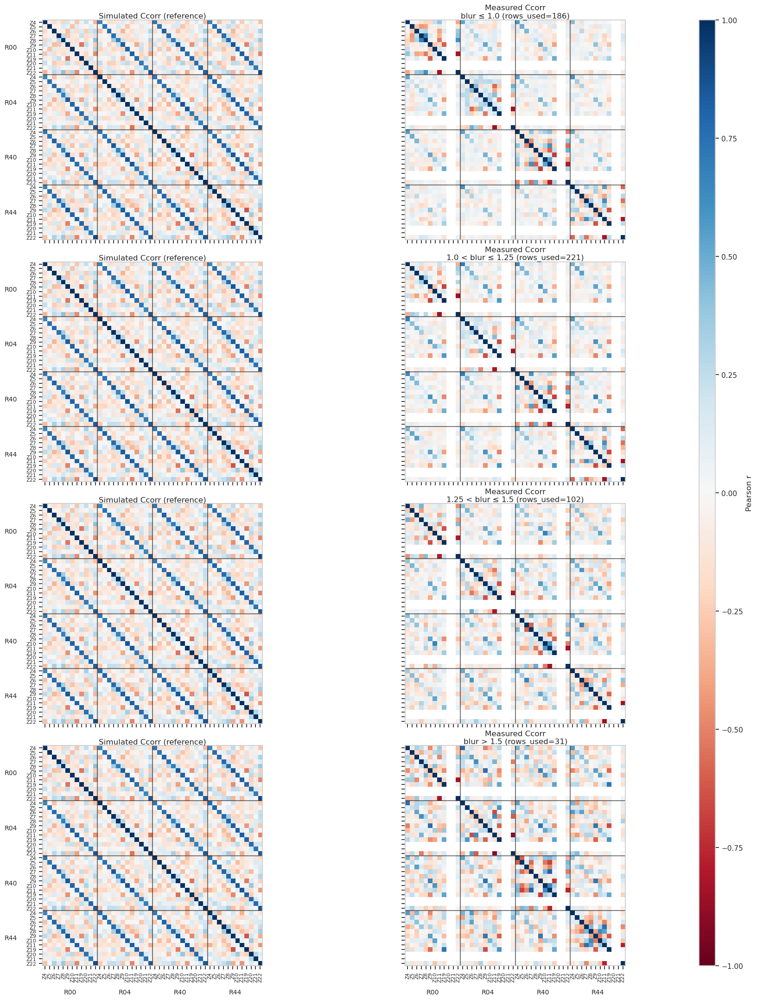

In [51]:
# Plot: measured (environment-clipped) vs simulated Ccorr using a DISPLAY ZERNIKE SUBSET.
# This cell subsets the already-computed measured matrices from Cell 89 (no recompute).

if "Ccorr_meas_by_env_full" not in globals() or "ccorr_z_list_full" not in globals() or "ccorr_dets" not in globals():
    raise NameError("Run Cell 89 first (it computes the full-Z measured correlation matrices).")

# -----------------------
# DISPLAY SUBSET SETTINGS (edit me)
# -----------------------
# If None: display the full Z list computed in Cell 89.
# If a list: display only that subset (must be contained in the full list).
z_list_display = [4, 5, 6, 7, 8, 9, 10, 11, 19, 20, 21, 22] # example subset

# If True, drop Z20/Z21 from display (these were not computed in raw data)
mask_display_zernikes = False
mask_display_list = [20, 21]  # set to None to skip masking

# -----------------------
# Resolve display list
# -----------------------
dets = list(globals()["ccorr_dets"])
z_list_full = list(globals()["ccorr_z_list_full"])
if z_list_display is None:
    z_list = z_list_full
else:
    z_list = sorted({int(z) for z in z_list_display})
    missing = [int(z) for z in z_list if int(z) not in set(map(int, z_list_full))]
    if missing:
        raise ValueError(
            f"z_list_display includes Z not in the full computed list: {missing}. "
            "Cell 89 inferred z_list_full from df_corner columns; if these Z are missing, they are not present in df_corner.",
        )

if mask_display_zernikes and mask_display_list is not None:
    z_list = [int(z) for z in z_list if int(z) not in set(mask_display_list)]

print(f"[plot] dets={dets}")
print(f"[plot] z_list_display={z_list}")
print(f"[plot] z_list_full(computed)={z_list_full}")

# --- Simulated reference for the DISPLAY subset only (not environment-clipped) ---
def _compute_sim_ccorr_for_selection(*, dets: list[str], z_list: list[int]) -> np.ndarray:
    if "mat" not in globals():
        raise NameError("'mat' not found (simulated .mat not loaded).")
    nCorners = len(dets)
    z_full = list(range(4, 22 + 1))
    z_to_idx = {int(z): (int(z) - 4) for z in z_full}
    if not all(int(z) in z_to_idx for z in z_list):
        missing = [int(z) for z in z_list if int(z) not in z_to_idx]
        raise ValueError(f"Simulation only supports Z4..Z22; requested missing: {missing}")
    nZ_full = len(z_full)
    idx: list[int] = []
    for c in range(nCorners):
        base = c * nZ_full
        for z in z_list:
            idx.append(base + z_to_idx[int(z)])
    idx = np.asarray(idx, dtype=int)
    nVars_full = nCorners * nZ_full
    data_key = "corC" if ("corC" in mat) else None
    sim = mat[data_key] if data_key is not None else None
    if sim is None:
        for k, v in mat.items():
            if k.startswith("__") or k == "covM":
                continue
            if isinstance(v, np.ndarray) and v.ndim == 2 and (v.shape[0] == nVars_full or v.shape[1] == nVars_full):
                sim = v
                break
    if sim is None:
        raise NameError("No simulated correlation/covariance matrix found in 'mat'.")
    sim = np.asarray(sim)
    if sim.shape == (nVars_full, nVars_full):
        return np.asarray(sim[np.ix_(idx, idx)], dtype=float)
    if sim.shape[1] == nVars_full:
        M = sim[:, idx]
    elif sim.shape[0] == nVars_full:
        M = sim.T[:, idx]
    else:
        raise ValueError(f"Unexpected sim matrix shape: {sim.shape}")
    m = np.isfinite(M).all(axis=1)
    M = M[m]
    if M.shape[0] < 3:
        raise ValueError("Not enough rows in simulated data to compute correlation.")
    return np.corrcoef(M, rowvar=False)

Ccorr_sim_use = _compute_sim_ccorr_for_selection(dets=dets, z_list=z_list)
print(f"[plot] Ccorr_sim_use shape={Ccorr_sim_use.shape}")

# Build index mapping from (dets x z_list_full) -> (dets x z_list_display) for measured matrices
nCorners = len(dets)
nZ_full = len(z_list_full)
z_to_pos = {int(z): i for i, z in enumerate(z_list_full)}
idx: list[int] = []
for c in range(nCorners):
    base = c * nZ_full
    for z in z_list:
        idx.append(base + z_to_pos[int(z)])
idx = np.asarray(idx, dtype=int)

def _subset_ccorr(C: np.ndarray | None) -> np.ndarray | None:
    if C is None:
        return None
    C = np.asarray(C)
    return C[np.ix_(idx, idx)]

# Support list-based or dict-based storage
Ccorr_meas_by_env_full = globals()["Ccorr_meas_by_env_full"]
if isinstance(Ccorr_meas_by_env_full, dict):
    entries = [dict(label=str(k), **v) for k, v in Ccorr_meas_by_env_full.items()]
else:
    entries = list(Ccorr_meas_by_env_full)

nrows = len(entries)
if nrows == 0:
    raise RuntimeError("No environment-clipped correlation matrices found.")

nVars = len(dets) * len(z_list)
if np.asarray(Ccorr_sim_use).shape != (nVars, nVars):
    raise ValueError(f"Subset simulated Ccorr has shape {np.asarray(Ccorr_sim_use).shape}, expected {(nVars, nVars)}")

fig = plt.figure(figsize=(20, 6 * nrows))
gs = fig.add_gridspec(nrows=nrows, ncols=3, width_ratios=[1, 1, 0.045], wspace=0.02, hspace=0.10)

axes = np.empty((nrows, 2), dtype=object)
ax00 = fig.add_subplot(gs[0, 0])
ax01 = fig.add_subplot(gs[0, 1], sharex=ax00, sharey=ax00)
axes[0, 0] = ax00
axes[0, 1] = ax01
for r in range(1, nrows):
    axes[r, 0] = fig.add_subplot(gs[r, 0], sharex=ax00, sharey=ax00)
    axes[r, 1] = fig.add_subplot(gs[r, 1], sharex=ax00, sharey=ax00)

cax = fig.add_subplot(gs[:, 2])

im_for_cb = None
for r, entry in enumerate(entries):
    Ccorr_meas_full = entry["Ccorr"]
    n_used = int(entry["n_rows"])
    label = entry.get("label", f"bin {r}")
    axL, axR = axes[r, 0], axes[r, 1]
    is_bottom = (r == nrows - 1)

    imL = _plot_corr(
        axL,
        np.asarray(Ccorr_sim_use),
        z_list,
        dets,
        "Simulated Ccorr (reference)",
        show_xticklabels=is_bottom,
        show_yticklabels=True,
        show_corner_labels_bottom=is_bottom,
        show_corner_labels_left=True,
    )
    if im_for_cb is None:
        im_for_cb = imL

    Ccorr_meas_use = _subset_ccorr(Ccorr_meas_full)
    if Ccorr_meas_use is None:
        axR.axis("off")
        axR.set_title(f"Measured Ccorr ({label})\nNot enough rows (rows_used={n_used})", fontsize=12, pad=3)
        continue
    imR = _plot_corr(
        axR,
        np.asarray(Ccorr_meas_use),
        z_list,
        dets,
        f"Measured Ccorr\n{label} (rows_used={n_used})",
        show_xticklabels=is_bottom,
        show_yticklabels=False,
        show_corner_labels_bottom=is_bottom,
        show_corner_labels_left=False,
    )
    im_for_cb = imR

fig.subplots_adjust(left=0.12, right=0.92, bottom=0.12, top=0.97)
if im_for_cb is None:
    raise RuntimeError("No image handle was created for the colorbar.")
cb = fig.colorbar(im_for_cb, cax=cax)
cb.set_label("Pearson r")

plt.show()

## Diagnostic: Pseudo-diagonal corner-to-corner correlations
This section extracts the **block-diagonals** of the 4×4 corner correlation matrix blocks (i.e. same-Zernike correlations across different corners) and compares how they change across blur bins.

We compute this for **measured** (binned) and **simulated** (single reference) and explore three visualization options:
- Option 1: per-bin distributions + variance across Zernikes
- Option 2: heatmaps of median/spread per pair per bin
- Option 3: mode-resolved lines vs Zernike index, with one curve per bin

Notes:
- The big main diagonal of the full matrix is always 1; the diagnostic uses the *block* diagonals (e.g., R00(Zk) vs R40(Zk)).
- Z20/Z21 can be masked from this diagnostic for consistency with earlier plots.

In [52]:
# Extract pseudo-diagonals (block diagonals) for all corner pairs and bins.
# This cell prepares data structures used by the plotting options below.

from itertools import combinations

# -----------------------
# SETTINGS (edit me)
# -----------------------
# Which pairs to analyze:
# - "all": all 6 unique pairs among 4 corners
# - "R00": only pairs involving R00 (assumes 'R00' exists in dets)
pairs_mode = "all"

# Zernikes to include in this diagnostic (None -> auto).
# If you want to match the display subset in the previous plot cell, leave as None and it will reuse 'z_list' if present.
z_list_diag = None

# Mask Zernikes in this diagnostic
mask_diag_zernikes = True
mask_diag_list = [20, 21]  # set to None to skip masking

# For measured-vs-sim comparisons we restrict to sim-supported Z range by default.
restrict_to_sim_supported = True  # sim supports Z4..Z22 in this notebook
sim_z_min, sim_z_max = 4, 22

# -----------------------
# Preconditions
# -----------------------
if "Ccorr_meas_by_env_full" not in globals():
    raise NameError("Run the measured correlation computation cell first (Cell 89).")

# Corner labels
if "ccorr_dets" in globals():
    dets = list(globals()["ccorr_dets"])
elif "dets" in globals():
    dets = list(globals()["dets"])
else:
    raise NameError("Corner list not found (expected 'ccorr_dets' from Cell 89 or 'dets' from the plot cell).")

nCorners = len(dets)
if nCorners != 4:
    raise ValueError(f"Expected 4 corners (R00/R40/R04/R44). Got dets={dets}")

# Full measured Z list (inferred in Cell 89)
if "ccorr_z_list_full" not in globals():
    raise NameError("'ccorr_z_list_full' not found. Run Cell 89 first (it infers the full Z list from df_corner columns).")
z_list_full = list(map(int, globals()["ccorr_z_list_full"]))

# Measured matrices (list or dict)
Ccorr_meas_by_env_full = globals()["Ccorr_meas_by_env_full"]
if isinstance(Ccorr_meas_by_env_full, dict):
    entries = [dict(label=str(k), **v) for k, v in Ccorr_meas_by_env_full.items()]
else:
    entries = list(Ccorr_meas_by_env_full)

if len(entries) == 0:
    raise RuntimeError("No environment-clipped entries found in 'Ccorr_meas_by_env_full'.")

# Find first non-empty measured Ccorr to validate dimensions
C0 = None
for e in entries:
    Ccand = e.get("Ccorr", None)
    if Ccand is None:
        continue
    Ccand = np.asarray(Ccand)
    if Ccand.ndim == 2 and Ccand.shape[0] == Ccand.shape[1]:
        C0 = Ccand
        break
if C0 is None:
    raise RuntimeError("All measured entries have Ccorr=None (not enough rows in every bin?).")

nVars0 = int(C0.shape[0])
if nVars0 % nCorners != 0:
    raise ValueError(f"Measured Ccorr size {C0.shape} is not divisible by nCorners={nCorners}.")
nZ_meas_full = nVars0 // nCorners
if nZ_meas_full != len(z_list_full):
    raise ValueError(
        f"Mismatch: inferred nZ_meas_full={nZ_meas_full} from Ccorr shape, but len(ccorr_z_list_full)={len(z_list_full)}"
    )

# -----------------------
# Choose Z list for diagnostic
# -----------------------
if z_list_diag is None:
    # Prefer reusing z_list from the plot cell if it exists (keeps visuals consistent with what you just plotted).
    if "z_list" in globals():
        z_list_use = list(map(int, globals()["z_list"]))
    else:
        z_list_use = list(z_list_full)
else:
    z_list_use = sorted({int(z) for z in z_list_diag})

# Keep only Z that exist in measured full list
z_set_full = set(map(int, z_list_full))
z_list_use = [int(z) for z in z_list_use if int(z) in z_set_full]

if restrict_to_sim_supported:
    z_list_use = [int(z) for z in z_list_use if sim_z_min <= int(z) <= sim_z_max]

if mask_diag_zernikes and mask_diag_list is not None:
    z_list_use = [int(z) for z in z_list_use if int(z) not in set(map(int, mask_diag_list))]

if len(z_list_use) < 2:
    raise ValueError(f"z_list_use too small after filtering: {z_list_use}")

print(f"[pseudo-diag] dets={dets}")
print(f"[pseudo-diag] z_list_use (n={len(z_list_use)}): {z_list_use}")

# Indices to subset measured full matrices to z_list_use
z_to_pos_full = {int(z): i for i, z in enumerate(z_list_full)}
idx: list[int] = []
for c in range(nCorners):
    base = c * nZ_meas_full
    for z in z_list_use:
        idx.append(base + z_to_pos_full[int(z)])
idx = np.asarray(idx, dtype=int)
nZ = len(z_list_use)

def _subset_meas(C: np.ndarray | None) -> np.ndarray | None:
    if C is None:
        return None
    C = np.asarray(C, dtype=float)
    return C[np.ix_(idx, idx)]

def _extract_block_diag_vectors(C: np.ndarray, *, dets: list[str], z_list: list[int]) -> dict[tuple[str, str], np.ndarray]:
    """Return dict mapping (corner_i, corner_j) -> diag(block_ij) over Z."""
    C = np.asarray(C, dtype=float)
    nCorners = len(dets)
    nZ = len(z_list)
    out: dict[tuple[str, str], np.ndarray] = {}
    for i in range(nCorners):
        for j in range(nCorners):
            if i == j:
                continue
            bi = slice(i * nZ, (i + 1) * nZ)
            bj = slice(j * nZ, (j + 1) * nZ)
            out[(dets[i], dets[j])] = np.diag(C[bi, bj])
    return out

# Compute simulated pseudo-diagonals for z_list_use
def _compute_sim_ccorr_for_selection_local(*, dets: list[str], z_list: list[int]) -> np.ndarray:
    if "_compute_sim_ccorr_for_selection" in globals():
        return globals()["_compute_sim_ccorr_for_selection"](dets=dets, z_list=z_list)
    # Fallback: same logic as the plot cell (sim supports Z4..Z22)
    if "mat" not in globals():
        raise NameError("'mat' not found (simulated .mat not loaded).")
    z_full = list(range(4, 22 + 1))
    z_to_idx = {int(z): (int(z) - 4) for z in z_full}
    missing = [int(z) for z in z_list if int(z) not in z_to_idx]
    if missing:
        raise ValueError(f"Simulation only supports Z4..Z22; requested missing: {missing}")
    nCorners = len(dets)
    nZ_full = len(z_full)
    idx_sim: list[int] = []
    for c in range(nCorners):
        base = c * nZ_full
        for z in z_list:
            idx_sim.append(base + z_to_idx[int(z)])
    idx_sim = np.asarray(idx_sim, dtype=int)
    nVars_full = nCorners * nZ_full
    data_key = "corC" if ("corC" in mat) else None
    sim = mat[data_key] if data_key is not None else None
    if sim is None:
        for k, v in mat.items():
            if k.startswith("__") or k == "covM":
                continue
            if isinstance(v, np.ndarray) and v.ndim == 2 and (v.shape[0] == nVars_full or v.shape[1] == nVars_full):
                sim = v
                break
    if sim is None:
        raise NameError("No simulated correlation/covariance matrix found in 'mat'.")
    sim = np.asarray(sim)
    if sim.shape == (nVars_full, nVars_full):
        return np.asarray(sim[np.ix_(idx_sim, idx_sim)], dtype=float)
    if sim.shape[1] == nVars_full:
        M = sim[:, idx_sim]
    elif sim.shape[0] == nVars_full:
        M = sim.T[:, idx_sim]
    else:
        raise ValueError(f"Unexpected sim matrix shape: {sim.shape}")
    m = np.isfinite(M).all(axis=1)
    M = M[m]
    if M.shape[0] < 3:
        raise ValueError("Not enough rows in simulated data to compute correlation.")
    return np.corrcoef(M, rowvar=False)

Ccorr_sim_diag = _compute_sim_ccorr_for_selection_local(dets=dets, z_list=z_list_use)
pseudo_sim = _extract_block_diag_vectors(Ccorr_sim_diag, dets=dets, z_list=z_list_use)

# Measured pseudo-diagonals per bin (subset to z_list_use)
pseudo_meas_by_bin: dict[str, dict[tuple[str, str], np.ndarray] | None] = {}
n_used_by_bin: dict[str, int] = {}
for r, e in enumerate(entries):
    label = str(e.get("label", f"bin {r}"))
    n_used = int(e.get("n_rows", -1))
    n_used_by_bin[label] = n_used
    Cfull = e.get("Ccorr", None)
    Cuse = _subset_meas(Cfull)
    if Cuse is None:
        pseudo_meas_by_bin[label] = None
        continue
    pseudo_meas_by_bin[label] = _extract_block_diag_vectors(Cuse, dets=dets, z_list=z_list_use)

# Select pairs to show
all_pairs = [(dets[i], dets[j]) for i, j in combinations(range(nCorners), 2)]
if pairs_mode.lower() == "all":
    pairs_to_show = all_pairs
elif pairs_mode.lower() == "r00":
    if "R00" not in dets:
        raise ValueError(f"pairs_mode='R00' requested but 'R00' not in dets={dets}")
    pairs_to_show = [("R00", d) for d in dets if d != "R00"]
else:
    raise ValueError(f"Unknown pairs_mode={pairs_mode!r}")

print(f"[pseudo-diag] pairs_to_show ({len(pairs_to_show)}): {pairs_to_show}")

# Symmetry sanity check: for each bin and each pair, compare (A,B) vs (B,A)
def _nanmax_abs(x: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    if x.size == 0:
        return float("nan")
    return float(np.nanmax(np.abs(x)))

symmetry_report = []
for label, pdict in pseudo_meas_by_bin.items():
    if pdict is None:
        symmetry_report.append((label, n_used_by_bin.get(label, -1), np.nan))
        continue
    diffs = []
    for (a, b) in all_pairs:
        v_ab = pdict[(a, b)]
        v_ba = pdict[(b, a)]
        d = v_ab - v_ba
        diffs.append(_nanmax_abs(d))
    symmetry_report.append((label, n_used_by_bin.get(label, -1), float(np.nanmax(diffs))))

symmetry_df = pd.DataFrame(symmetry_report, columns=["bin", "rows_used", "max|diag(A,B)-diag(B,A)|"])
print("\n[pseudo-diag] Symmetry check (measured):")
display(symmetry_df)

# Export for downstream plotting cells
pseudo_diag_z_list = list(z_list_use)
pseudo_diag_pairs = list(pairs_to_show)
pseudo_diag_all_pairs = list(all_pairs)
pseudo_diag_meas_by_bin = pseudo_meas_by_bin
pseudo_diag_sim = pseudo_sim
pseudo_diag_rows_used = n_used_by_bin
pseudo_diag_symmetry_df = symmetry_df

[pseudo-diag] dets=['R00', 'R04', 'R40', 'R44']
[pseudo-diag] z_list_use (n=10): [4, 5, 6, 7, 8, 9, 10, 11, 19, 22]
[pseudo-diag] pairs_to_show (6): [('R00', 'R04'), ('R00', 'R40'), ('R00', 'R44'), ('R04', 'R40'), ('R04', 'R44'), ('R40', 'R44')]

[pseudo-diag] Symmetry check (measured):


,bin,rows_used,"max|diag(A,B)-diag(B,A)|"
0,blur ≤ 1.0,186,1.110223e-16
1,1.0 < blur ≤ 1.25,221,1.110223e-16
2,1.25 < blur ≤ 1.5,102,1.110223e-16
3,blur > 1.5,31,1.110223e-16


### Option 3 — Mode-resolved lines vs Zernike index
This is the most detailed diagnostic: for each corner-pair we plot $r(Z_k)$ as a function of Zernike index, with one curve per blur bin (measured) and a dashed reference curve for simulation.

This makes it easy to see whether the decorrelation with worse blur is concentrated in specific modes (e.g., higher orders) or is roughly uniform.

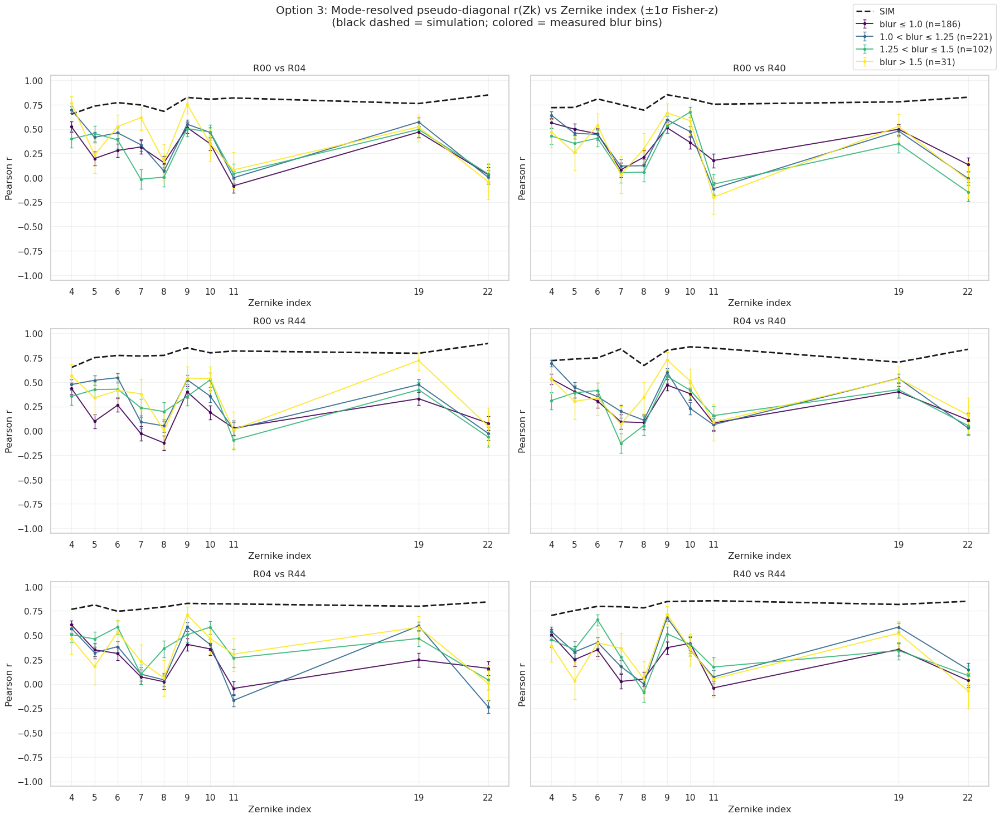

In [53]:
# Option 3 plots: r(Zk) vs Zernike index, one line per bin + simulated reference
# Adds per-point uncertainty as r ± 1σ using the Fisher z-transform approximation (σ_z = 1/sqrt(n-3)).

import numpy as np
import matplotlib.pyplot as plt

required = [
    "pseudo_diag_meas_by_bin",
    "pseudo_diag_sim",
    "pseudo_diag_pairs",
    "pseudo_diag_z_list",
    "pseudo_diag_rows_used",
]
missing = [k for k in required if k not in globals()]
if missing:
    raise NameError(f"Run the extraction cell above first. Missing: {missing}")

z_list = np.asarray(globals()["pseudo_diag_z_list"], dtype=int)
pairs = list(globals()["pseudo_diag_pairs"])
meas_by_bin = globals()["pseudo_diag_meas_by_bin"]
sim = globals()["pseudo_diag_sim"]
rows_used = globals()["pseudo_diag_rows_used"]

bin_labels = list(meas_by_bin.keys())
nBins = len(bin_labels)

cmap = plt.get_cmap("viridis")
colors = [cmap(i / max(1, nBins - 1)) for i in range(nBins)]

nPairs = len(pairs)
ncols = 2 if nPairs > 1 else 1
nrows = int(np.ceil(nPairs / ncols))

rot = 0 if len(z_list) <= 12 else 45
xticklabels = [str(int(z)) for z in z_list]

# Controls
show_errorbars = True
nsig = 1.0  # 1σ (68%)

def _fisher_1sigma_yerr(r: np.ndarray, n: int, nsig: float = 1.0):
    """Return asymmetric yerr arrays (lower, upper) for r using Fisher z approx."""
    r = np.asarray(r, dtype=float)
    if n is None or int(n) <= 3:
        return None
    n = int(n)
    # Avoid infinities in arctanh
    r_clip = np.clip(r, -0.999999, 0.999999)
    z = np.arctanh(r_clip)
    se_z = 1.0 / np.sqrt(n - 3)
    z_lo = z - nsig * se_z
    z_hi = z + nsig * se_z
    r_lo = np.tanh(z_lo)
    r_hi = np.tanh(z_hi)
    yerr_lo = r_clip - r_lo
    yerr_hi = r_hi - r_clip
    # Keep NaNs where r was NaN
    yerr_lo[~np.isfinite(r)] = np.nan
    yerr_hi[~np.isfinite(r)] = np.nan
    return np.vstack([yerr_lo, yerr_hi])

# ----------------------
# Figure: mode-resolved lines per bin (with errorbars)
# ----------------------
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4.8 * nrows), squeeze=False, sharex=True, sharey=True)
axes = axes.ravel()

for pi, (a, b) in enumerate(pairs):
    ax = axes[pi]

    # Sim reference curve
    v_sim = np.asarray(sim[(a, b)], dtype=float)
    ax.plot(z_list, v_sim, color="k", linestyle="--", linewidth=2.0, label="SIM")

    # Measured bin curves (with optional errorbars)
    for bi, lbl in enumerate(bin_labels):
        pdict = meas_by_bin[lbl]
        if pdict is None:
            continue
        v = np.asarray(pdict[(a, b)], dtype=float)
        n = int(rows_used.get(lbl, -1))
        yerr = _fisher_1sigma_yerr(v, n=n, nsig=nsig) if show_errorbars else None

        ax.errorbar(
            z_list,
            v,
            yerr=yerr,
            color=colors[bi],
            alpha=0.9,
            linewidth=1.4,
            elinewidth=1.0,
            capsize=2,
            marker="o",
            markersize=3,
            label=f"{lbl} (n={n})" if pi == 0 else None,
        )

    ax.set_title(f"{a} vs {b}")
    ax.set_ylim(-1.05, 1.05)
    ax.grid(alpha=0.25)
    ax.set_ylabel("Pearson r")
    ax.set_xlabel("Zernike index")

    # Force all Zernike ticks/labels (integers) to be shown
    ax.set_xticks(z_list)
    ax.set_xticklabels(xticklabels, rotation=rot, ha="right" if rot else "center")
    ax.tick_params(axis="x", labelbottom=True)

# Hide any unused axes
for j in range(nPairs, len(axes)):
    axes[j].axis("off")

# Legend once (top figure)
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right", frameon=True)
suffix = f" (±{nsig:g}σ Fisher-z)" if (show_errorbars and nsig is not None) else ""
fig.suptitle(
    "Option 3: Mode-resolved pseudo-diagonal r(Zk) vs Zernike index" + suffix +
    "\n(black dashed = simulation; colored = measured blur bins)",
    y=1.02,
)
fig.tight_layout()
plt.show()

# SimCov corner-order sensitivity: wrong packing vs canonical
Run this after the canonicalization + 3-pass state-estimation cells.

In [54]:
# SimCov packing assumption comparison (historical vs canonical) + MeasuredCov reference
#
# We run state estimation three ways (same sequence set), in the same spirit as Cells 80–82:
#   Case A) SimCov: assume `mat['covM']` corner blocks are packed in the historical order (CORNERS_RAW).
#   Case B) SimCov: assume `mat['covM']` corner blocks are packed in the canonical ts_ofc order (CORNERS).
#   Case C) MeasuredCov: use measured covariance `C_new` (already canonicalized to CORNERS order).
#
# All cases produce DOF states in the same (use_dof) basis; we then plot distributions.

import numpy as np
import traceback
from tqdm import tqdm

# ------------------ Preconditions ------------------
needed = [
    "mat",
    "get_state",
    "use_dof",
    "nkeep",
    "corner_detnames",
    "CORNERS",
    "CORNERS_RAW",
    "simcomp_seqs",
    "zk_by_seq",
    "meta_by_seq",
    "C_new",
]
missing = [k for k in needed if k not in globals()]
if missing:
    raise NameError(
        "Missing prerequisites. Run Cell 80 (three-pass state estimation), the canonicalization cell, and build C_new. Missing: "
        + ", ".join(missing)
    )

if "z_target" in globals():
    z_target_local = list(map(int, z_target))
elif "Z_TARGET" in globals():
    z_target_local = list(map(int, Z_TARGET))
else:
    z_target_local = list(range(4, 28 + 1))

nZ_target = int(len(z_target_local))

C_meas_ordered = np.asarray(C_new, dtype=float)

# ------------------ Build simulated cov under two packing assumptions ------------------

def _build_sim_covariance_assuming_corner_order(*, z_target: list[int], corner_order_sim_assumed: list[str]) -> np.ndarray:
    """Build C_sim in canonical CORNERS order, assuming raw covM blocks follow corner_order_sim_assumed."""
    if "covM" not in mat:
        raise KeyError("covM not found in mat")

    corner_order_target = list(CORNERS)
    if set(corner_order_sim_assumed) != set(corner_order_target):
        raise ValueError(
            f"corner_order_sim_assumed={corner_order_sim_assumed} must contain the same corners as CORNERS={corner_order_target}"
        )

    # Raw simulated covM: 4 corners x (Z4..Z22)
    z_full_sim = list(range(4, 22 + 1))
    nZ_sim = len(z_full_sim)
    nCorners = len(corner_order_target)
    nVars_sim = nCorners * nZ_sim

    C_sim_raw = np.asarray(mat["covM"], dtype=float)
    if C_sim_raw.shape != (nVars_sim, nVars_sim):
        raise ValueError(f"covM shape {C_sim_raw.shape} does not match expected {(nVars_sim, nVars_sim)}")

    # Convert nm^2 -> um^2
    C_sim_raw = C_sim_raw / 1e6

    # Permutation mapping from assumed sim packing -> canonical target corner order
    corner_perm_sim_for_target = [corner_order_sim_assumed.index(lbl) for lbl in corner_order_target]

    z_target = [int(z) for z in z_target]
    nZ_tgt = len(z_target)
    nVars_tgt = nCorners * nZ_tgt

    z_to_idx_sim = {int(z): (int(z) - 4) for z in z_full_sim}
    sim_idx_for_target = np.full(nVars_tgt, -1, dtype=int)

    for c_tgt in range(nCorners):
        c_sim = corner_perm_sim_for_target[c_tgt]
        for i, z in enumerate(z_target):
            t = c_tgt * nZ_tgt + i
            if z in z_to_idx_sim:
                sim_idx_for_target[t] = c_sim * nZ_sim + z_to_idx_sim[z]

    C_out = np.zeros((nVars_tgt, nVars_tgt), dtype=float)
    present = sim_idx_for_target >= 0
    t_pos = np.where(present)[0]
    s_pos = sim_idx_for_target[present]
    C_out[np.ix_(t_pos, t_pos)] = C_sim_raw[np.ix_(s_pos, s_pos)]

    # Inject missing Zernikes: diagonal=1, off-diagonal=0
    missing = np.where(~present)[0]
    C_out[missing, missing] = 1.0

    # Treat "raw-zeroed" modes like missing if the entire row/col is ~0.
    abs_row_sum = np.sum(np.abs(C_out), axis=1)
    zeroed = np.where(abs_row_sum <= 1e-15)[0]
    if zeroed.size:
        C_out[zeroed, :] = 0.0
        C_out[:, zeroed] = 0.0
        C_out[zeroed, zeroed] = 1.0

    return C_out


simpack_sim_corner_order_hist = list(CORNERS_RAW)
simpack_sim_corner_order_canon = list(CORNERS)
simpack_meas_corner_order = list(CORNERS)

C_sim_assume_hist = _build_sim_covariance_assuming_corner_order(
    z_target=z_target_local,
    corner_order_sim_assumed=simpack_sim_corner_order_hist,
)
C_sim_assume_canon = _build_sim_covariance_assuming_corner_order(
    z_target=z_target_local,
    corner_order_sim_assumed=simpack_sim_corner_order_canon,
)

print(f"[sim-pack] z_target: Z{z_target_local[0]}..Z{z_target_local[-1]} (nZ={nZ_target})")
print(f"[sim-pack] sim covM assumed corner order (hist):  {simpack_sim_corner_order_hist}")
print(f"[sim-pack] sim covM assumed corner order (canon): {simpack_sim_corner_order_canon}")
print(f"[sim-pack] measured covariance corner order:      {simpack_meas_corner_order}")
print(f"[sim-pack] corner_detnames (estimator row order): {list(corner_detnames)}")
print(f"[sim-pack] C_sim_assume_hist shape:  {C_sim_assume_hist.shape}")
print(f"[sim-pack] C_sim_assume_canon shape: {C_sim_assume_canon.shape}")
print(f"[sim-pack] C_meas_ordered shape:     {C_meas_ordered.shape}")

# ------------------ State estimation loop (three passes, aligned seqs) ------------------
seqs = list(map(int, np.asarray(simcomp_seqs).ravel()))

states_hist = []
states_canon = []
states_meas = []
seqs_ok = []
failures = []

for seq in tqdm(seqs, desc="SimCov pack compare (+meas)"):
    try:
        zk = np.asarray(zk_by_seq[int(seq)], dtype=float)
        meta = meta_by_seq[int(seq)]

        st_hist = get_state(
            zk,
            rtp=float(meta["rtp"]),
            use_dof=use_dof,
            nkeep=nkeep,
            band=str(meta["band"]),
            noise_covariance=C_sim_assume_hist,
        )
        st_canon = get_state(
            zk,
            rtp=float(meta["rtp"]),
            use_dof=use_dof,
            nkeep=nkeep,
            band=str(meta["band"]),
            noise_covariance=C_sim_assume_canon,
        )
        st_meas = get_state(
            zk,
            rtp=float(meta["rtp"]),
            use_dof=use_dof,
            nkeep=nkeep,
            band=str(meta["band"]),
            noise_covariance=C_meas_ordered,
        )

        states_hist.append(-np.asarray(st_hist, dtype=float))
        states_canon.append(-np.asarray(st_canon, dtype=float))
        states_meas.append(-np.asarray(st_meas, dtype=float))
        seqs_ok.append(int(seq))
    except Exception:
        failures.append({"seq": int(seq), "traceback": traceback.format_exc()})

if not states_hist:
    raise RuntimeError("No successful state estimates in pack-comparison loop.")

simpack_states_hist_array = np.vstack(states_hist)
simpack_states_canon_array = np.vstack(states_canon)
simpack_states_meas_array = np.vstack(states_meas)
simpack_seqs = np.asarray(seqs_ok, dtype=int)

print(
    "[export] simpack arrays shapes: "
    f"hist={simpack_states_hist_array.shape}, "
    f"canon={simpack_states_canon_array.shape}, "
    f"meas={simpack_states_meas_array.shape}"
)

if failures:
    print(f"WARNING: {len(failures)} sequences failed (showing up to 3)")
    for f in failures[:3]:
        print(f"  seq={f['seq']}: {f['traceback'].splitlines()[-1]}")


[sim-pack] z_target: Z4..Z28 (nZ=25)
[sim-pack] sim covM assumed corner order (hist):  ['R00', 'R40', 'R04', 'R44']
[sim-pack] sim covM assumed corner order (canon): ['R00', 'R04', 'R40', 'R44']
[sim-pack] measured covariance corner order:      ['R00', 'R04', 'R40', 'R44']
[sim-pack] corner_detnames (estimator row order): ['R00_SW0', 'R04_SW0', 'R40_SW0', 'R44_SW0']
[sim-pack] C_sim_assume_hist shape:  (100, 100)
[sim-pack] C_sim_assume_canon shape: (100, 100)
[sim-pack] C_meas_ordered shape:     (100, 100)


SimCov pack compare (+meas): 100%|██████████| 40/40 [09:51<00:00, 14.79s/it]

[export] simpack arrays shapes: hist=(40, 22), canon=(40, 22), meas=(40, 22)



=== SimCov pack compare summary (with MeasuredCov + Cov=False reference) ===
n_samples=40, n_dof=22
SimCov (covM corner order assumed = ['R00', 'R40', 'R04', 'R44'])
SimCov (covM corner order assumed = ['R00', 'R04', 'R40', 'R44'])
MeasuredCov (C_new; corners = ['R00', 'R04', 'R40', 'R44'])
Cov=False (no noise_covariance)
max|hist - canon| over all samples/DOFs = 1.442097e+02
median(|hist - canon|) = 7.866162e-02


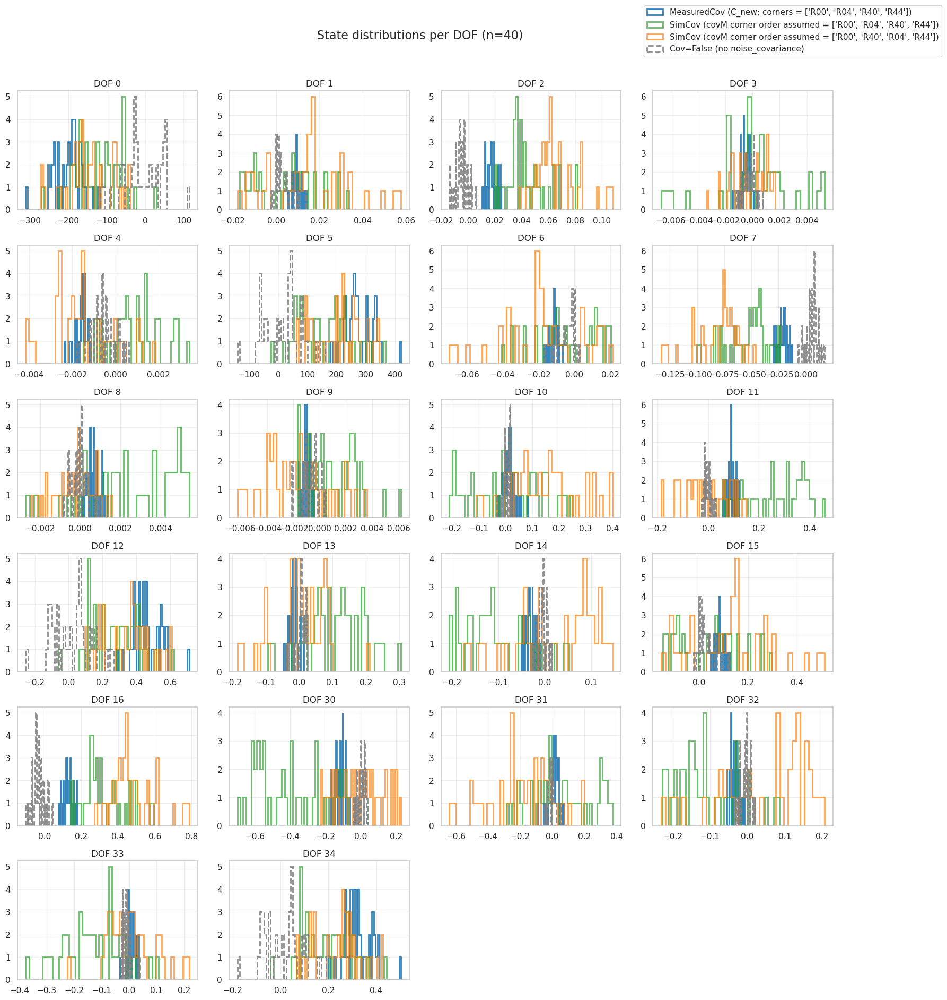

In [55]:
# Plot: per-DOF state distributions for SimCov under two packing assumptions + MeasuredCov reference + Cov=False

needed = [
    "simpack_states_hist_array",
    "simpack_states_canon_array",
    "simpack_states_meas_array",
    "simcomp_states_covfalse_array",
    "simcomp_use_dof",
    "simpack_sim_corner_order_hist",
    "simpack_sim_corner_order_canon",
    "simpack_meas_corner_order",
]
missing = [k for k in needed if k not in globals()]
if missing:
    raise NameError(
        "Missing prerequisites. Run Cell 80 (three-pass state estimation) and the SimCov pack-comparison compute cell first. Missing: "
        + ", ".join(missing)
    )

hist = np.asarray(simpack_states_hist_array, dtype=float)
canon = np.asarray(simpack_states_canon_array, dtype=float)
meas = np.asarray(simpack_states_meas_array, dtype=float)
covfalse = np.asarray(simcomp_states_covfalse_array, dtype=float)
use_dof_list = list(np.asarray(simcomp_use_dof, dtype=int))

label_hist = f"SimCov (covM corner order assumed = {list(simpack_sim_corner_order_hist)})"
label_canon = f"SimCov (covM corner order assumed = {list(simpack_sim_corner_order_canon)})"
label_meas = f"MeasuredCov (C_new; corners = {list(simpack_meas_corner_order)})"
label_covfalse = "Cov=False (no noise_covariance)"

n_dof = len(use_dof_list)
for name, arr in [("hist", hist), ("canon", canon), ("meas", meas), ("covfalse", covfalse)]:
    if arr.ndim != 2:
        raise ValueError(f"{name}: expected 2D array; got shape={arr.shape}")
    if arr.shape[1] != n_dof:
        raise ValueError(f"{name}: expected n_dof={n_dof}; got {arr.shape[1]}")

n_use = int(min(hist.shape[0], canon.shape[0], meas.shape[0], covfalse.shape[0]))
if n_use < 3:
    raise ValueError(f"Not enough samples to compare distributions: n_use={n_use}")
if (
    hist.shape[0] != n_use
    or canon.shape[0] != n_use
    or meas.shape[0] != n_use
    or covfalse.shape[0] != n_use
):
    print(f"[plot] NOTE: sample counts differ; truncating to n={n_use} for fair comparison")
    hist = hist[:n_use, :]
    canon = canon[:n_use, :]
    meas = meas[:n_use, :]
    covfalse = covfalse[:n_use, :]

# Quick summary of sensitivity (SimCov hist vs SimCov canon)
delta = hist - canon
print("\n=== SimCov pack compare summary (with MeasuredCov + Cov=False reference) ===")
print(f"n_samples={n_use}, n_dof={n_dof}")
print(f"{label_hist}")
print(f"{label_canon}")
print(f"{label_meas}")
print(f"{label_covfalse}")
print(f"max|hist - canon| over all samples/DOFs = {float(np.max(np.abs(delta))):.6e}")
print(f"median(|hist - canon|) = {float(np.median(np.abs(delta))):.6e}")

ncols = 4
nrows = int(np.ceil(n_dof / ncols))
bins = 40

fig, axes = plt.subplots(
    nrows,
    ncols,
    figsize=(4 * ncols, 3 * nrows),
    sharex=False,
    sharey=False,
)
axes = np.asarray(axes).ravel()


def _finite_1d(x: np.ndarray) -> np.ndarray:
    x = np.asarray(x, dtype=float).ravel()
    return x[np.isfinite(x)]


for idx, dof_id in enumerate(use_dof_list):
    ax = axes[idx]

    x_hist = _finite_1d(hist[:, idx])
    x_canon = _finite_1d(canon[:, idx])
    x_meas = _finite_1d(meas[:, idx])
    x_no = _finite_1d(covfalse[:, idx])

    if x_meas.size:
        ax.hist(
            x_meas,
            bins=bins,
            histtype="step",
            linewidth=2,
            label=label_meas if idx == 0 else None,
            alpha=0.9,
            color="tab:blue",
        )
    if x_canon.size:
        ax.hist(
            x_canon,
            bins=bins,
            histtype="step",
            linewidth=2,
            label=label_canon if idx == 0 else None,
            alpha=0.7,
            color="tab:green",
        )
    if x_hist.size:
        ax.hist(
            x_hist,
            bins=bins,
            histtype="step",
            linewidth=2,
            label=label_hist if idx == 0 else None,
            alpha=0.7,
            color="tab:orange",
        )
    if x_no.size:
        ax.hist(
            x_no,
            bins=bins,
            histtype="step",
            linewidth=2,
            label=label_covfalse if idx == 0 else None,
            linestyle="--",
            alpha=0.9,
            color="gray",
        )

    ax.set_title(f"DOF {dof_id}")
    ax.grid(alpha=0.3)

# Turn off unused axes if DOFs < grid slots
for ax in axes[n_dof:]:
    ax.axis("off")

fig.suptitle(
    f"State distributions per DOF (n={n_use})",
    fontsize=16,
    y=1.02,
)
fig.tight_layout()

# Legend: collect handles/labels and keep unique
handles_all, labels_all = [], []
for ax in axes[:n_dof]:
    h, l = ax.get_legend_handles_labels()
    for hh, ll in zip(h, l):
        if ll and (ll not in labels_all):
            handles_all.append(hh)
            labels_all.append(ll)
if handles_all:
    fig.legend(handles_all, labels_all, loc="upper right", bbox_to_anchor=(1.12, 1.05), frameon=True)

plt.show()


# DOFs Corner Plots

##  Per-DOF state distributions (packing + covariance choice)

This figure is a grid of scatters, one panel per selected DOF.

- **What is being compared**: the *estimated* DOF state samples from the same sequence set, under different noise-covariance assumptions:
  - **MeasuredCov**: uses the measured covariance `C_new` (canonical corner order).
  - **SimCov (canon)**: uses `mat['covM']`, assuming it is packed in canonical corner order.
  - **SimCov (hist)**: uses `mat['covM']`, assuming it is packed in the historical corner order.
  - **Cov=False**: no noise covariance passed to the estimator.
- **How to read it**:
  - If the curves mostly overlap for a DOF, that DOF’s state estimate is *insensitive* to the covariance choice / packing assumption.
  - Differences in **width** indicate changes in inferred uncertainty / regularization strength; differences in **mean/shift** indicate bias.

---

### 1 - Replacing the diagonal with baseline comparison

[corner-overlay] n=40, dims=10, DOFs=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
[corner-overlay] diag_mode: scatter
[corner-overlay] methods:
  - Cov=False
  - MeasuredCov
  - SimCov (detname order: ['R00', 'R40', 'R04', 'R44'])
  - SimCov (detname order: ['R00', 'R04', 'R40', 'R44'])


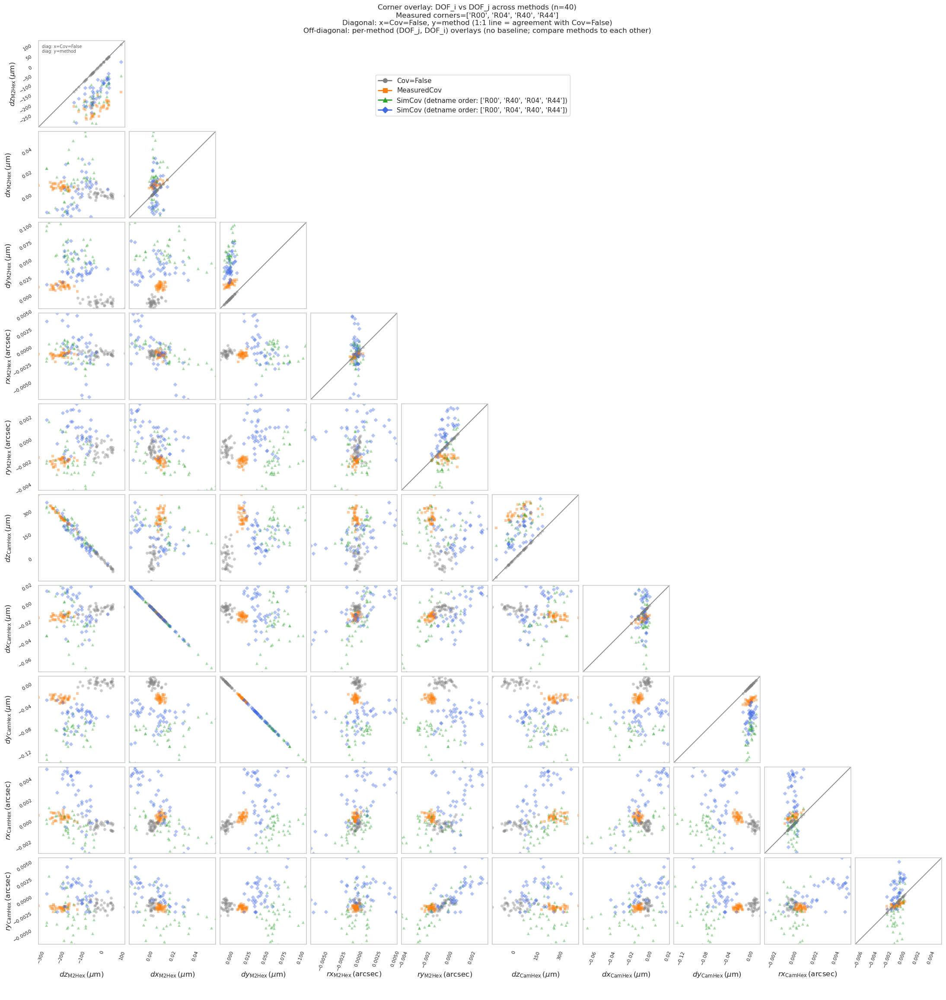

In [76]:
# Corner-package plot (overlay): DOF_i vs DOF_j panels, with points from multiple methods
#
# Uses `corner.corner` and overlays multiple datasets on the SAME axes.
# Each dataset is one "method" of computing the DOFs (Cov=False, MeasuredCov, SimCov variants).
#
# Diagonal behavior is configurable:
#   - diag_mode='hist': overlay 1D histograms for each method (standard corner diagonal)
#   - diag_mode='scatter': replace the diagonal panels with a scatter comparing Cov=False (x)
#       against each other method (y) for that same DOF, using the SAME colors/markers as
#       the off-diagonal panels. A 1:1 line is drawn for reference.
#
# Notes:
# - We disable corner's built-in datapoints and overlay our own scatters so we can
#   control marker types/sizes without triggering corner's marker warnings.

import numpy as np

try:
    import corner
except Exception as e:
    raise ImportError(
        "The `corner` package is not available in this kernel. "
        "Install it (e.g., `pip install corner`) and re-run this cell. "
        f"Original import error: {e}"
    )


def _align_by_seq(seqs_a, seqs_b):
    """Return aligned indices (rows_a, rows_b) such that seqs_a[rows_a] == seqs_b[rows_b]."""
    seqs_a = np.asarray(seqs_a, dtype=int).ravel()
    seqs_b = np.asarray(seqs_b, dtype=int).ravel()
    idx_b = {int(s): i for i, s in enumerate(seqs_b)}
    rows_a, rows_b = [], []
    for i, s in enumerate(seqs_a):
        j = idx_b.get(int(s))
        if j is None:
            continue
        rows_a.append(i)
        rows_b.append(j)
    return np.asarray(rows_a, dtype=int), np.asarray(rows_b, dtype=int)


def _maybe_list(name: str):
    """Return list(globals()[name]) if exists, else None."""
    if name not in globals():
        return None
    try:
        return list(globals()[name])
    except Exception:
        return None


def _axes_grid_from_corner_fig(fig, ndim: int):
    """Best-effort: return axes as (ndim, ndim) array."""
    axes = np.asarray(fig.axes)
    if axes.size == ndim * ndim:
        return axes.reshape((ndim, ndim))
    try:
        from corner.core import axes_corner

        axg = axes_corner(fig)
        axg = np.asarray(axg)
        if axg.shape == (ndim, ndim):
            return axg
    except Exception:
        pass
    raise RuntimeError(
        f"Cannot reshape corner axes: got {axes.size} axes for ndim={ndim}. "
        "(corner's internal layout may have changed.)"
    )


def _finite_xy(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    m = np.isfinite(x) & np.isfinite(y)
    return x[m], y[m]


def _range_from(x, y=None, p_lo=0.5, p_hi=99.5):
    x = np.asarray(x, dtype=float)
    if y is None:
        v = x[np.isfinite(x)]
    else:
        y = np.asarray(y, dtype=float)
        v = np.concatenate([x[np.isfinite(x)], y[np.isfinite(y)]])
    if v.size == 0:
        return -1.0, 1.0
    lo, hi = np.percentile(v, [p_lo, p_hi])
    if (not np.isfinite(lo)) or (not np.isfinite(hi)) or lo == hi:
        lo, hi = float(np.min(v)), float(np.max(v))
        if lo == hi:
            lo -= 1.0
            hi += 1.0
    pad = 0.05 * (hi - lo)
    return float(lo - pad), float(hi + pad)


def _apply_corner_tick_visibility(axg, ndim: int):
    """Match corner's tick-label visibility: x labels on bottom row, y labels on left column."""
    for i in range(ndim):
        for j in range(ndim):
            ax = axg[i, j]
            ax.tick_params(
                labelbottom=(i == ndim - 1),
                labelleft=(j == 0),
                labeltop=False,
                labelright=False,
            )


def _apply_corner_axis_labels(axg, labels):
    """Only bottom-row xlabels and left-column ylabels; clear others."""
    ndim = int(len(labels))
    for i in range(ndim):
        for j in range(ndim):
            ax = axg[i, j]
            if i == ndim - 1:
                ax.set_xlabel(labels[j])
            else:
                ax.set_xlabel("")
            if j == 0:
                ax.set_ylabel(labels[i])
            else:
                ax.set_ylabel("")


def _apply_corner_tick_label_rotation(axg, ndim: int, x_rot=0, y_rot=0):
    """Normalize tick value label rotation/alignments on edge panels."""
    # Bottom row x tick labels
    for j in range(ndim):
        ax = axg[ndim - 1, j]
        for t in ax.get_xticklabels():
            t.set_rotation(x_rot)
            t.set_ha("center")
            t.set_va("top")
    # Left column y tick labels
    for i in range(ndim):
        ax = axg[i, 0]
        for t in ax.get_yticklabels():
            t.set_rotation(y_rot)
            t.set_ha("right")
            t.set_va("center")


# ---------- Config ----------
corner_n_show = 10                   # number of DOF dimensions to include (DOF0..)
corner_max_points = None            # subsample if larger; set None for all (can be slow)
corner_bins = 30

# Diagonal mode:
# - 'hist' (default): overlay method histograms on diagonal
# - 'scatter': diagonal becomes scatter with x=Cov=False, y=(each other method), same DOF
#              using each method's own marker/color.
diag_mode = "scatter"  # 'hist' or 'scatter'

# Which methods to include (if available)
include_covfalse = True
include_measured = True
include_simpack_hist = True
include_simpack_canon = True

# Visual style
alpha_points = 0.40
marker_size = 24.0                  # scatter 's' is area in points^2
lw_hist = 2.0

tick_labelsize = 8                  # smaller tick label font size

# IMPORTANT: Disable corner titles (mean +/- etc) because we're overlaying multiple methods
corner_show_titles = False

# Colors requested:
# - Cov=False: gray
# - Measured: orange
# - Simulated (one corner order): green
# - Simulated (other corner order): blue
COLOR_COVFALSE = "gray"
COLOR_MEASURED = "tab:orange"
COLOR_SIM_GREEN = "tab:green"
COLOR_SIM_BLUE = "royalblue"

# Marker shapes per method (helps differentiate distributions)
MARKER_COVFALSE = "o"
MARKER_MEASURED = "s"
MARKER_SIM_GREEN = "^"
MARKER_SIM_BLUE = "D"

# Diagonal scatter options
SHOW_Y_EQ_X = True
EQ_LINE_COLOR = "0.5"
EQ_LINE_LW = 1.2


# ---------- Preconditions ----------
need = [
    "simpack_seqs",
    "simpack_states_meas_array",
    "simcomp_seqs",
    "simcomp_states_covfalse_array",
    "simcomp_use_dof",
]
missing = [k for k in need if k not in globals()]
if missing:
    raise NameError(
        "Missing prerequisites. Run the cells that compute the state arrays first. Missing: " + ", ".join(missing)
    )

_use_dof_ids = list(np.asarray(simcomp_use_dof, dtype=int).ravel())
_dof_to_col = {int(d): i for i, d in enumerate(_use_dof_ids)}
if len(_use_dof_ids) != len(_dof_to_col):
    raise ValueError("simcomp_use_dof contains duplicate DOF IDs; cannot build a unique mapping.")

_dof_ids_sorted = sorted(set(map(int, _use_dof_ids)))
corner_n_show = int(corner_n_show)
if corner_n_show < 1:
    corner_n_show = 1
if corner_n_show > len(_dof_ids_sorted):
    corner_n_show = len(_dof_ids_sorted)

dof_ids = _dof_ids_sorted[:corner_n_show]
cols = np.asarray([_dof_to_col[int(d)] for d in dof_ids], dtype=int)

def _ts_ofc_dof_label(dof_id: int) -> str:
    # ts_ofc state vector ordering:
    #   0..4   : M2 hexapod  (dz, dx, dy [um], rx, ry [arcsec])
    #   5..9   : Cam hexapod (dz, dx, dy [um], rx, ry [arcsec])
    #   10..29 : M1M3 bending modes B1..B20 [um]
    #   30..49 : M2 bending modes   B1..B20 [um]
    dof_id = int(dof_id)
    um = r"\, (\mu\mathrm{m})"
    arcsec = r"\, (\mathrm{arcsec})"

    if 0 <= dof_id <= 4:
        names = ["dz", "dx", "dy", "rx", "ry"]
        units = [um, um, um, arcsec, arcsec]
        k = dof_id
        return rf"${names[k]}_{{\mathrm{{M2Hex}}}}{units[k]}$"
    if 5 <= dof_id <= 9:
        names = ["dz", "dx", "dy", "rx", "ry"]
        units = [um, um, um, arcsec, arcsec]
        k = dof_id - 5
        return rf"${names[k]}_{{\mathrm{{CamHex}}}}{units[k]}$"
    if 10 <= dof_id <= 29:
        b = dof_id - 10 + 1
        return rf"$B{b}_{{\mathrm{{M1M3}}}}{um}$"
    if 30 <= dof_id <= 49:
        b = dof_id - 30 + 1
        return rf"$B{b}_{{\mathrm{{M2}}}}{um}$"

    # Fallback if dof_id doesn't match the canonical ts_ofc ordering above
    return f"DOF {dof_id}"

labels = [_ts_ofc_dof_label(d) for d in dof_ids]

# Align sequences: simpack_* arrays share simpack_seqs; covfalse uses simcomp_seqs
rows_pack, rows_covfalse = _align_by_seq(simpack_seqs, simcomp_seqs)
if rows_pack.size < 3:
    raise RuntimeError(f"Not enough aligned sequences for corner overlay: n_aligned={int(rows_pack.size)}")

# Try to fetch human-readable detname orders (used in legend labels)
_det_hist = _maybe_list("simpack_sim_corner_detnames_hist") or _maybe_list("simpack_sim_detnames_order_hist") or _maybe_list("simpack_sim_corner_order_hist")
_det_canon = _maybe_list("simpack_sim_corner_detnames_canon") or _maybe_list("simpack_sim_detnames_order_canon") or _maybe_list("simpack_sim_corner_order_canon")

# Build datasets (each: n_samples x n_dims)
datasets = []

if include_covfalse:
    X_covfalse = np.asarray(simcomp_states_covfalse_array, dtype=float)[rows_covfalse, :][:, cols]
    datasets.append(dict(name="Cov=False", X=X_covfalse, color=COLOR_COVFALSE, marker=MARKER_COVFALSE))

if include_measured:
    X_meas = np.asarray(simpack_states_meas_array, dtype=float)[rows_pack, :][:, cols]
    datasets.append(dict(name="MeasuredCov", X=X_meas, color=COLOR_MEASURED, marker=MARKER_MEASURED))

if include_simpack_hist and "simpack_states_hist_array" in globals():
    X_hist = np.asarray(simpack_states_hist_array, dtype=float)[rows_pack, :][:, cols]
    sim_hist_name = f"SimCov (detname order: {_det_hist})" if (_det_hist is not None) else "SimCov (detname order: <unknown>)"
    datasets.append(dict(name=sim_hist_name, X=X_hist, color=COLOR_SIM_GREEN, marker=MARKER_SIM_GREEN))

if include_simpack_canon and "simpack_states_canon_array" in globals():
    X_canon = np.asarray(simpack_states_canon_array, dtype=float)[rows_pack, :][:, cols]
    sim_canon_name = f"SimCov (detname order: {_det_canon})" if (_det_canon is not None) else "SimCov (detname order: <unknown>)"
    datasets.append(dict(name=sim_canon_name, X=X_canon, color=COLOR_SIM_BLUE, marker=MARKER_SIM_BLUE))

if len(datasets) < 2:
    raise RuntimeError(
        "Need at least two methods to overlay. "
        "Ensure Measured and Cov=False arrays exist; optionally run sim-pack compute for SimCov variants."
    )

# Keep only rows that are finite in ALL datasets (so overlays use same points)
finite = np.ones(int(datasets[0]["X"].shape[0]), dtype=bool)
for d in datasets:
    X = np.asarray(d["X"], dtype=float)
    if X.shape[0] != finite.size or X.shape[1] != corner_n_show:
        raise ValueError(f"Dataset {d['name']} has unexpected shape {X.shape}")
    finite &= np.all(np.isfinite(X), axis=1)

for d in datasets:
    d["X"] = np.asarray(d["X"], dtype=float)[finite, :]

n = int(datasets[0]["X"].shape[0])
if corner_max_points is not None and n > int(corner_max_points):
    rng = np.random.default_rng(0)
    idx = rng.choice(n, size=int(corner_max_points), replace=False)
    for d in datasets:
        d["X"] = d["X"][idx, :]
    n = int(datasets[0]["X"].shape[0])

print(f"[corner-overlay] n={n}, dims={corner_n_show}, DOFs={dof_ids}")
print("[corner-overlay] diag_mode:", diag_mode)
print("[corner-overlay] methods:")
for d in datasets:
    print("  -", d["name"])

# Corner settings:
# - Diagonal histograms are drawn by corner.
# - Off-diagonal scatters are overlaid by us (for different markers).
common = dict(
    labels=labels,
    bins=int(corner_bins),
    show_titles=bool(corner_show_titles),
    plot_density=False,
    plot_contours=False,
    fill_contours=False,
    plot_datapoints=False,
)

fig = None
for d in datasets:
    fig = corner.corner(
        d["X"],
        fig=fig,
        color=d["color"],
        hist_kwargs=dict(
            histtype="step",
            linewidth=lw_hist,
            density=True,
            color=d["color"],
        ),
        **common,
    )

axg = _axes_grid_from_corner_fig(fig, corner_n_show)

# Overlay datapoints with per-method markers on the off-diagonal panels
for d in datasets:
    X = np.asarray(d["X"], dtype=float)
    for i in range(corner_n_show):
        for j in range(corner_n_show):
            if i <= j:
                continue
            ax = axg[i, j]
            x, y = _finite_xy(X[:, j], X[:, i])
            if x.size:
                ax.scatter(
                    x,
                    y,
                    s=marker_size,
                    marker=d["marker"],
                    color=d["color"],
                    alpha=alpha_points,
                    linewidths=0,
                )

# Optional: replace diagonal with a method-vs-method scatter (same DOF)
if diag_mode not in ("hist", "scatter"):
    raise ValueError("diag_mode must be 'hist' or 'scatter'")

if diag_mode == "scatter":
    # Find Cov=False dataset (x-axis)
    cov_ds = None
    for d in datasets:
        if d["name"] == "Cov=False":
            cov_ds = d
            break
    if cov_ds is None:
        raise ValueError("diag_mode='scatter' requires the Cov=False dataset to be included.")

    X_cov = np.asarray(cov_ds["X"], dtype=float)
    other_datasets = [d for d in datasets if d is not cov_ds]

    for k in range(corner_n_show):
        ax = axg[k, k]
        ax.cla()

        # Include Cov=False itself on the diagonal (will lie on y=x)
        x_self = X_cov[:, k]
        x, y = _finite_xy(x_self, x_self)
        if x.size:
            ax.scatter(
                x,
                y,
                s=marker_size,
                marker=cov_ds["marker"],
                color=cov_ds["color"],
                alpha=alpha_points,
                linewidths=0,
            )

        # Determine axis limits from union of (CovFalse vs each method)
        xs = [X_cov[:, k]]
        ys = [X_cov[:, k]]
        for d in other_datasets:
            ys.append(np.asarray(d["X"], dtype=float)[:, k])
        lo, hi = _range_from(np.concatenate(xs), np.concatenate(ys))

        # Plot each other method with its own marker/color
        for d in other_datasets:
            y_method = np.asarray(d["X"], dtype=float)[:, k]
            x, y = _finite_xy(X_cov[:, k], y_method)
            if x.size:
                ax.scatter(
                    x,
                    y,
                    s=marker_size,
                    marker=d["marker"],
                    color=d["color"],
                    alpha=alpha_points,
                    linewidths=0,
                )

        ax.set_xlim(lo, hi)
        ax.set_ylim(lo, hi)

        if SHOW_Y_EQ_X:
            ax.plot([lo, hi], [lo, hi], color=EQ_LINE_COLOR, lw=EQ_LINE_LW)

        ax.grid(False)

        # Clarify baseline on diagonal scatter panels (avoid repeating on every panel)
        if k == 0:
            ax.text(
                0.04,
                0.96,
                "diag: x=Cov=False\ndiag: y=method",
                transform=ax.transAxes,
                va="top",
                ha="left",
                fontsize=max(6, tick_labelsize - 1),
                color="0.35",
            )

        # Restore outer axis labels that corner normally provides; `ax.cla()` clears them.
        if k == 0:
            ax.set_ylabel(labels[0])
        if k == corner_n_show - 1:
            ax.set_xlabel(labels[-1])

# Enforce uniform corner-style tick label visibility/labels/rotation on all subplots
_apply_corner_tick_visibility(axg, corner_n_show)
_apply_corner_axis_labels(axg, labels)
_apply_corner_tick_label_rotation(axg, corner_n_show, x_rot=70, y_rot=30)

# Make tick labels smaller everywhere
for ax in fig.axes:
    ax.tick_params(labelsize=tick_labelsize)
    ax.grid(False)

# Add legend (manual, because corner has no built-in legend)
import matplotlib.lines as mlines

handles = [
    mlines.Line2D(
        [],
        [],
        color=d["color"],
        marker=d["marker"],
        linestyle="-",
        linewidth=2,
        markersize=7,
        label=d["name"],
    )
    for d in datasets
]
fig.legend(handles=handles, loc="upper right", bbox_to_anchor=(0.6, 0.95), frameon=True)

# Add context in title
try:
    meas_corner_order = list(simpack_meas_corner_order)
except Exception:
    meas_corner_order = None

if diag_mode == 'scatter':
    diag_note = 'Diagonal: x=Cov=False, y=method (1:1 line = agreement with Cov=False)'
else:
    diag_note = 'Diagonal: per-method 1D histograms (no single baseline)'
offdiag_note = 'Off-diagonal: per-method (DOF_j, DOF_i) overlays (no baseline; compare methods to each other)'

if meas_corner_order is not None:
    fig.suptitle(
        f"Corner overlay: DOF_i vs DOF_j across methods (n={n})\nMeasured corners={meas_corner_order}\n{diag_note}\n{offdiag_note}",
        y=1.02,
        fontsize=12,
    )
else:
    fig.suptitle(
        f"Corner overlay: DOF_i vs DOF_j across methods (n={n})\n{diag_note}\n{offdiag_note}",
        y=1.02,
        fontsize=12,
    )


### 2 - A True diagonal

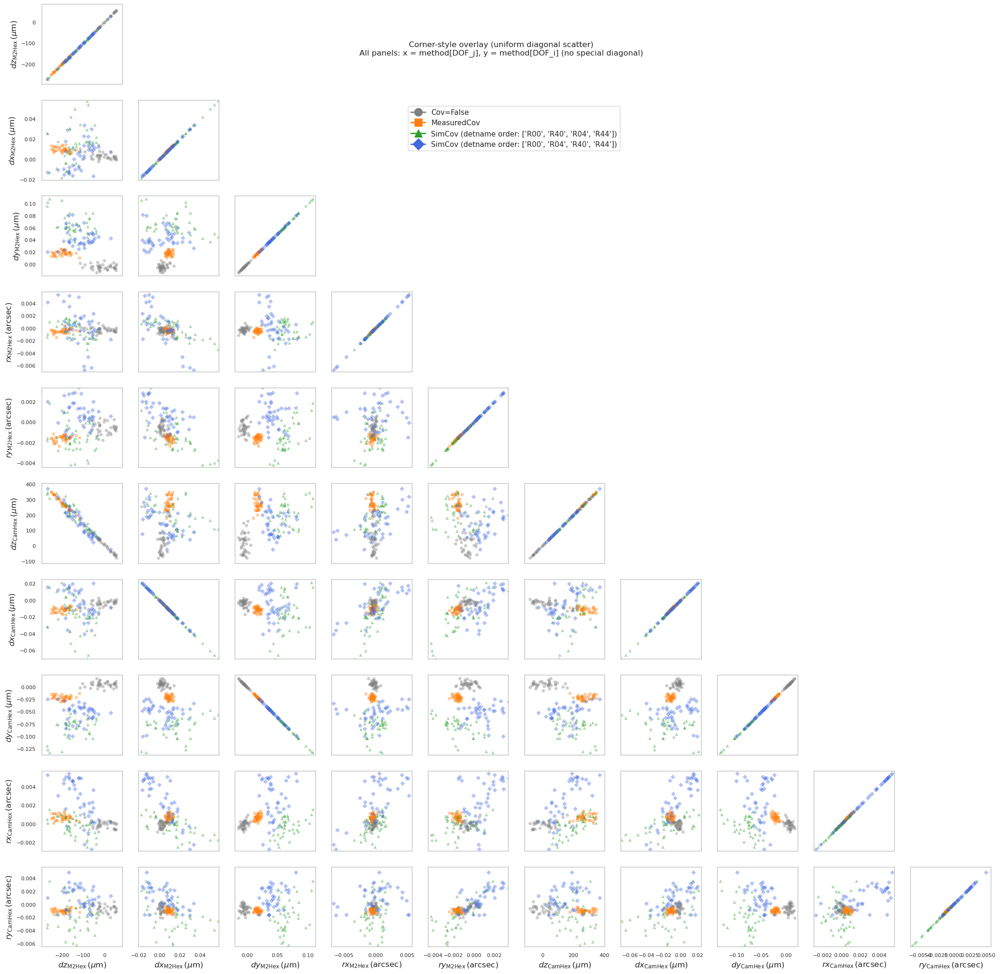

In [69]:
# Corner-style overlay with uniform diagonal scatter
#
## All panels (including diagonal) use the same scatter rule:
#   panel (i,j): x = method[DOF_j], y = method[DOF_i]
# i.e. diagonal uses x=y scatter (no histogram / special treatment).

import numpy as np
import matplotlib.pyplot as plt

if "datasets" not in globals() or "corner_n_show" not in globals() or "labels" not in globals():
    raise NameError(
        "Missing prerequisites: expected 'datasets', 'corner_n_show', and 'labels' in globals. "
        "Run the DOF corner-overlay setup cell first (the one that defines these variables)."
    )

_tick_labelsize = int(globals().get("tick_labelsize", 12))
_alpha_points = float(globals().get("alpha_points", 0.8))
_marker_size = float(globals().get("marker_size", 28.0))

def _finite_xy_local(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    m = np.isfinite(x) & np.isfinite(y)
    return x[m], y[m]

def _range_from_local(x, y=None, p_lo=0.5, p_hi=99.5):
    x = np.asarray(x, dtype=float)
    if y is None:
        v = x[np.isfinite(x)]
    else:
        y = np.asarray(y, dtype=float)
        v = np.concatenate([x[np.isfinite(x)], y[np.isfinite(y)]])
    if v.size == 0:
        return -1.0, 1.0
    lo, hi = np.percentile(v, [p_lo, p_hi])
    if (not np.isfinite(lo)) or (not np.isfinite(hi)) or lo == hi:
        lo, hi = float(np.min(v)), float(np.max(v))
        if lo == hi:
            lo -= 1.0
            hi += 1.0
    pad = 0.05 * (hi - lo)
    return float(lo - pad), float(hi + pad)

ndim = int(corner_n_show)
fig, axg = plt.subplots(ndim, ndim, figsize=(2.6 * ndim, 2.6 * ndim), squeeze=False)

for i in range(ndim):
    for j in range(ndim):
        ax = axg[i, j]
        if i < j:
            ax.axis("off")
            continue

        # Axis ranges based on all datasets for this (i,j) panel
        x_all = []
        y_all = []
        for d in datasets:
            X = np.asarray(d["X"], dtype=float)
            x_all.append(X[:, j])
            y_all.append(X[:, i])
        x_all = np.concatenate([np.asarray(v, dtype=float).ravel() for v in x_all])
        y_all = np.concatenate([np.asarray(v, dtype=float).ravel() for v in y_all])
        xlo, xhi = _range_from_local(x_all)
        ylo, yhi = _range_from_local(y_all)
        ax.set_xlim(xlo, xhi)
        ax.set_ylim(ylo, yhi)

        # Scatter overlays for each method (same rule for diagonal/off-diagonal)
        for d in datasets:
            X = np.asarray(d["X"], dtype=float)
            x, y = _finite_xy_local(X[:, j], X[:, i])
            if x.size:
                ax.scatter(
                    x,
                    y,
                    s=_marker_size,
                    marker=d.get("marker", "o"),
                    color=d.get("color", "C0"),
                    alpha=_alpha_points,
                    linewidths=0,
                    zorder=2,
                )

        # Ticks/labels like a corner plot
        ax.grid(False)
        ax.tick_params(labelsize=_tick_labelsize)
        ax.tick_params(
            labelbottom=(i == ndim - 1),
            labelleft=(j == 0),
            labeltop=False,
            labelright=False,
        )
        if i == ndim - 1:
            ax.set_xlabel(labels[j])
        else:
            ax.set_xlabel("")
        if j == 0:
            ax.set_ylabel(labels[i])
        else:
            ax.set_ylabel("")

# Legend
import matplotlib.lines as mlines
handles = [
    mlines.Line2D([], [], color=d.get("color", "C0"), marker=d.get("marker", "o"), linestyle="-", linewidth=2, markersize=12, label=d.get("name", "<method>"))
    for d in datasets
 ]
fig.legend(handles=handles, loc="upper right", bbox_to_anchor=(0.6, 0.8), frameon=True)

fig.suptitle(
    "Corner-style overlay (uniform diagonal scatter)\n"
    "All panels: x = method[DOF_j], y = method[DOF_i] (no special diagonal)",
    y=0.85,
    fontsize=12,
 )
plt.show()
#fig.savefig("corner_overlay_uniform_diagonal.png", dpi=200, bbox_inches="tight")

## Baseline-vs-method triangle (x = Cov=False, y = method)

This triangular grid is an explicit “baseline mapping” view: every panel uses the **Cov=False** solution on the **x-axis**, and a chosen method on the **y-axis**.

- **Panel definition**:
  - Off-diagonal panel $(i,j)$: $x = \mathrm{CovFalse}[\mathrm{DOF}_j]$, $y = \mathrm{method}[\mathrm{DOF}_i]$.
  - Diagonal panel $(k,k)$: compares the same DOF ($x$ baseline vs $y$ method) and includes a **1:1 line**.
- **Interpretation**:
  - **Diagonal panels**: agreement with baseline shows up as a tight cloud on the 1:1 line; slope/offset relative to the line indicates gain/bias vs baseline.
  - **Off-diagonal panels**: any coherent trend (tilt/structure) indicates **cross-talk / mixing** relative to the baseline (i.e., baseline DOF$_j$ variations are being absorbed into method DOF$_i$).
  - Because $x$ always comes from Cov=False, this plot is **not** a within-method joint distribution; it’s a “method vs baseline” diagnostic across all DOF pairs.

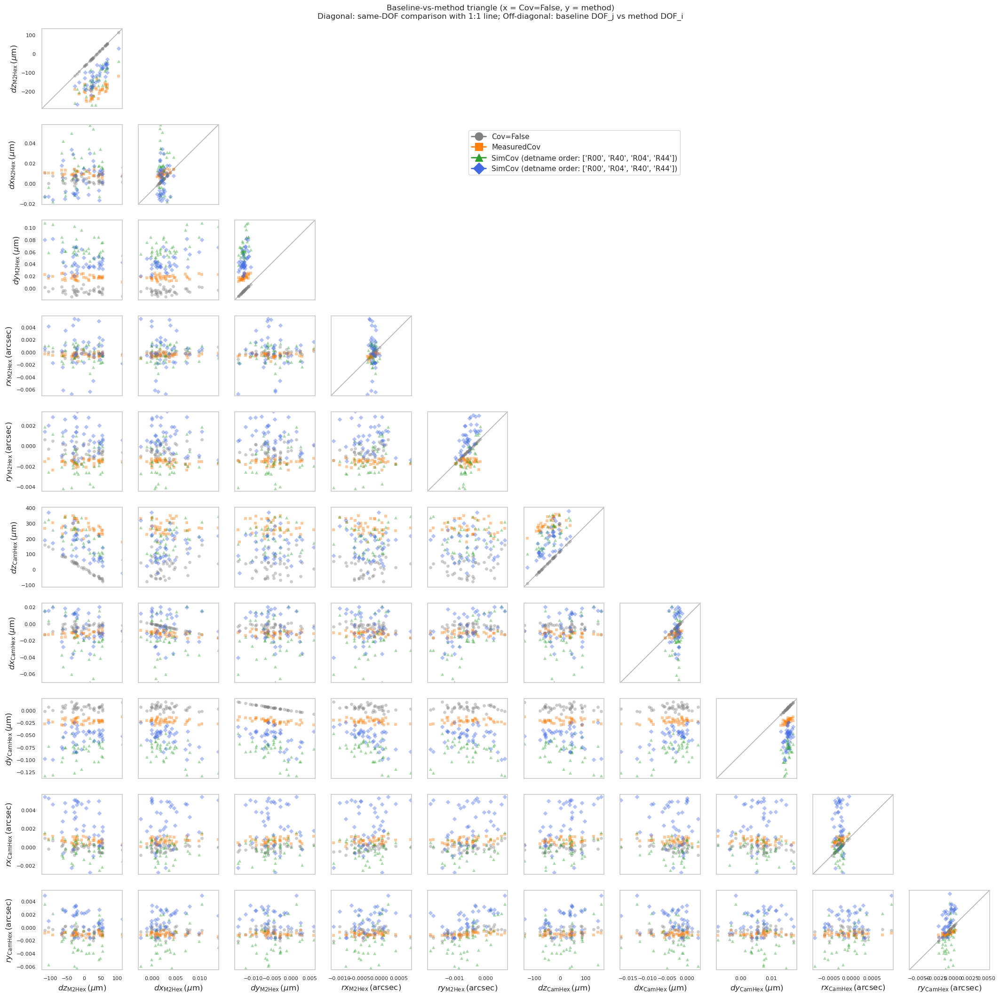

In [73]:
# Baseline-vs-method triangular plot: x from Cov=False, y from other method
#
# This complements the corner-overlay above.
# In this figure:
#   - Off-diagonal panel (i,j): x = Cov=False[DOF_j], y = method[DOF_i]
#   - Diagonal panel (k,k):     x = Cov=False[DOF_k], y = method[DOF_k] + 1:1 line
#
# Interpretation: how each method maps DOF space relative to the Cov=False baseline (not a joint distribution within the same method).

import numpy as np
import matplotlib.pyplot as plt

if "datasets" not in globals() or "corner_n_show" not in globals() or "labels" not in globals():
    raise NameError("Run Cell 103 first so 'datasets', 'corner_n_show', and 'labels' exist.")

_tick_labelsize = int(globals().get("tick_labelsize", 12))
_alpha_points = float(globals().get("alpha_points", 0.8))
_marker_size = float(globals().get("marker_size", 28.0))

def _finite_xy_local(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    m = np.isfinite(x) & np.isfinite(y)
    return x[m], y[m]

def _range_from_local(x, y=None, p_lo=0.5, p_hi=99.5):
    x = np.asarray(x, dtype=float)
    if y is None:
        v = x[np.isfinite(x)]
    else:
        y = np.asarray(y, dtype=float)
        v = np.concatenate([x[np.isfinite(x)], y[np.isfinite(y)]])
    if v.size == 0:
        return -1.0, 1.0
    lo, hi = np.percentile(v, [p_lo, p_hi])
    if (not np.isfinite(lo)) or (not np.isfinite(hi)) or lo == hi:
        lo, hi = float(np.min(v)), float(np.max(v))
        if lo == hi:
            lo -= 1.0
            hi += 1.0
    pad = 0.05 * (hi - lo)
    return float(lo - pad), float(hi + pad)

# Find baseline and other methods
cov_ds = None
for d in datasets:
    if d.get("name") == "Cov=False":
        cov_ds = d
        break
if cov_ds is None:
    raise RuntimeError("Cov=False baseline not found in datasets; enable include_covfalse in Cell 103.")

X_cov = np.asarray(cov_ds["X"], dtype=float)
others = [d for d in datasets if d is not cov_ds]
if len(others) == 0:
    raise RuntimeError("No non-baseline datasets found. Enable include_measured / include_simpack_* in Cell 103.")

ndim = int(corner_n_show)
fig, axg = plt.subplots(ndim, ndim, figsize=(2.6 * ndim, 2.6 * ndim), squeeze=False)

for i in range(ndim):
    for j in range(ndim):
        ax = axg[i, j]
        if i < j:
            ax.axis("off")
            continue

        # Collect data for axis ranges
        x_base = X_cov[:, j]
        if i == j:
            # diagonal: compare same DOF (baseline vs method) and add 1:1
            ys = [X_cov[:, i]]
            for d in others:
                ys.append(np.asarray(d["X"], dtype=float)[:, i])
            lo, hi = _range_from_local(x_base, np.concatenate(ys))
            ax.plot([lo, hi], [lo, hi], color="0.7", lw=1.2, zorder=1)
            ax.set_xlim(lo, hi)
            ax.set_ylim(lo, hi)
        else:
            # off-diagonal: x is baseline DOF_j; y is method DOF_i (including baseline itself)
            y_all = [X_cov[:, i]]
            for d in others:
                y_all.append(np.asarray(d["X"], dtype=float)[:, i])
            xlo, xhi = _range_from_local(x_base)
            ylo, yhi = _range_from_local(np.concatenate(y_all))
            ax.set_xlim(xlo, xhi)
            ax.set_ylim(ylo, yhi)

        # Plot baseline (Cov=False) on y as well, then overlays: y from each method, x from baseline
        x0, y0 = _finite_xy_local(X_cov[:, j], X_cov[:, i])
        if x0.size:
            ax.scatter(
                x0,
                y0,
                s=_marker_size,
                marker=cov_ds.get("marker", "o"),
                color=cov_ds.get("color", "gray"),
                alpha=_alpha_points,
                linewidths=0,
                zorder=2,
            )

        for d in others:
            X_m = np.asarray(d["X"], dtype=float)
            x, y = _finite_xy_local(X_cov[:, j], X_m[:, i])
            if x.size:
                ax.scatter(
                    x,
                    y,
                    s=_marker_size,
                    marker=d.get("marker", "o"),
                    color=d.get("color", "C0"),
                    alpha=_alpha_points,
                    linewidths=0,
                    zorder=2,
                )

        # Ticks/labels like a corner plot
        ax.grid(False)
        ax.tick_params(labelsize=_tick_labelsize)
        ax.tick_params(
            labelbottom=(i == ndim - 1),
            labelleft=(j == 0),
            labeltop=False,
            labelright=False,
        )
        if i == ndim - 1:
            ax.set_xlabel(labels[j])
        else:
            ax.set_xlabel("")
        if j == 0:
            ax.set_ylabel(labels[i])
        else:
            ax.set_ylabel("")

# Legend (baseline appears on x-axis and is also plotted on y-axis for reference)
import matplotlib.lines as mlines
handles = [
    mlines.Line2D([], [], color=cov_ds.get("color", "gray"), marker=cov_ds.get("marker", "o"), linestyle="-", linewidth=2, markersize=12, label=cov_ds.get("name", "Cov=False")),
    *[mlines.Line2D([], [], color=d.get("color", "C0"), marker=d.get("marker", "o"), linestyle="-", linewidth=2, markersize=12, label=d.get("name", "<method>")) for d in others],
 ]
fig.legend(handles=handles, loc="upper right", bbox_to_anchor=(0.65, 0.8), frameon=True)

fig.suptitle(
    "Baseline-vs-method triangle (x = Cov=False, y = method)\n"
    "Diagonal: same-DOF comparison with 1:1 line; Off-diagonal: baseline DOF_j vs method DOF_i",
    y=0.9,
    fontsize=12,
 )
plt.show()

# Clipping the Cov Matrix

Here we ask: **does the full covariance matrix $C_\text{new}$ also change?**

**Build environment-clipped covariance matrices**
- Loads the cached detrended Zernike data and merges `donut_blur_fwhm` and `altitude` from ConsDB.
- Builds an extra **"good-binning" aggregate** covariance for all rows with `donut_blur_fwhm ≤ max_good_binning_cov` (default: 1.25 arcsec), and applies the elevation/altitude clip `alt_window_cov` when enabled.
- Also bins rows by the same blur edges used for $C_\text{corr}$ (≤ 1.0, 1.0–1.25, 1.25–1.5, > 1.5 arcsec).
- For each clip/bin: computes `np.cov`, remaps from the raw Z4–Z26 basis to the target
  Z4–Z28 basis (Z20/Z21 zeroed-raw and Z27/Z28 missing → diag = 1, off-diag = 0),
  and canonicalizes the corner block order to ts_ofc convention
  (`["R00","R04","R40","R44"]`).
- **Row-count bookkeeping is consistent with all clipping** (blur + elevation + finite-data filtering), so the reported `n_rows` matches the rows actually used to build each covariance.
- Results are stored in `C_new_by_env` (list of dicts).

## Helper: build environment-clipped covariance matrices

In [134]:
# Build environment-clipped covariance matrices from cached detrended data
# -----------------------------------------------------------------------
# Strategy:
#   1) Reconstruct a combined (n_samples x n_vars) array from the cached
#      detrended blocks, retaining per-row (day_obs, seq_num) metadata.
#   2) Merge donut_blur_fwhm / altitude from cdb_table_all_days.
#   3) Bin by donut_blur_fwhm (same edges as Cell 92).
#   4) Compute np.cov() on each bin subset.
#   5) Remap from Z4-Z26 → Z4-Z28 (same logic as Cell 26):
#      - missing Zernikes (Z27, Z28) → diag=1, offdiag=0
#      - zero-raw Zernikes (Z20, Z21) → diag=1, offdiag=0
#   6) Store results in C_new_by_env for downstream use.

 # ---- USER SETTINGS (mirror Cell 92 defaults) ----
blur_bins_cov = [1.0, 1.25, 1.5]          # arcsec bin edges (same as Cell 92)
max_good_binning_cov = 1.25              # arcsec: build an extra C for blur <= this (aggregate)
alt_window_cov = (55, 65)                # elevation/altitude clip: (55, 65) or None
zero_raw_zernikes_cov = [20, 21]         # Zernikes with no real data
current_indices_cov = list(range(4, 27)) # Z4..Z26 (columns in cached data)
target_indices_cov  = list(range(4, 29)) # Z4..Z28 (target for C_new)
detectors_cov = ["R00", "R40", "R04", "R44"]
n_det_cov = len(detectors_cov)

# ---- 1) Reconstruct combined detrended array with metadata ----
# Prefer loading from the cache CSV (has day_obs, seq_num, visit_id as first 3 cols)
cache_dir_cov = Path(globals().get("cache_dir", "./zernike_cache")).resolve()
combined_csv = cache_dir_cov / "detrended_all.csv"

if combined_csv.exists():
    print(f"[cov-clip] Loading combined detrended data from {combined_csv}")
    raw = np.loadtxt(combined_csv, delimiter=",", skiprows=1)
    raw = np.atleast_2d(raw)
    meta_arr = raw[:, :3]       # day_obs, seq_num, visit_id
    data_arr = raw[:, 3:]       # Zernike coefficients (n_det x n_zern columns)
    day_obs_arr = meta_arr[:, 0].astype(int)
    seq_num_arr = meta_arr[:, 1].astype(int)
    print(f"[cov-clip] Loaded: {data_arr.shape[0]} samples, {data_arr.shape[1]} Zernike columns")
else:
    # Fallback: reconstruct from in-memory detrended_days + manifest
    if "detrended_days" not in globals() or "manifest" not in globals():
        raise NameError(
            "Neither detrended_all.csv nor in-memory detrended_days/manifest found. "
            "Run Cell 14 (load cache) first."
        )
    print("[cov-clip] Reconstructing combined detrended data from in-memory blocks + manifest")
    manifest_local = globals()["manifest"]
    blocks = globals()["detrended_days"]
    det_entries = manifest_local.get("detrended_blocks", [])

    rows_data = []
    rows_day = []
    rows_seq = []
    for idx, block in enumerate(blocks):
        if block is None:
            continue
        entry = det_entries[idx] if idx < len(det_entries) else {}
        day_val = int(entry.get("day", 0))
        seq_min = int(entry.get("seq_min", 0))
        n_rows = block.shape[0]
        rows_data.append(block)
        rows_day.append(np.full(n_rows, day_val, dtype=int))
        rows_seq.append(np.arange(seq_min, seq_min + n_rows, dtype=int))

    data_arr = np.vstack(rows_data)
    day_obs_arr = np.concatenate(rows_day)
    seq_num_arr = np.concatenate(rows_seq)
    print(f"[cov-clip] Reconstructed: {data_arr.shape[0]} samples, {data_arr.shape[1]} columns")

n_vars_raw = data_arr.shape[1]
expected_vars = n_det_cov * len(current_indices_cov)
if n_vars_raw != expected_vars:
    print(f"[cov-clip] WARNING: expected {expected_vars} columns (4 det × {len(current_indices_cov)} Z); got {n_vars_raw}")

# ---- 2) Build a DataFrame and merge environment metrics ----
df_cov = pd.DataFrame({"day_obs": day_obs_arr, "seq_num": seq_num_arr})

if "cdb_table_all_days" not in globals():
    raise NameError("cdb_table_all_days not found. Run Cell 6 (ConsDB query) first.")

cdb = cdb_table_all_days.copy()
# Harmonize column names (Cell 6 uses 'seq', Cell 92 uses 'seq_num')
if "seq" in cdb.columns and "seq_num" not in cdb.columns:
    cdb = cdb.rename(columns={"seq": "seq_num"})

keep_cols = [c for c in ["day_obs", "seq_num", "donut_blur_fwhm", "altitude"] if c in cdb.columns]
cdb_sub = cdb[keep_cols].drop_duplicates(subset=["day_obs", "seq_num"], keep="first")
for c in ["donut_blur_fwhm", "altitude"]:
    if c in cdb_sub.columns:
        cdb_sub[c] = pd.to_numeric(cdb_sub[c], errors="coerce")

df_cov = df_cov.merge(cdb_sub, on=["day_obs", "seq_num"], how="left")
n_with_blur = df_cov["donut_blur_fwhm"].notna().sum()
print(f"[cov-clip] Merged env metrics: {n_with_blur}/{len(df_cov)} rows have donut_blur_fwhm")

# ---- 3) Bin by donut_blur_fwhm ----
blur_bins_cov = [float(b) for b in blur_bins_cov]
b0 = blur_bins_cov[0]
bin_labels = [f"blur ≤ {b0}"]
bin_intervals = [(None, b0)]
for lo, hi in zip(blur_bins_cov[:-1], blur_bins_cov[1:]):
    bin_labels.append(f"{lo} < blur ≤ {hi}")
    bin_intervals.append((lo, hi))
bin_labels.append(f"blur > {blur_bins_cov[-1]}")
bin_intervals.append((blur_bins_cov[-1], None))

blur_vals = df_cov["donut_blur_fwhm"].to_numpy(dtype=float)
alt_vals = df_cov["altitude"].to_numpy(dtype=float) if "altitude" in df_cov.columns else None

# Precompute altitude/elevation clip mask once (so row counting is correct)
if alt_window_cov is not None and alt_vals is not None:
    alt_min, alt_max = alt_window_cov
    alt_in_window = np.isfinite(alt_vals) & (alt_vals > alt_min) & (alt_vals < alt_max)
else:
    alt_in_window = None

# ---- 4 & 5) Compute covariance per bin and remap to target basis ----
def _remap_cov_to_target(C_raw, *, current_indices, target_indices, zero_raw_zernikes, n_det):
    """Remap a covariance from current_indices basis to target_indices basis.

    Missing and zero-raw Zernikes get diag=1, offdiag=0 (same as Cell 26).
    """
    n_cur = len(current_indices)
    n_tgt = len(target_indices)
    C_new = np.zeros((n_det * n_tgt, n_det * n_tgt))

    # Copy existing entries
    for d1 in range(n_det):
        for d2 in range(n_det):
            for i_old, zk1 in enumerate(current_indices):
                if zk1 not in target_indices:
                    continue
                i_new = target_indices.index(zk1)
                for j_old, zk2 in enumerate(current_indices):
                    if zk2 not in target_indices:
                        continue
                    j_new = target_indices.index(zk2)
                    C_new[d1 * n_tgt + i_new, d2 * n_tgt + j_new] = \
                        C_raw[d1 * n_cur + i_old, d2 * n_cur + j_old]

    # Missing Zernikes (not in current_indices): diag=1, offdiag=0
    for zk in target_indices:
        if zk not in current_indices:
            i_new = target_indices.index(zk)
            for d in range(n_det):
                idx = d * n_tgt + i_new
                C_new[idx, :] = 0.0
                C_new[:, idx] = 0.0
                C_new[idx, idx] = 1.0

    # Zero-raw Zernikes: diag=1, offdiag=0
    for zk in zero_raw_zernikes:
        if zk in target_indices:
            i_new = target_indices.index(zk)
            for d in range(n_det):
                idx = d * n_tgt + i_new
                C_new[idx, :] = 0.0
                C_new[:, idx] = 0.0
                C_new[idx, idx] = 1.0

    return C_new


def _compute_cov_for_mask(label: str, m_blur: np.ndarray) -> dict:
    """Compute C_raw/C_new for a given blur-based mask, with optional elevation clip.

    Row counting is tracked at each stage:
      - n_rows_blur: rows selected by blur (and finite blur)
      - n_rows_blur_alt: after also applying altitude/elevation window (if enabled)
      - n_rows_used: final rows used after removing non-finite Zernike rows
    """
    m_blur = m_blur & np.isfinite(blur_vals)
    n_rows_blur = int(np.sum(m_blur))
    m = m_blur if alt_in_window is None else (m_blur & alt_in_window)
    n_rows_blur_alt = int(np.sum(m))

    if n_rows_blur_alt < 3:
        alt_str = "" if alt_window_cov is None else f" and {alt_window_cov[0]}<alt<{alt_window_cov[1]}"
        print(f"[cov-clip] {label}{alt_str}: only {n_rows_blur_alt} rows (blur={n_rows_blur}) -> skipping (need ≥ 3)")
        return {
            "label": label,
            "C_raw": None,
            "C_new": None,
            "n_rows": n_rows_blur_alt,  # kept for backward-compat; equals post-env rows when skipped
            "n_rows_blur": n_rows_blur,
            "n_rows_blur_alt": n_rows_blur_alt,
            "n_rows_used": 0,
        }

    data_sub = data_arr[m, :]

    # Remove rows with any NaN/Inf in Zernikes
    finite_mask = np.isfinite(data_sub).all(axis=1)
    data_sub = data_sub[finite_mask]
    n_rows_used = int(data_sub.shape[0])

    if n_rows_used < 3:
        alt_str = "" if alt_window_cov is None else f" and {alt_window_cov[0]}<alt<{alt_window_cov[1]}"
        print(f"[cov-clip] {label}{alt_str}: only {n_rows_used} finite rows (blur={n_rows_blur}, blur+alt={n_rows_blur_alt}) -> skipping")
        return {
            "label": label,
            "C_raw": None,
            "C_new": None,
            "n_rows": n_rows_used,
            "n_rows_blur": n_rows_blur,
            "n_rows_blur_alt": n_rows_blur_alt,
            "n_rows_used": n_rows_used,
        }

    # Compute covariance on this subset
    C_raw = np.cov(data_sub, rowvar=False)

    # Remap to target basis
    C_new_bin = _remap_cov_to_target(
        C_raw,
        current_indices=current_indices_cov,
        target_indices=target_indices_cov,
        zero_raw_zernikes=zero_raw_zernikes_cov,
        n_det=n_det_cov,
    )

    # Canonicalize: permute from historical corner order to ts_ofc order
    # detectors_cov = ["R00","R40","R04","R44"] -> CORNERS = ["R00","R04","R40","R44"]
    C_new_bin = permute_cov_by_corner(
        C_new_bin,
        corner_from=detectors_cov,   # historical order used in cached data
        corner_to=CORNERS,           # canonical ts_ofc order from Cell 33
        nZ=len(target_indices_cov),
    )

    alt_str = "" if alt_window_cov is None else f" and {alt_window_cov[0]}<alt<{alt_window_cov[1]}"
    print(
        f"[cov-clip] {label}{alt_str}: "
        f"n_rows_used={n_rows_used} (blur={n_rows_blur}, blur+alt={n_rows_blur_alt}), "
        f"C_raw shape={C_raw.shape}, C_new shape={C_new_bin.shape}"
    )

    return {
        "label": label,
        "C_raw": C_raw,
        "C_new": C_new_bin,
        "n_rows": n_rows_used,
        "n_rows_blur": n_rows_blur,
        "n_rows_blur_alt": n_rows_blur_alt,
        "n_rows_used": n_rows_used,
    }


C_new_by_env: list[dict] = []

# Extra clip: aggregate everything with "good binning" (blur <= max_good_binning_cov) + elevation clip
if max_good_binning_cov is not None:
    m_good = blur_vals <= float(max_good_binning_cov)
    C_new_by_env.append(_compute_cov_for_mask(f"blur ≤ {float(max_good_binning_cov)} (aggregate)", m_good))

# Standard blur-bin covariance matrices
for label, (lo, hi) in zip(bin_labels, bin_intervals):
    if lo is None:
        m_bin = blur_vals <= hi
    elif hi is None:
        m_bin = blur_vals > lo
    else:
        m_bin = (blur_vals > lo) & (blur_vals <= hi)
    C_new_by_env.append(_compute_cov_for_mask(label, m_bin))

# Also store the full (unclipped) C_new for reference
# Build it fresh: compute, remap, then canonicalize
_all_mask = np.isfinite(data_arr).all(axis=1)
_C_raw_all = np.cov(data_arr[_all_mask], rowvar=False)
_C_new_all = _remap_cov_to_target(
    _C_raw_all,
    current_indices=current_indices_cov,
    target_indices=target_indices_cov,
    zero_raw_zernikes=zero_raw_zernikes_cov,
    n_det=n_det_cov,
 )
_C_new_all = permute_cov_by_corner(
    _C_new_all,
    corner_from=detectors_cov,
    corner_to=CORNERS,
    nZ=len(target_indices_cov),
 )
C_new_by_env.append({
    "label": "all (no clip)",
    "C_raw": _C_raw_all,
    "C_new": _C_new_all,
    "n_rows": int(_all_mask.sum()),
    "n_rows_total": int(data_arr.shape[0]),
    "n_rows_used": int(_all_mask.sum()),
})

print(f"\n[cov-clip] Built {len(C_new_by_env)} clipped covariance matrices (including 'all').")
print(f"[cov-clip] Corner order canonicalized: {detectors_cov} -> {CORNERS} (ts_ofc order)")
print("[cov-clip] Stored in: C_new_by_env (list of dicts with 'label', 'C_raw', 'C_new', 'n_rows', plus row-count breakdown fields)")

[cov-clip] Loading combined detrended data from /home/dsanmartim/notebooks/aos_notebooks/zernike_cache/detrended_all.csv
[cov-clip] Loaded: 540 samples, 92 Zernike columns
[cov-clip] Merged env metrics: 540/540 rows have donut_blur_fwhm
[cov-clip] blur ≤ 1.25 (aggregate) and 55<alt<65: n_rows_used=357 (blur=407, blur+alt=357), C_raw shape=(92, 92), C_new shape=(100, 100)
[cov-clip] blur ≤ 1.0 and 55<alt<65: n_rows_used=157 (blur=186, blur+alt=157), C_raw shape=(92, 92), C_new shape=(100, 100)
[cov-clip] 1.0 < blur ≤ 1.25 and 55<alt<65: n_rows_used=200 (blur=221, blur+alt=200), C_raw shape=(92, 92), C_new shape=(100, 100)
[cov-clip] 1.25 < blur ≤ 1.5 and 55<alt<65: n_rows_used=76 (blur=102, blur+alt=76), C_raw shape=(92, 92), C_new shape=(100, 100)
[cov-clip] blur > 1.5 and 55<alt<65: n_rows_used=31 (blur=31, blur+alt=31), C_raw shape=(92, 92), C_new shape=(100, 100)

[cov-clip] Built 6 clipped covariance matrices (including 'all').
[cov-clip] Corner order canonicalized: ['R00', 'R40', 

## Visualise the clipped covariance matrices

- Side-by-side grid with one row per covariance variant:
  top row = "good-binning" aggregate (`donut_blur_fwhm ≤ max_good_binning_cov`, plus elevation/altitude clip if enabled),
  remaining rows = per-blur-bin covariances.
- Left = remapped unclipped $C_\text{new}$ (Z4–Z28, all data — same reference on every row),
  Right = remapped clipped $C_\text{new}$ (Z4–Z28, per variant).
- Both panels use the canonical ts_ofc corner order (`["R00","R04","R40","R44"]`).
- Detector-block separators and a shared colour bar aid comparison across bins.

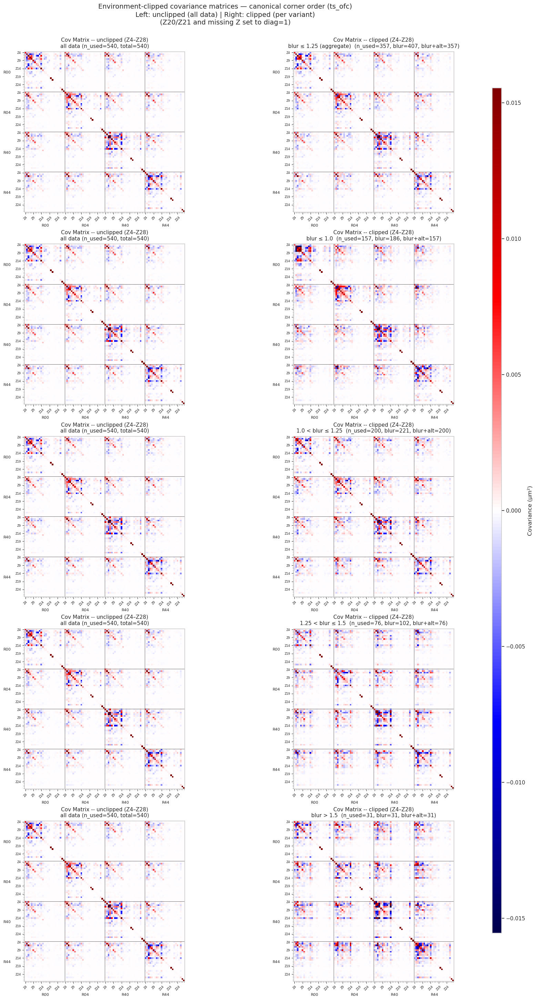

In [160]:
# Plot: environment-clipped covariance matrices (per blur bin / variant)
# 2-column grid per row:
#   Left  = Cov Matrix NOT clipped (Z4-Z28, canonical) — reference
#   Right = Cov Matrix clipped     (Z4-Z28, canonical) — per variant

if "C_new_by_env" not in globals() or len(C_new_by_env) == 0:
    raise NameError("C_new_by_env not found. Run the clipped covariance build cell first.")

# Canonical detector order (ts_ofc)
CORNERS_PLOT = globals().get("CORNERS", ["R00", "R04", "R40", "R44"])
target_z = globals().get("target_indices_cov", list(range(4, 29)))

# Separate clipped entries from the "all (no clip)" baseline
clipped_entries = [
    e for e in C_new_by_env
    if e.get("C_new") is not None and e.get("label") != "all (no clip)"
 ]
all_entry = [e for e in C_new_by_env if e.get("label") == "all (no clip)" and e.get("C_new") is not None]

if len(all_entry) == 0:
    raise RuntimeError("'all (no clip)' entry not found in C_new_by_env.")
C_new_unclipped = all_entry[0]["C_new"]  # already in canonical order (Z4-Z28)
n_rows_unclipped_used = int(all_entry[0].get("n_rows_used", all_entry[0].get("n_rows", 0)))
n_rows_unclipped_total = int(all_entry[0].get("n_rows_total", n_rows_unclipped_used))

if len(clipped_entries) == 0:
    raise RuntimeError("No valid clipped covariance matrices to plot.")

# Force the new aggregate variant to be the first row (if present)
aggregate_entries = [e for e in clipped_entries if "(aggregate)" in str(e.get("label", ""))]
bin_entries = [e for e in clipped_entries if "(aggregate)" not in str(e.get("label", ""))]
entries = aggregate_entries + bin_entries

n_entries = len(entries)
n_det = len(CORNERS_PLOT)

fig, axes = plt.subplots(
    n_entries, 2,
    figsize=(18, 7 * n_entries),
    squeeze=False,
 )

def _plot_cov_matrix(ax, C, z_list, dets, title, *, vmax_pct=99.5):
    n_z = len(z_list)
    n_d = len(dets)
    n_total = n_z * n_d

    vmax = np.percentile(np.abs(C), vmax_pct) if C.size > 0 else 1.0
    if vmax == 0:
        vmax = 1.0
    im = ax.imshow(C, cmap="seismic", vmin=-vmax, vmax=vmax, aspect="equal")
    ax.set_title(title, fontsize=11, pad=8)

    # Block separators
    for k in range(1, n_d):
        cut = k * n_z - 0.5
        ax.axhline(cut, color="k", lw=0.8, alpha=0.6)
        ax.axvline(cut, color="k", lw=0.8, alpha=0.6)

    # Tick labels (every ~5th Zernike)
    step = max(1, n_z // 5)
    tick_pos = list(range(0, n_z, step))
    tick_labels = [f"Z{z_list[p]}" for p in tick_pos]

    xticks, yticks, xlabels, ylabels = [], [], [], []
    for d in range(n_d):
        offset = d * n_z
        xticks.extend([offset + p for p in tick_pos])
        yticks.extend([offset + p for p in tick_pos])
        xlabels.extend(tick_labels)
        ylabels.extend(tick_labels)

    ax.set_xticks(xticks)
    ax.set_yticks(yticks)
    ax.set_xticklabels(xlabels, rotation=45, fontsize=6)
    ax.set_yticklabels(ylabels, fontsize=6)

    # Explicitly enable tick *marks* (some notebook styles disable them by default).
    # Keep the tick *labels* as set above; just ensure marks are visible.
    ax.tick_params(axis="both", which="both", bottom=True, left=True, top=False, right=False, colors="k")
    ax.tick_params(axis="both", which="major", length=4, width=0.8, direction="out")

    # Tick marks at every Zernike index (minor ticks), even if we label only a subset.
    ax.set_xticks(np.arange(n_total), minor=True)
    ax.set_yticks(np.arange(n_total), minor=True)
    ax.tick_params(axis="both", which="minor", length=2, width=0.5, direction="out", labelbottom=False, labelleft=False)
    
    ax.grid(False)

    # Detector labels
    for i, det in enumerate(dets):
        mid = (i + 0.5) * n_z
        ax.text(mid, n_total + 9, det, ha="center", va="bottom", fontsize=8, clip_on=False)
        ax.text(-9, mid, det, ha="right", va="center", fontsize=8, clip_on=False)

    return im

def _format_n(entry: dict) -> str:
    n_used = int(entry.get("n_rows_used", entry.get("n_rows", 0)))
    n_blur = entry.get("n_rows_blur", None)
    n_blur_alt = entry.get("n_rows_blur_alt", None)
    if n_blur is None and n_blur_alt is None:
        return f"n_used={n_used}"
    parts = [f"n_used={n_used}"]
    if n_blur is not None:
        parts.append(f"blur={int(n_blur)}")
    if n_blur_alt is not None:
        parts.append(f"blur+alt={int(n_blur_alt)}")
    return " (" + ", ".join(parts) + ")" if len(parts) > 1 else parts[0]

for row, entry in enumerate(entries):
    label = entry.get("label", "(unnamed)")
    C_new_bin = entry["C_new"]
    n_str = _format_n(entry)

    axL = axes[row, 0]
    axR = axes[row, 1]

    # Left: Cov Matrix unclipped (Z4-Z28, canonical) — same for every row
    _plot_cov_matrix(
        axL, C_new_unclipped, target_z, CORNERS_PLOT,
        f"Cov Matrix -- unclipped (Z4–Z28)\nall data (n_used={n_rows_unclipped_used}, total={n_rows_unclipped_total})"
     )

    # Right: Cov Matrix clipped (Z4-Z28, canonical) — per variant/bin
    im = _plot_cov_matrix(
        axR, C_new_bin, target_z, CORNERS_PLOT,
        f"Cov Matrix -- clipped (Z4–Z28)\n{label} {n_str}"
     )

# Shared colorbar
fig.subplots_adjust(right=0.92)
cax = fig.add_axes([0.93, 0.15, 0.015, 0.7])
cb = fig.colorbar(im, cax=cax)
cb.set_label("Covariance (μm²)")

fig.suptitle(
    "Environment-clipped covariance matrices — canonical corner order (ts_ofc)\n"
    "Left: unclipped (all data) | Right: clipped (per variant)\n"
    "(Z20/Z21 and missing Z set to diag=1)",
    y=0.92,
    fontsize=14,
 )

fig.savefig("cov_clipped_vs_unclipped.png", dpi=200, bbox_inches="tight")
plt.show()

# DOF State Estimation with Environment-Clipped Covariance

The previous cells built per-blur-bin covariance matrices (`C_new_by_env`) and confirmed
they are remapped to the Z4–Z28 basis with canonical ts_ofc corner order.

Now we ask: **does the estimated DOF state change when we use a clipped
covariance instead of the full (unclipped) measured covariance?**

## Compute DOF states for each covariance variant
- **Config section** at the top lets you pick a different `day`, `seq_min`, `seq_max`,
  `use_dof`, and `nkeep`. Set `refetch_zernikes = True` if day/seqs differ from what was defined earlier (Cell 81 maybe).
- Calls `get_state()` with `use_dof` (parsed), `nkeep` (truncation), and `noise_covariance`:
  - **Cov=False** (no `noise_covariance`) — baseline.
  - **Cov Matrix unclipped** (all data, remapped, canonical) — the "all (no clip)" entry.
  - **Cov Matrix clipped (good-binning aggregate)** (`donut_blur_fwhm ≤ max_good_binning_cov`, plus elevation/altitude clip if enabled).
  - **Cov Matrix clipped per blur bin** (remapped, canonical) — one pass per bin.
- Exports raw state arrays (`clipcov_states`), variant metadata (`clipcov_variant_labels`,
  `clipcov_variant_colors`, `clipcov_variant_markers`), and DOF info (`clipcov_use_dof`).

---

In [147]:
# DOF state estimation: Cov Matrix unclipped + Cov Matrix clipped variants + Cov=False
# ---------------------------------------------------------------------------------
# Produces `clipcov_states` (list of arrays), `clipcov_variant_labels`, and
# `clipcov_seqs` ready for the corner-overlay plot in the next cell.
#
# The loop is structured as ONE PASS PER VARIANT (not one pass per sequence),
# so log messages / StateEstimator warnings clearly show which covariance
# matrix is being used.

import traceback
import warnings
from tqdm import tqdm

# ======================== CONFIG ========================
# Change these to run on a different day / sequence range.
# By default, reuse the same day/seqs as Cell 81.
day = 20251109
seq_min = 144
seq_max = 183

use_dof_str = "0-9,10-16,30-34"
nkeep = 12

# Set to True to re-fetch zernikes from butler instead of
# reusing the cached `zk_by_seq` / `meta_by_seq` from Cell 81.
# (Only needed if day/seqs differ from Cell 81.)
refetch_zernikes = False
# ========================================================

# ------------------ Preconditions ------------------
needed_always = [
    "get_state",
    "corner_detnames",
    "CORNERS",
    "C_new_by_env",
    "parse_dof_str",
]
needed_cached = [
    "simcomp_seqs",
    "zk_by_seq",
    "meta_by_seq",
]

missing = [k for k in needed_always if k not in globals()]
if not refetch_zernikes:
    missing += [k for k in needed_cached if k not in globals()]
if missing:
    raise NameError(
        "Missing prerequisites. Run Cell 81, Cell 33, and Cell 106 first. Missing: "
        + ", ".join(missing)
    )

# Parse DOF selection
use_dof_parsed = parse_dof_str(use_dof_str)
print(f"[config] day={day}, seq_min={seq_min}, seq_max={seq_max}")
print(f"[config] use_dof={list(use_dof_parsed)}, nkeep={nkeep}")
print(f"[config] refetch_zernikes={refetch_zernikes}")

# ------------------ Determine sequences & zernike source ------------------
if refetch_zernikes:
    # Re-fetch from butler (mirrors Cell 81 PASS 1 logic)
    print("\n--- Refetching zernikes from butler ---")
    for _req in ["ConsDbClient", "makeDefaultButler", "EfdClient", "ofcUtils",
                  "align_zernikes_to_corner_detnames"]:
        if _req not in globals():
            raise NameError(f"Need '{_req}' for refetching. Run earlier cells first.")

    _cdb_client = ConsDbClient("http://consdb-pq.consdb:8080/consdb")
    _query = f"""
        SELECT e.seq_num AS seq, e.band, e.day_obs,
               q.physical_rotator_angle, e.altitude
        FROM cdb_lsstcam.visit1_quicklook AS q, cdb_lsstcam.exposure AS e
        WHERE q.visit_id = e.exposure_id
          AND (e.img_type = 'science' or e.img_type = 'acq' or e.img_type = 'engtest')
          AND e.day_obs = {day}
          AND (e.seq_num BETWEEN {seq_min} AND {seq_max})
    """
    _cdb_table = _cdb_client.query(_query).to_pandas().sort_values("seq")
    _seqs_list = _cdb_table["seq"].to_numpy()
    if _seqs_list.size == 0:
        raise RuntimeError(f"No sequences found for day={day}, seq {seq_min}-{seq_max}")

    _butler = makeDefaultButler("LSSTCam")
    _efd_client = EfdClient("summit_efd")
    _fetcher = ofcUtils.AOSFetcher(
        _butler, _efd_client,
        config_dir="/home/dsanmartim/notebooks/repos/lsst-ts/ts_config_mttcs/MTAOS/v8/ofc/",
    )

    if "Z_TARGET" in globals():
        _z_target = list(Z_TARGET)
    else:
        _z_target = list(range(4, 29))
    _nZ_target = len(_z_target)

    def _obs_id_for_seq(d, s):
        return int(f"{int(d)}{str(int(s)).zfill(5)}")

    _zk_by_seq = {}
    _meta_by_seq = {}
    _failures_fetch = []

    print(f"Fetching zernikes for {len(_seqs_list)} sequences...")
    for _s in tqdm(_seqs_list, desc=f"Fetch zernikes day {day}"):
        _s = int(_s)
        _row = _cdb_table[_cdb_table["seq"] == _s]
        if _row.empty:
            continue
        try:
            _zernikes, _zk_arr, _noll, _snames = _fetcher.get_zernikes(
                _obs_id_for_seq(day, _s)
            )
            _zk_arr = align_zernikes_to_corner_detnames(
                _zk_arr, sensor_names=_snames,
                detnames=corner_detnames, nZ_expected=_nZ_target,
            )
            _zk_by_seq[_s] = _zk_arr
            _meta_by_seq[_s] = {
                "rtp": float(_row["physical_rotator_angle"].iloc[0]),
                "band": str(_row["band"].iloc[0]),
                "el": float(_row["altitude"].iloc[0]),
            }
        except Exception:
            _failures_fetch.append({"seq": _s, "tb": traceback.format_exc()})

    zk_by_seq_local = _zk_by_seq
    meta_by_seq_local = _meta_by_seq
    seqs_to_process = sorted(zk_by_seq_local.keys())
    print(f"Fetched {len(seqs_to_process)} sequences successfully "
          f"({len(_failures_fetch)} failures)")
else:
    # Reuse cached data from Cell 81
    zk_by_seq_local = zk_by_seq
    meta_by_seq_local = meta_by_seq
    seqs_to_process = list(map(int, np.asarray(simcomp_seqs).ravel()))
    print(f"\n[cached] Reusing {len(seqs_to_process)} sequences from Cell 81")

# ------------------ Build covariance variant list ------------------
_all_entry = [e for e in C_new_by_env if e.get("label") == "all (no clip)" and e.get("C_new") is not None]
_clip_entries = [e for e in C_new_by_env if e.get("label") != "all (no clip)" and e.get("C_new") is not None]

if len(_all_entry) == 0:
    raise RuntimeError("'all (no clip)' entry not found in C_new_by_env.")
C_new_unclipped = np.asarray(_all_entry[0]["C_new"], dtype=float)

if len(_clip_entries) == 0:
    raise RuntimeError("No valid clipped entries found in C_new_by_env.")

# Put aggregate first (if present), then blur bins
_clip_agg = [e for e in _clip_entries if "(aggregate)" in str(e.get("label", ""))]
_clip_bins = [e for e in _clip_entries if "(aggregate)" not in str(e.get("label", ""))]
_clip_entries_ordered = _clip_agg + _clip_bins

def _variant_n_str(entry: dict) -> str:
    # Prefer n_rows_used when present (post blur + elevation + finite-data filtering)
    n_used = entry.get("n_rows_used", entry.get("n_rows", None))
    if n_used is None:
        return "n=?"
    n_used = int(n_used)

    # Clipped entries provide a breakdown
    n_blur = entry.get("n_rows_blur", None)
    n_blur_alt = entry.get("n_rows_blur_alt", None)
    if n_blur is not None or n_blur_alt is not None:
        parts = []
        if n_blur is not None:
            parts.append(f"blur={int(n_blur)}")
        if n_blur_alt is not None:
            parts.append(f"blur+alt={int(n_blur_alt)}")
        return "; ".join([f"n={n_used}"] + parts)

    # Unclipped entry: show total rows available if present
    n_total = entry.get("n_rows_total", None)
    if n_total is not None:
        return f"n={n_used}; all={int(n_total)}"

    return f"n={n_used}"

cov_variants: list[tuple[str, np.ndarray | None]] = []
cov_variants.append(("Cov=False", None))
cov_variants.append((f"Cov Matrix unclipped ({_variant_n_str(_all_entry[0])})", C_new_unclipped))
for entry in _clip_entries_ordered:
    cov_variants.append((
        f"Cov Matrix clipped — {entry['label']} ({_variant_n_str(entry)})",
        np.asarray(entry["C_new"], dtype=float),
    ))

# PSD diagnostic for non-None variants
_n_zk = int(N_Z_TARGET) if "N_Z_TARGET" in globals() else 25
print(f"\n[clipcov] {len(cov_variants)} covariance variants — PSD diagnostics:")
for lbl, C in cov_variants:
    if C is None:
        print(f"  • {lbl}: noise_covariance=None (StateEstimator uses identity fallback)")
        continue
    eigvals = np.linalg.eigvalsh(C)
    eig_min = float(eigvals.min())
    eig_max = float(eigvals.max())
    n_neg = int(np.sum(eigvals < 0))
    n_sensors_cov = C.shape[0] // _n_zk
    psd_ok = "✓ PSD" if eig_min >= 0 else f"✗ NOT PSD ({n_neg} negative eigenvalues)"
    print(f"  • {lbl}: shape={C.shape}, sensors_implied={n_sensors_cov}, "
          f"eig_min={eig_min:.4e}, eig_max={eig_max:.4e} → {psd_ok}")

# Colours and markers for each variant
_colors = ["gray", "tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple", "tab:brown"]
_markers = ["x", "o", "s", "^", "D", "v", "P"]

# ------------------ State estimation loop (one PASS per variant) ------------------
# Filter to sequences that exist in the cached data
seqs_available = [s for s in seqs_to_process
                  if s in zk_by_seq_local and s in meta_by_seq_local]
n_seqs = len(seqs_available)
n_variants = len(cov_variants)

print(f"\n[clipcov] Running {n_variants} passes × {n_seqs} sequences "
      f"= {n_variants * n_seqs} get_state calls\n")

# Pass 1 (Cov=False) determines which sequences succeed;
# subsequent passes only process those.
clipcov_states: list[np.ndarray] = []
clipcov_seqs: np.ndarray | None = None
failures_all: list[dict] = []

for vi, (lbl, C) in enumerate(cov_variants):
    print(f"--- PASS {vi + 1}/{n_variants}: {lbl} ---")
    if C is not None:
        print(f"    noise_covariance shape = {C.shape}")
    else:
        print(f"    noise_covariance = None (Cov=False)")

    # Determine which sequences to process in this pass
    if vi == 0:
        seqs_this_pass = list(seqs_available)
    else:
        seqs_this_pass = list(clipcov_seqs)

    states_list: list[np.ndarray] = []
    seqs_ok: list[int] = []
    failures: list[dict] = []
    complex_count = 0

    for seq in tqdm(seqs_this_pass, desc=f"PASS{vi + 1} {lbl[:40]}"):
        seq = int(seq)
        try:
            zk = np.asarray(zk_by_seq_local[seq], dtype=float)
            meta = meta_by_seq_local[seq]

            with warnings.catch_warnings(record=True) as caught:
                warnings.simplefilter("always")
                st = get_state(
                    zk,
                    rtp=float(meta["rtp"]),
                    use_dof=use_dof_parsed,
                    nkeep=nkeep,
                    band=str(meta["band"]),
                    noise_covariance=C,
                )

            # Report any warnings with context of which pass/seq
            for w in caught:
                print(f"    [seq={seq}] {w.category.__name__}: {w.message}")

            st_arr = np.asarray(st)
            if np.iscomplexobj(st_arr):
                complex_count += 1
                st_arr = st_arr.real
            states_list.append(-st_arr.astype(float))
            seqs_ok.append(seq)

        except Exception:
            failures.append({"seq": seq, "pass": lbl, "traceback": traceback.format_exc()})

    if not states_list:
        raise RuntimeError(f"No successful state estimates for pass '{lbl}'.")

    states_array = np.vstack(states_list)
    clipcov_states.append(states_array)

    # After pass 1, lock the sequence list to the successful ones
    if vi == 0:
        clipcov_seqs = np.asarray(seqs_ok, dtype=int)

    print(f"    ✓ {len(seqs_ok)}/{len(seqs_this_pass)} sequences OK, "
          f"state shape = {states_array.shape}")
    if complex_count > 0:
        print(f"    ⚠ {complex_count} sequences returned complex DOFs "
              f"(imaginary parts discarded — covariance may not be PSD)")
    if failures:
        failures_all.extend(failures)
        print(f"    ⚠ {len(failures)} failures:")
        for f in failures[:3]:
            print(f"      seq={f['seq']}: {f['traceback'].splitlines()[-1]}")

# Export metadata for the corner-overlay plot cell
clipcov_variant_labels: list[str] = [lbl for lbl, _ in cov_variants]
clipcov_variant_colors: list[str] = [_colors[i % len(_colors)] for i in range(n_variants)]
clipcov_variant_markers: list[str] = [_markers[i % len(_markers)] for i in range(n_variants)]
clipcov_use_dof = np.asarray(use_dof_parsed, dtype=int)

print(f"\n{'=' * 60}")
print(f"[clipcov] DONE — {n_variants} variants, {len(clipcov_seqs)} sequences each")
for vi, lbl in enumerate(clipcov_variant_labels):
    print(f"  • {lbl}: shape={clipcov_states[vi].shape}")
if failures_all:
    print(f"\n[clipcov] Total failures across all passes: {len(failures_all)}")

[config] day=20251109, seq_min=144, seq_max=183
[config] use_dof=[np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(34)], nkeep=12
[config] refetch_zernikes=False

[cached] Reusing 40 sequences from Cell 81

[clipcov] 7 covariance variants — PSD diagnostics:
  • Cov=False: noise_covariance=None (StateEstimator uses identity fallback)
  • Cov Matrix unclipped (n=540; all=540): shape=(100, 100), sensors_implied=4, eig_min=7.4850e-06, eig_max=1.0000e+00 → ✓ PSD
  • Cov Matrix clipped — blur ≤ 1.25 (aggregate) (n=357; blur=407; blur+alt=357): shape=(100, 100), sensors_implied=4, eig_min=6.0931e-06, eig_max=1.0000e+00 → ✓ PSD
  • Cov Matrix clipped — blur ≤ 1.0 (n=157; blur=186; blur+alt=157): shape=(100, 100), sensors_implied=4, eig_min=2.0786e-06, ei

PASS1 Cov=False:   0%|          | 0/40 [00:00<?, ?it/s]

PASS1 Cov=False:   2%|▎         | 1/40 [00:04<02:54,  4.48s/it]

PASS1 Cov=False:   5%|▌         | 2/40 [00:08<02:50,  4.49s/it]

PASS1 Cov=False:   8%|▊         | 3/40 [00:14<03:10,  5.15s/it]

PASS1 Cov=False:  10%|█         | 4/40 [00:19<02:55,  4.87s/it]

PASS1 Cov=False:  12%|█▎        | 5/40 [00:23<02:46,  4.76s/it]

PASS1 Cov=False:  15%|█▌        | 6/40 [00:30<02:58,  5.25s/it]

PASS1 Cov=False:  18%|█▊        | 7/40 [00:34<02:48,  5.09s/it]

PASS1 Cov=False:  20%|██        | 8/40 [00:39<02:37,  4.91s/it]

PASS1 Cov=False:  22%|██▎       | 9/40 [00:43<02:28,  4.79s/it]

PASS1 Cov=False:  25%|██▌       | 10/40 [00:49<02:32,  5.10s/it]

PASS1 Cov=False:  28%|██▊       | 11/40 [00:54<02:22,  4.90s/it]

PASS1 Cov=False:  30%|███       | 12/40 [00:58<02:14,  4.79s/it]

PASS1 Cov=False:  32%|███▎      | 13/40 [01:04<02:17,  5.08s/it]

PASS1 Cov=False:  35%|███▌      | 14/40 [01:09<02:07,  4.91s/it]

PASS1 Cov=False:  38%|███▊      | 15/40 [01:13<02:00,  4.82s/it]

PASS1 Cov=False:  40%|████      | 16/40 [01:19<02:03,  5.14s/it]

PASS1 Cov=False:  42%|████▎     | 17/40 [01:24<01:54,  4.97s/it]

PASS1 Cov=False:  45%|████▌     | 18/40 [01:28<01:46,  4.83s/it]

PASS1 Cov=False:  48%|████▊     | 19/40 [01:33<01:39,  4.74s/it]

PASS1 Cov=False:  50%|█████     | 20/40 [01:38<01:40,  5.02s/it]

PASS1 Cov=False:  52%|█████▎    | 21/40 [01:43<01:33,  4.90s/it]

PASS1 Cov=False:  55%|█████▌    | 22/40 [01:47<01:26,  4.79s/it]

PASS1 Cov=False:  57%|█████▊    | 23/40 [01:53<01:26,  5.09s/it]

PASS1 Cov=False:  60%|██████    | 24/40 [01:58<01:18,  4.90s/it]

PASS1 Cov=False:  62%|██████▎   | 25/40 [02:02<01:11,  4.78s/it]

PASS1 Cov=False:  65%|██████▌   | 26/40 [02:07<01:05,  4.69s/it]

PASS1 Cov=False:  68%|██████▊   | 27/40 [02:12<01:05,  5.01s/it]

PASS1 Cov=False:  70%|███████   | 28/40 [02:17<00:58,  4.85s/it]

PASS1 Cov=False:  72%|███████▎  | 29/40 [02:21<00:52,  4.76s/it]

PASS1 Cov=False:  75%|███████▌  | 30/40 [02:26<00:46,  4.69s/it]

PASS1 Cov=False:  78%|███████▊  | 31/40 [02:32<00:45,  5.02s/it]

PASS1 Cov=False:  80%|████████  | 32/40 [02:36<00:38,  4.86s/it]

PASS1 Cov=False:  82%|████████▎ | 33/40 [02:41<00:33,  4.75s/it]

PASS1 Cov=False:  85%|████████▌ | 34/40 [02:47<00:30,  5.06s/it]

PASS1 Cov=False:  88%|████████▊ | 35/40 [02:51<00:24,  4.90s/it]

PASS1 Cov=False:  90%|█████████ | 36/40 [02:56<00:19,  4.78s/it]

PASS1 Cov=False:  92%|█████████▎| 37/40 [03:01<00:15,  5.11s/it]

PASS1 Cov=False:  95%|█████████▌| 38/40 [03:06<00:09,  4.93s/it]

PASS1 Cov=False:  98%|█████████▊| 39/40 [03:10<00:04,  4.79s/it]

PASS1 Cov=False: 100%|██████████| 40/40 [03:15<00:00,  4.89s/it]


    ✓ 40/40 sequences OK, state shape = (40, 22)
--- PASS 2/7: Cov Matrix unclipped (n=540; all=540) ---
    noise_covariance shape = (100, 100)


PASS2 Cov Matrix unclipped (n=540; all=540): 100%|██████████| 40/40 [03:16<00:00,  4.90s/it]


    ✓ 40/40 sequences OK, state shape = (40, 22)
--- PASS 3/7: Cov Matrix clipped — blur ≤ 1.25 (aggregate) (n=357; blur=407; blur+alt=357) ---
    noise_covariance shape = (100, 100)


PASS3 Cov Matrix clipped — blur ≤ 1.25 (aggreg: 100%|██████████| 40/40 [03:15<00:00,  4.90s/it]


    ✓ 40/40 sequences OK, state shape = (40, 22)
--- PASS 4/7: Cov Matrix clipped — blur ≤ 1.0 (n=157; blur=186; blur+alt=157) ---
    noise_covariance shape = (100, 100)


PASS4 Cov Matrix clipped — blur ≤ 1.0 (n=157; : 100%|██████████| 40/40 [03:15<00:00,  4.88s/it]


    ✓ 40/40 sequences OK, state shape = (40, 22)
--- PASS 5/7: Cov Matrix clipped — 1.0 < blur ≤ 1.25 (n=200; blur=221; blur+alt=200) ---
    noise_covariance shape = (100, 100)


PASS5 Cov Matrix clipped — 1.0 < blur ≤ 1.25 (: 100%|██████████| 40/40 [03:16<00:00,  4.90s/it]


    ✓ 40/40 sequences OK, state shape = (40, 22)
--- PASS 6/7: Cov Matrix clipped — 1.25 < blur ≤ 1.5 (n=76; blur=102; blur+alt=76) ---
    noise_covariance shape = (100, 100)


PASS6 Cov Matrix clipped — 1.25 < blur ≤ 1.5 (: 100%|██████████| 40/40 [03:15<00:00,  4.88s/it]


    ✓ 40/40 sequences OK, state shape = (40, 22)
--- PASS 7/7: Cov Matrix clipped — blur > 1.5 (n=31; blur=31; blur+alt=31) ---
    noise_covariance shape = (100, 100)


PASS7 Cov Matrix clipped — blur > 1.5 (n=31; b: 100%|██████████| 40/40 [03:15<00:00,  4.88s/it]

    ✓ 40/40 sequences OK, state shape = (40, 22)
    ⚠ 40 sequences returned complex DOFs (imaginary parts discarded — covariance may not be PSD)

[clipcov] DONE — 7 variants, 40 sequences each
  • Cov=False: shape=(40, 22)
  • Cov Matrix unclipped (n=540; all=540): shape=(40, 22)
  • Cov Matrix clipped — blur ≤ 1.25 (aggregate) (n=357; blur=407; blur+alt=357): shape=(40, 22)
  • Cov Matrix clipped — blur ≤ 1.0 (n=157; blur=186; blur+alt=157): shape=(40, 22)
  • Cov Matrix clipped — 1.0 < blur ≤ 1.25 (n=200; blur=221; blur+alt=200): shape=(40, 22)
  • Cov Matrix clipped — 1.25 < blur ≤ 1.5 (n=76; blur=102; blur+alt=76): shape=(40, 22)
  • Cov Matrix clipped — blur > 1.5 (n=31; blur=31; blur+alt=31): shape=(40, 22)


## Corner-style overlay plot (uniform diagonal scatter)
---
- **Config**: `corner_n_show` controls how many DOFs are plotted (first N from `use_dof`).
- Defines `_ts_ofc_dof_label()` for ts_ofc naming with units (M2Hex, CamHex, M1M3/M2 bending).
- Same layout as Cell 104: lower-triangle grid, all panels use
  $x = \text{method}[\text{DOF}_j]$, $y = \text{method}[\text{DOF}_i]$.
- Each covariance variant is overlaid with a different colour/marker.

In [153]:
# Corner-style overlay: DOF state distributions with clipped covariance variants
# ---------------------------------------------------------------------------------
# Refactored so you can call `plot_corner_overlay(...)` multiple times with different
# variant selections, without duplicating plotting logic.
#
# Diagonal behavior is configurable:
#   diag_mode='scatter' : replace diagonal with x=Cov=False, y=method scatter (+y=x line)
#   diag_mode='hist'    : overlay 1-D histograms for each variant
#
# Off-diagonal: panel (i,j) shows x = method[DOF_j], y = method[DOF_i]

# ======================== CONFIG (defaults) ========================
# How many DOFs to show (first N from the use_dof list).
# Set to None to show all DOFs.
corner_n_show = 10

# Subsampling (set None for all points — can be slow for large n_seq)
corner_max_points = None

# Histogram bins (used when diag_mode='hist')
corner_bins = 30

# Diagonal mode:
#   'hist'    → overlay method histograms on diagonal
#   'scatter' → diagonal becomes scatter with x=Cov=False, y=each method (same DOF)
diag_mode = "hist"   # 'hist' or 'scatter'

# Which variants to EXCLUDE from the plot.
# Use variant indices (0-based, as printed below) or label substrings.
# Examples:
#   exclude_variants = []                → show all
#   exclude_variants = [5]               → hide variant #5 (e.g. "blur > 1.5")
#   exclude_variants = ["blur > 1.5"]    → hide any variant whose label contains that string
#   exclude_variants = [4, 5]            → hide variants #4 and #5
#   exclude_variants = ["Cov=False"]     → hide the Cov=False baseline
exclude_variants = ["blur > 1.5"]

# ---- Visual style ----
alpha_points = 0.7              # scatter alpha (off-diag & diag-scatter)
marker_size = 24.0              # scatter 's' (area in points²)
lw_hist = 1.5                   # histogram line width (diag_mode='hist')
tick_labelsize = 8              # tick value font size
axis_label_fontsize = 10        # DOF label font size on axes

# Disable corner-style titles (mean±σ) — not meaningful for multi-method overlay
corner_show_titles = False

# Per-variant colours (applied in order: Cov=False, unclipped, agg, then bins...)
COLOR_COVFALSE = "gray"
COLOR_UNCLIPPED = "tab:orange"
COLOR_AGG = "tab:blue"          # good-binning aggregate clipped covariance
COLOR_CLIP = [                   # one colour per clipped blur-bin, cycled if more bins
    "tab:purple",
    "tab:green",
    "tab:red",
    "tab:brown",
    "tab:pink",
    "tab:cyan",
]

# Per-variant marker shapes (Cov=False & unclipped match Cell 104)
MARKER_COVFALSE = "o"           # same as Cell 104
MARKER_UNCLIPPED = "s"          # same as Cell 104 (MeasuredCov)
MARKER_AGG = "D"                # aggregate clipped covariance
MARKER_CLIP = ["P", "v", "^", "<", ">", "*"]

# Cov=False foreground emphasis (drawn last, on top of others)
alpha_covfalse = 0.80
marker_size_covfalse = 28.0
linewidths_covfalse = 0          # 0 for filled markers like 'o'; set >0 for line markers like 'x'

# Diagonal scatter: y = x reference line
SHOW_Y_EQ_X = True
EQ_LINE_COLOR = "0.5"
EQ_LINE_LW = 1.2

# Legend placement (keep layout stable)
LEGEND_LOC = "upper right"
LEGEND_BBOX = (0.75, 0.85)
LEGEND_FONTSIZE = 12

# Output
DEFAULT_SAVE_PATH = "corner_overlay_clipped_cov_dofs.png"
DEFAULT_DPI = 200
# ================================================================

import matplotlib.lines as mlines

# ---------- Preconditions ----------
for _req in ["clipcov_states", "clipcov_variant_labels", "clipcov_variant_colors",
             "clipcov_variant_markers", "clipcov_use_dof", "clipcov_seqs"]:
    if _req not in globals():
        raise NameError(f"Missing '{_req}'. Run Cell 114 first.")

# ---------- Friendly labeling ----------
def _friendly_variant_label(lbl: str) -> str:
    """Ensure user-facing naming in legends / printouts."""
    if lbl is None:
        return ""
    lbl = str(lbl)
    # Keep any (n=...; blur=...; blur+alt=...) breakdown intact; only rename the covariance token.
    return lbl.replace("C_new", "Cov Matrix")

# ---------- DOF labelling (ts_ofc convention with LaTeX + units) ----------
def _ts_ofc_dof_label(dof_id: int) -> str:
    dof_id = int(dof_id)
    um = r"\, (\mu\mathrm{m})"
    arcsec = r"\, (\mathrm{arcsec})"
    if 0 <= dof_id <= 4:
        names = ["dz", "dx", "dy", "rx", "ry"]
        units = [um, um, um, arcsec, arcsec]
        k = dof_id
        return rf"${names[k]}_{{\mathrm{{M2Hex}}}}{units[k]}$"
    if 5 <= dof_id <= 9:
        names = ["dz", "dx", "dy", "rx", "ry"]
        units = [um, um, um, arcsec, arcsec]
        k = dof_id - 5
        return rf"${names[k]}_{{\mathrm{{CamHex}}}}{units[k]}$"
    if 10 <= dof_id <= 29:
        b = dof_id - 10 + 1
        return rf"$B{b}_{{\mathrm{{M1M3}}}}{um}$"
    if 30 <= dof_id <= 49:
        b = dof_id - 30 + 1
        return rf"$B{b}_{{\mathrm{{M2}}}}{um}$"
    return f"DOF {dof_id}"

# ---------- Variant selection helpers ----------
def _select_variant_indices(
    labels: list[str],
    *,
    include_variants: list[int | str] | None = None,
    exclude_variants: list[int | str] | None = None,
    verbose: bool = True,
    print_prefix: str = "[corner]",
) -> list[int]:
    """Return sorted indices to plot, supporting index or substring selection."""
    all_indices = list(range(len(labels)))
    labels_f = [_friendly_variant_label(l) for l in labels]

    if verbose:
        print(f"\n{print_prefix} Available variants (select by index or substring):")
        for vi, lbl in enumerate(labels_f):
            print(f"  [{vi}] {lbl}")

    # Resolve include set
    if include_variants is None:
        include_set = set(all_indices)
    else:
        include_set: set[int] = set()
        for spec in include_variants:
            if isinstance(spec, int):
                include_set.add(int(spec))
            elif isinstance(spec, str):
                for vi, lbl in enumerate(labels_f):
                    if spec in lbl:
                        include_set.add(vi)
            else:
                raise TypeError(f"Unsupported include spec: {type(spec)}")

    # Resolve exclude set
    exclude_set: set[int] = set()
    if exclude_variants is not None:
        for spec in exclude_variants:
            if isinstance(spec, int):
                exclude_set.add(int(spec))
            elif isinstance(spec, str):
                for vi, lbl in enumerate(labels_f):
                    if spec in lbl:
                        exclude_set.add(vi)
            else:
                raise TypeError(f"Unsupported exclude spec: {type(spec)}")

    selected = sorted(include_set - exclude_set)
    if verbose:
        if include_variants is None:
            print(f"{print_prefix} Include: ALL")
        else:
            print(f"{print_prefix} Include spec: {include_variants}")
        if exclude_variants:
            print(f"{print_prefix} Exclude spec: {exclude_variants}")
        print(f"{print_prefix} Plotting indices: {selected}")
    return selected


def plot_corner_overlay(
    *,
    include_variants: list[int | str] | None = None,
    exclude_variants: list[int | str] | None = None,
    corner_n_show: int | None = corner_n_show,
    corner_max_points: int | None = corner_max_points,
    corner_bins: int = corner_bins,
    diag_mode: str = diag_mode,
    save_path: str = DEFAULT_SAVE_PATH,
    dpi: int = DEFAULT_DPI,
    legend_loc: str = LEGEND_LOC,
    legend_bbox: tuple[float, float] = LEGEND_BBOX,
    legend_fontsize: int = LEGEND_FONTSIZE,
    verbose: bool = True,
    show: bool = True,
):
    """Plot the corner-style overlay for selected covariance variants.

    Parameters
    ----------
    include_variants
        List of indices or substrings. If None, include all variants.
    exclude_variants
        List of indices or substrings. Applied after include filtering.
    save_path
        Output PNG path.
    """
    # Validate diag_mode
    if diag_mode not in ("hist", "scatter"):
        raise ValueError("diag_mode must be 'hist' or 'scatter'")

    # Build label list and selection
    labels_raw = list(clipcov_variant_labels)
    selected_indices = _select_variant_indices(
        labels_raw,
        include_variants=include_variants,
        exclude_variants=exclude_variants,
        verbose=verbose,
    )
    if len(selected_indices) < 2:
        raise RuntimeError("Need at least two variants to overlay after filtering.")

    # DOF labels
    use_dof_list = list(np.asarray(clipcov_use_dof, dtype=int))
    n_dof_total = len(use_dof_list)
    if corner_n_show is None or int(corner_n_show) > n_dof_total:
        ndim = int(n_dof_total)
    else:
        ndim = int(corner_n_show)
    dof_labels = [_ts_ofc_dof_label(int(use_dof_list[idx])) for idx in range(ndim)]

    # Build datasets (legend order = selection order = Cell 114 order)
    datasets_all = []
    n_clip_idx = 0
    for vi in selected_indices:
        lbl = _friendly_variant_label(labels_raw[vi])

        # Assign colour & marker
        if "Cov=False" in lbl:
            color = COLOR_COVFALSE
            marker = MARKER_COVFALSE
        elif "unclipped" in lbl:
            color = COLOR_UNCLIPPED
            marker = MARKER_UNCLIPPED
        elif ("aggregate" in lbl) or ("(aggregate)" in lbl):
            # Dedicated style WITHOUT consuming the bin colour sequence
            color = COLOR_AGG
            marker = MARKER_AGG
        else:
            color = COLOR_CLIP[n_clip_idx % len(COLOR_CLIP)]
            marker = MARKER_CLIP[n_clip_idx % len(MARKER_CLIP)]
            n_clip_idx += 1

        X = np.asarray(clipcov_states[vi], dtype=float)[:, :ndim]
        datasets_all.append({
            "name": lbl,
            "X": X,
            "color": color,
            "marker": marker,
        })

    # Subsampling
    n_pts = int(datasets_all[0]["X"].shape[0])
    if corner_max_points is not None and n_pts > int(corner_max_points):
        rng = np.random.default_rng(0)
        idx = rng.choice(n_pts, size=int(corner_max_points), replace=False)
        for d in datasets_all:
            d["X"] = np.asarray(d["X"], dtype=float)[idx, :]
        n_pts = int(datasets_all[0]["X"].shape[0])
        if verbose:
            print(f"[corner] Subsampled to {n_pts} points")

    # Separate into bg (non-CovFalse) and fg (Cov=False) for draw order
    datasets_bg = [d for d in datasets_all if "Cov=False" not in d["name"]]
    datasets_fg = [d for d in datasets_all if "Cov=False" in d["name"]]

    # Diagnostics (includes n= breakdown if present in label)
    if verbose:
        for d in datasets_all:
            X = np.asarray(d["X"], dtype=float)
            fin = X[np.isfinite(X)]
            if fin.size:
                print(f"  • {d['name']}: min={fin.min():.4f}, max={fin.max():.4f}, median={np.median(fin):.4f}")
            else:
                print(f"  • {d['name']}: all NaN/Inf!")

    # ---------- Helpers ----------
    def _finite_xy(x, y):
        x = np.asarray(x, dtype=float)
        y = np.asarray(y, dtype=float)
        m = np.isfinite(x) & np.isfinite(y)
        return x[m], y[m]

    def _range_from(x, y=None, p_lo=0.5, p_hi=99.5):
        x = np.asarray(x, dtype=float)
        if y is None:
            v = x[np.isfinite(x)]
        else:
            y = np.asarray(y, dtype=float)
            v = np.concatenate([x[np.isfinite(x)], y[np.isfinite(y)]])
        if v.size == 0:
            return -1.0, 1.0
        lo, hi = np.percentile(v, [p_lo, p_hi])
        if (not np.isfinite(lo)) or (not np.isfinite(hi)) or lo == hi:
            lo, hi = float(np.min(v)), float(np.max(v))
            if lo == hi:
                lo -= 1.0
                hi += 1.0
        pad = 0.05 * (hi - lo)
        return float(lo - pad), float(hi + pad)

    def _scatter_kwargs(d, is_fg=False):
        """Return scatter kwargs respecting Cov=False foreground emphasis."""
        if is_fg:
            return dict(
                s=marker_size_covfalse,
                marker=d["marker"],
                color=d["color"],
                alpha=alpha_covfalse,
                linewidths=linewidths_covfalse,
                edgecolors=d["color"],
                zorder=10,
            )
        return dict(
            s=marker_size,
            marker=d["marker"],
            color=d["color"],
            alpha=alpha_points,
            linewidths=0,
            zorder=2,
        )

    # ---------- Plot ----------
    _panel_size = 2.0  # inches per panel (smaller = tighter)
    fig, axg = plt.subplots(
        ndim, ndim,
        figsize=(_panel_size * ndim, _panel_size * ndim),
        squeeze=False,
        gridspec_kw=dict(hspace=0.04, wspace=0.04),
    )

    for i in range(ndim):
        for j in range(ndim):
            ax = axg[i, j]

            # Upper triangle: hide
            if i < j:
                ax.axis("off")
                continue

            # ---- Diagonal ----
            if i == j:
                if diag_mode == "scatter":
                    # Find Cov=False dataset (x-axis baseline)
                    cov_ds = None
                    for d in datasets_all:
                        if "Cov=False" in d["name"]:
                            cov_ds = d
                            break
                    if cov_ds is None:
                        raise ValueError("diag_mode='scatter' requires Cov=False to be included.")

                    X_cov = np.asarray(cov_ds["X"], dtype=float)
                    other_ds = [d for d in datasets_all if d is not cov_ds]

                    # Axis limits from union
                    xs = [X_cov[:, i]]
                    ys = [X_cov[:, i]]
                    for d in other_ds:
                        ys.append(np.asarray(d["X"], dtype=float)[:, i])
                    lo, hi = _range_from(np.concatenate(xs), np.concatenate(ys))

                    # Plot Cov=False vs itself (lies on y=x)
                    x, y = _finite_xy(X_cov[:, i], X_cov[:, i])
                    if x.size:
                        ax.scatter(x, y, **_scatter_kwargs(cov_ds, is_fg=True))

                    # Plot each other method
                    for d in other_ds:
                        y_method = np.asarray(d["X"], dtype=float)[:, i]
                        x, y = _finite_xy(X_cov[:, i], y_method)
                        if x.size:
                            ax.scatter(x, y, **_scatter_kwargs(d, is_fg=("Cov=False" in d["name"])) )

                    ax.set_xlim(lo, hi)
                    ax.set_ylim(lo, hi)

                    if SHOW_Y_EQ_X:
                        ax.plot([lo, hi], [lo, hi], color=EQ_LINE_COLOR, lw=EQ_LINE_LW, zorder=1)

                    if i == 0:
                        ax.text(
                            0.04, 0.96,
                            "diag: x=Cov=False\ndiag: y=method",
                            transform=ax.transAxes, va="top", ha="left",
                            fontsize=max(6, tick_labelsize - 1), color="0.35",
                        )

                else:  # diag_mode == 'hist'
                    vals_all = np.concatenate([np.asarray(d["X"][:, i], dtype=float).ravel() for d in datasets_all])
                    vals_fin = vals_all[np.isfinite(vals_all)]
                    if vals_fin.size > 0:
                        lo, hi = _range_from(vals_fin)
                        bins = np.linspace(lo, hi, int(corner_bins) + 1)
                        for d in datasets_bg:
                            v = np.asarray(d["X"][:, i], dtype=float)
                            v = v[np.isfinite(v)]
                            if v.size:
                                ax.hist(v, bins=bins, histtype="step", linewidth=lw_hist, density=True, color=d["color"], alpha=alpha_points)
                        for d in datasets_fg:
                            v = np.asarray(d["X"][:, i], dtype=float)
                            v = v[np.isfinite(v)]
                            if v.size:
                                ax.hist(v, bins=bins, histtype="step", linewidth=lw_hist + 0.5, density=True, color=d["color"], alpha=alpha_covfalse)

                ax.grid(False)
                ax.tick_params(labelsize=tick_labelsize)
                ax.tick_params(
                    labelbottom=(i == ndim - 1),
                    labelleft=(j == 0),
                    labeltop=False, labelright=False,
                )
                if i == ndim - 1:
                    ax.set_xlabel(dof_labels[j], fontsize=axis_label_fontsize)
                else:
                    ax.set_xlabel("")
                if j == 0:
                    ax.set_ylabel(dof_labels[i], fontsize=axis_label_fontsize)
                else:
                    ax.set_ylabel("")
                continue

            # ---- Off-diagonal (lower triangle) ----
            x_all = np.concatenate([np.asarray(d["X"][:, j], dtype=float).ravel() for d in datasets_all])
            y_all = np.concatenate([np.asarray(d["X"][:, i], dtype=float).ravel() for d in datasets_all])
            xlo, xhi = _range_from(x_all)
            ylo, yhi = _range_from(y_all)
            ax.set_xlim(xlo, xhi)
            ax.set_ylim(ylo, yhi)

            for d in datasets_bg:
                X = np.asarray(d["X"], dtype=float)
                x, y = _finite_xy(X[:, j], X[:, i])
                if x.size:
                    ax.scatter(x, y, **_scatter_kwargs(d, is_fg=False))

            for d in datasets_fg:
                X = np.asarray(d["X"], dtype=float)
                x, y = _finite_xy(X[:, j], X[:, i])
                if x.size:
                    ax.scatter(x, y, **_scatter_kwargs(d, is_fg=True))

            ax.grid(False)
            ax.tick_params(labelsize=tick_labelsize)
            ax.tick_params(
                labelbottom=(i == ndim - 1),
                labelleft=(j == 0),
                labeltop=False, labelright=False,
            )
            if i == ndim - 1:
                ax.set_xlabel(dof_labels[j], fontsize=axis_label_fontsize)
            else:
                ax.set_xlabel("")
            if j == 0:
                ax.set_ylabel(dof_labels[i], fontsize=axis_label_fontsize)
            else:
                ax.set_ylabel("")

    # Legend (original order)
    handles = [
        mlines.Line2D(
            [], [],
            color=d["color"],
            marker=d["marker"],
            linestyle="None",
            markersize=8,
            label=_friendly_variant_label(d["name"]),
            markeredgewidth=0.8 if d["marker"] in ("x", "+", "1", "2", "3", "4") else 0,
        )
        for d in datasets_all
    ]
    fig.legend(
        handles=handles,
        loc=legend_loc,
        bbox_to_anchor=legend_bbox,
        frameon=True,
        fontsize=legend_fontsize,
    )

    # Title
    if diag_mode == "scatter":
        diag_note = "Diagonal: x=Cov=False, y=method (1:1 line = agreement)"
    else:
        diag_note = "Diagonal: per-variant 1-D histograms"
    offdiag_note = "Off-diagonal: per-variant (DOF_j, DOF_i) scatter overlays"

    fig.suptitle(
        f"Corner-style overlay: DOF states with environment-clipped covariance (first {ndim} DOFs)\n"
        f"{diag_note}  —  {offdiag_note}\n"
        f"n_seq = {len(clipcov_seqs)}",
        y=0.95,
        fontsize=12,
    )

    fig.savefig(str(save_path), dpi=int(dpi), bbox_inches="tight")
    if show:
        plt.show()
    return fig


# --------- Default run (same plot as before, now via function) ---------
#_ = plot_corner_overlay(
#    include_variants=None,
#    exclude_variants=exclude_variants,
#    corner_n_show=corner_n_show,
#    corner_max_points=corner_max_points,
#    corner_bins=corner_bins,
#    diag_mode=diag_mode,
#    save_path=DEFAULT_SAVE_PATH,
#    dpi=DEFAULT_DPI,
#    legend_loc=LEGEND_LOC,
#    legend_bbox=LEGEND_BBOX,
#    legend_fontsize=LEGEND_FONTSIZE,
#    verbose=True,
#    show=True,
#)

### Variant selection legend (for `plot_corner_overlay`)

Both `include_variants` and `exclude_variants` accept a list of **indices** or **substrings**:

- `include_variants=None` → include all variants (then apply `exclude_variants`).
- `include_variants=[0, 1, 2]` → include only those indices (0-based).
- `include_variants=["Cov=False", "unclipped", "aggregate"]` → include any variant whose *label contains* those substrings.
- `exclude_variants=["blur > 1.5"]` → exclude any variant whose label contains that substring.

Notes:
- Substring matching is case-sensitive and is applied to the **friendly** labels (e.g. “Cov Matrix …”).
- If you want something robust to label text changes, use indices (the available list prints when `verbose=True`).


[corner] Available variants (select by index or substring):
  [0] Cov=False
  [1] Cov Matrix unclipped (n=540; all=540)
  [2] Cov Matrix clipped — blur ≤ 1.25 (aggregate) (n=357; blur=407; blur+alt=357)
  [3] Cov Matrix clipped — blur ≤ 1.0 (n=157; blur=186; blur+alt=157)
  [4] Cov Matrix clipped — 1.0 < blur ≤ 1.25 (n=200; blur=221; blur+alt=200)
  [5] Cov Matrix clipped — 1.25 < blur ≤ 1.5 (n=76; blur=102; blur+alt=76)
  [6] Cov Matrix clipped — blur > 1.5 (n=31; blur=31; blur+alt=31)
[corner] Include spec: ['Cov=False', 'unclipped', 'aggregate']
[corner] Plotting indices: [0, 1, 2]
  • Cov=False: min=-139.3038, max=159.3118, median=-0.0003
  • Cov Matrix unclipped (n=540; all=540): min=-310.6867, max=420.2957, median=-0.0007
  • Cov Matrix clipped — blur ≤ 1.25 (aggregate) (n=357; blur=407; blur+alt=357): min=-337.7506, max=454.2532, median=-0.0018


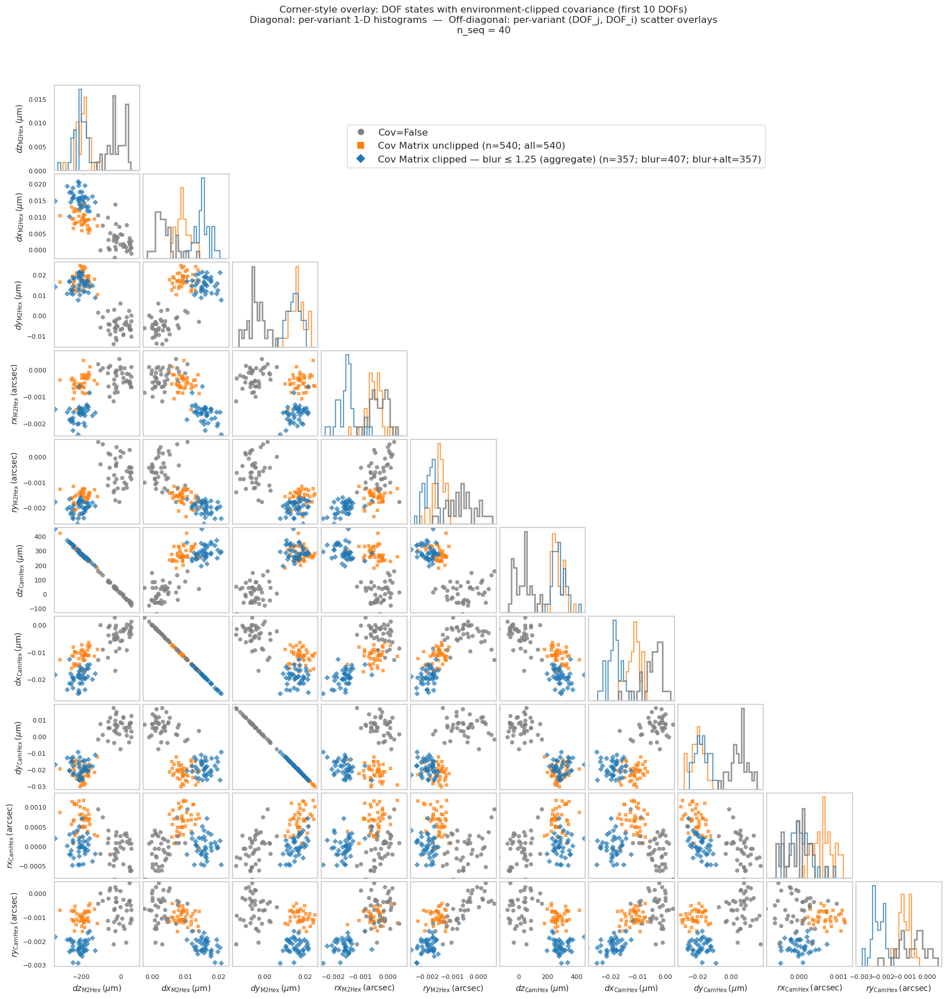

In [154]:
# Option 1: Only Cov=False + Cov Matrix unclipped + aggregate clipped variant
#
# Selection legend (see markdown cell above):
# - include_variants / exclude_variants accept indices (ints) or substrings (str).

_ = plot_corner_overlay(
    include_variants=["Cov=False", "unclipped", "aggregate"],
    exclude_variants=[],
    corner_n_show=corner_n_show,
    corner_max_points=corner_max_points,
    corner_bins=corner_bins,
    diag_mode=diag_mode,
    save_path="corner_overlay_covfalse_unclipped_aggregate.png",
    dpi=DEFAULT_DPI,
    legend_loc=LEGEND_LOC,
    legend_bbox=LEGEND_BBOX,
    legend_fontsize=LEGEND_FONTSIZE,
    verbose=True,
    show=True,
)


[corner] Available variants (select by index or substring):
  [0] Cov=False
  [1] Cov Matrix unclipped (n=540; all=540)
  [2] Cov Matrix clipped — blur ≤ 1.25 (aggregate) (n=357; blur=407; blur+alt=357)
  [3] Cov Matrix clipped — blur ≤ 1.0 (n=157; blur=186; blur+alt=157)
  [4] Cov Matrix clipped — 1.0 < blur ≤ 1.25 (n=200; blur=221; blur+alt=200)
  [5] Cov Matrix clipped — 1.25 < blur ≤ 1.5 (n=76; blur=102; blur+alt=76)
  [6] Cov Matrix clipped — blur > 1.5 (n=31; blur=31; blur+alt=31)
[corner] Include: ALL
[corner] Exclude spec: ['aggregate', 'blur > 1.5']
[corner] Plotting indices: [0, 1, 3, 4, 5]
  • Cov=False: min=-139.3038, max=159.3118, median=-0.0003
  • Cov Matrix unclipped (n=540; all=540): min=-310.6867, max=420.2957, median=-0.0007
  • Cov Matrix clipped — blur ≤ 1.0 (n=157; blur=186; blur+alt=157): min=-315.3503, max=429.3428, median=-0.0014
  • Cov Matrix clipped — 1.0 < blur ≤ 1.25 (n=200; blur=221; blur+alt=200): min=-350.0573, max=471.5669, median=-0.0019
  • Cov Matr

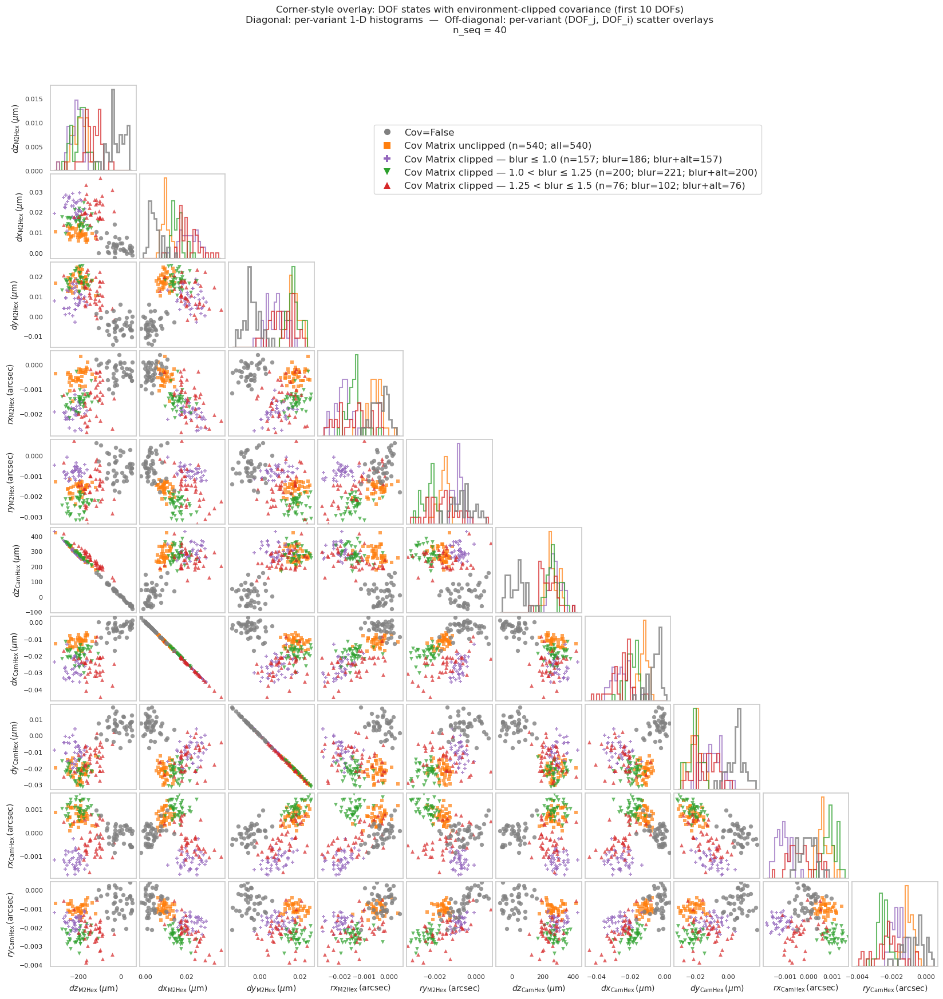

In [155]:
# Option 2: Cov=False + Cov Matrix unclipped + all per-bin clipped variants (no aggregate)
#
# Selection legend (see markdown cell above):
# - include_variants=None means "include all variants"; exclude_variants then removes matches.
# - Here we exclude the aggregate variant and keep excluding the worst-blur bin ("blur > 1.5").

_ = plot_corner_overlay(
    include_variants=None,
    exclude_variants=["aggregate", "blur > 1.5"],
    corner_n_show=corner_n_show,
    corner_max_points=corner_max_points,
    corner_bins=corner_bins,
    diag_mode=diag_mode,
    save_path="corner_overlay_covfalse_unclipped_bins.png",
    dpi=DEFAULT_DPI,
    legend_loc=LEGEND_LOC,
    legend_bbox=LEGEND_BBOX,
    legend_fontsize=LEGEND_FONTSIZE,
    verbose=True,
    show=True,
)